### Import


In [ ]:
!pip install texthero
!pip install gingerit
!pip install emoji
!pip install docx2txt
!pip install afinn
!pip install textblob
!pip install text2emotion
!pip install opencv-python

     |████████████████████████████████| 235 kB 12.5 MB/s 
     |████████████████████████████████| 1.5 MB 55.6 MB/s 
     |████████████████████████████████| 749 kB 56.0 MB/s 
  Attempting uninstall: regex
    Found existing installation: regex 2019.12.20
    Uninstalling regex-2019.12.20:
      Successfully uninstalled regex-2019.12.20
  Attempting uninstall: nltk
    Found existing installation: nltk 3.2.5
    Uninstalling nltk-3.2.5:
      Successfully uninstalled nltk-3.2.5
     |████████████████████████████████| 62 kB 883 kB/s 
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.
datascience 0.10.6 requires

#### Libraries

In [ ]:
import pandas as pd
import numpy as np
from numpy import array
import matplotlib.pyplot as plt


from sklearn.model_selection import train_test_split


import texthero as hero
import re
from nltk.corpus import stopwords
from bs4 import BeautifulSoup
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
import nltk
from nltk.stem import WordNetLemmatizer, SnowballStemmer
import spacy
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from gensim.models.phrases import Phrases, Phraser
from gingerit.gingerit import GingerIt

import emoji
import regex

import multiprocessing
import docx2txt

from gensim.models import Word2Vec

from afinn import Afinn
import text2emotion as te

from wordcloud import WordCloud, STOPWORDS
from textwrap import wrap

import seaborn as sns

import string
import os
import glob
from PIL import Image
from time import time

from google.colab import drive
from nltk.tokenize import word_tokenize
import textblob

from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import BatchNormalization

from keras import Input, layers
from keras import optimizers
from tensorflow.keras.optimizers import Adam
from keras.preprocessing import sequence
from keras.preprocessing import image
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.layers import LSTM, Embedding, Dense, Activation, Flatten, Reshape, Dropout
from keras.layers.wrappers import Bidirectional
from keras.layers.merge import add
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input
from keras.models import Model
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, AveragePooling2D
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.metrics import categorical_accuracy
from keras.models import model_from_json
from keras.callbacks import ModelCheckpoint
from keras.optimizers import *

from keras.callbacks import EarlyStopping
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
import tensorflow
import tensorflow.keras.backend as K
from keras.models import load_model

import cv2

import pickle

%matplotlib inline



[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


In [ ]:
# added for alicia's code, will clean up the repeated ones later
from google.colab import drive
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import math
import os

import tensorflow as tf
from tensorflow.keras import utils
from keras import layers
from keras.layers import Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D, Dropout
from keras.models import Model, load_model
from tensorflow.keras.optimizers import Adam, SGD
from keras.preprocessing import image
from keras.utils import layer_utils
from keras.utils.data_utils import get_file
from keras import applications
from tensorflow.keras.applications.resnet50 import preprocess_input
from keras.callbacks import CSVLogger, ModelCheckpoint, EarlyStopping
from keras.callbacks import ReduceLROnPlateau
import keras.backend as K
K.set_image_data_format('channels_last')
K.set_learning_phase(1)

import pydot
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
from keras.utils.vis_utils import plot_model

from keras.initializers import glorot_uniform
import scipy.misc
from matplotlib.pyplot import imshow
from matplotlib import pyplot as plt
%matplotlib inline

import cv2

from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator

/usr/local/lib/python3.7/dist-packages/keras/backend.py:414: UserWarning:

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.



In [ ]:
drive.mount('/gdrive')

Mounted at /gdrive


In [ ]:
os.environ['KAGGLE_USERNAME'] = 'aliciatoh' 
os.environ['KAGGLE_KEY'] = '473fcaf27e2d08e9416a0df9bc5c0040'

In [ ]:
start_path = "/gdrive/MyDrive/BT4221/"

#### Datasets

In [ ]:
# Flickr 8K
!kaggle datasets download shadabhussain/flickr8k
!unzip -q flickr8k.zip

token_path = '/content/Flickr_Data/Flickr_Data/Flickr_TextData/Flickr8k.token.txt'
train_images_path = '/content/Flickr_Data/Flickr_Data/Flickr_TextData/Flickr_8k.trainImages.txt'
test_images_path = '/content/Flickr_Data/Flickr_Data/Flickr_TextData/Flickr_8k.testImages.txt'
images_path = '/content/Flickr_Data/Flickr_Data/Images/'
glove_path = '/content'

doc = open(token_path,'r').read()
print(doc[:410])

100% 2.13G/2.13G [00:24<00:00, 37.5MB/s]

1000268201_693b08cb0e.jpg#0	A child in a pink dress is climbing up a set of stairs in an entry way .
1000268201_693b08cb0e.jpg#1	A girl going into a wooden building .
1000268201_693b08cb0e.jpg#2	A little girl climbing into a wooden playhouse .
1000268201_693b08cb0e.jpg#3	A little girl climbing the stairs to her playhouse .
1000268201_693b08cb0e.jpg#4	A little girl in a pink dress going into a wooden cabin .


In [ ]:
# Glove Embedding
! kaggle datasets download rtatman/glove-global-vectors-for-word-representation
!unzip -q glove-global-vectors-for-word-representation.zip

 98% 450M/458M [00:08<00:00, 84.5MB/s]
100% 458M/458M [00:08<00:00, 55.8MB/s]


In [ ]:
# Loading NRC text file

filepath = ('/gdrive/MyDrive/BT4221/NRC.txt')
emolex_df = pd.read_csv(filepath,
                    names=["word", "emotion", "association"],
                    sep='\t')
emolex_words = emolex_df.pivot(index='word',
                           columns='emotion',
                           values='association').reset_index()

emolex_words = emolex_words[1:]
emotions = emolex_words.columns.drop('word')

In [ ]:
# fer data
fer_data = pd.read_csv(start_path+'fer2013.csv', names=['emotion','pixels','usage'], na_filter=False)
im=fer_data['pixels']

fer_data = fer_data.iloc[1:]
fer_data['emotion'] = fer_data['emotion'].astype(str).astype(int)
# label_map = {0:'Anger', 1:'Disgust', 2:'Fear', 3:'Happy', 4:'Sad', 5:'Surprise', 6:'Neutral'}
# fer_data['emotion'].replace(label_map, inplace=True)

In [ ]:
fer_data.head(5)

,emotion,pixels,usage
1,0,70 80 82 72 58 58 60 63 54 58 60 48 89 115 121...,Training
2,0,151 150 147 155 148 133 111 140 170 174 182 15...,Training
3,2,231 212 156 164 174 138 161 173 182 200 106 38...,Training
4,4,24 32 36 30 32 23 19 20 30 41 21 22 32 34 21 1...,Training
5,6,4 0 0 0 0 0 0 0 0 0 0 0 3 15 23 28 48 50 58 84...,Training


### Preprocessing Data

In [ ]:
# read captions data

`load_clean_descriptions()` except `startseq` and `endseq` is joined later

In [ ]:
descriptions = dict()
for line in doc.split('\n'):
        tokens = line.split()
        if len(line) > 2:
          image_id = tokens[0].split('.')[0]
          image_desc = ' '.join(tokens[1:])
          if image_id not in descriptions:
              descriptions[image_id] = list()
          descriptions[image_id].append(image_desc)

descriptions_df = pd.DataFrame.from_dict(descriptions, orient='index')
descriptions_df['caption'] = descriptions_df.agg('. '.join, axis=1)

In [ ]:
class Preprocessing(object):
    def __init__(self, data, source_column_name='word_tags', target_column_name='word_tags_clean'):
        self.data = data
        self.source_column_name = source_column_name
        self.feature_name = target_column_name
        
    def remove_punctuation(self, text):
        text_nopunct = "".join([char for char in text if char not in string.punctuation])# It will discard all punctuations
        return text_nopunct
    
    def tokenize(self, text):
        # Match one or more characters which are not word character
        tokens = re.split('\W+', text) 
        return tokens
    
    def remove_stopwords(self, tokenized_list):
        # Remove all English Stopwords
        stopword = nltk.corpus.stopwords.words('english')
        text = [word.lower() for word in tokenized_list if word not in stopword]
        return text
    
    def stemming(self, tokenized_text):
        ps = nltk.PorterStemmer()
        text = [ps.stem(word) for word in tokenized_text]
        return text
    
    def lemmatizing(self, tokenized_text):
        wn = nltk.WordNetLemmatizer()
        text = [wn.lemmatize(word) for word in tokenized_text]
        return text

    # def lower
    
    def alnum(self, text):
        def hasNumbers(inputString):
            return any(char.isdigit() for char in inputString)
        
        text = [word for word in text if len(word) > 0 and word.isalnum() and not word.isdigit() and not hasNumbers(word)]
        return text

    def remove_hanging(self, text):
        text = [word for word in text if len(word)>1]
        return text

    
    def tokens_to_string(self, tokens_string):
        text = ' '.join(list(set(tokens_string)))
        return text
    
    def dropna(self):
        feature_name = self.feature_name
        if self.data[feature_name].isnull().sum() > 0:
            column_list=[feature_name]
            self.data = self.data.dropna(subset=column_list)
            return self.data
        
    def preprocessing(self):
        self.data[self.feature_name] = (self.data[self.source_column_name]
                                        .apply(lambda x: self.tokens_to_string(self.remove_hanging(self.alnum(
                                            self.lemmatizing(self.remove_stopwords(self.tokenize(self.remove_punctuation(x)))))))))

        return self.data
    
    def save(self, filepath="./data/tags_cleaned.csv"):
        self.data.to_csv(filepath, index=False, sep=',')  
        
    def load(self, filepath="./data/tags_cleaned.csv"):
        self.data = pd.read_csv(filepath)
        return self.data

    

In [ ]:
preprocess = Preprocessing(descriptions_df, 'caption')
descriptions_df = preprocess.preprocessing()

In [ ]:
descriptions_df

,0,1,2,3,4,caption,word_tags_clean
1000268201_693b08cb0e,A child in a pink dress is climbing up a set o...,A girl going into a wooden building .,A little girl climbing into a wooden playhouse .,A little girl climbing the stairs to her playh...,A little girl in a pink dress going into a woo...,A child in a pink dress is climbing up a set o...,climbing going building playhouse way entry dr...
1001773457_577c3a7d70,A black dog and a spotted dog are fighting,A black dog and a tri-colored dog playing with...,A black dog and a white dog with brown spots a...,Two dogs of different breeds looking at each o...,Two dogs on pavement moving toward each other .,A black dog and a spotted dog are fighting. A ...,playing looking street dog breed toward moving...
1002674143_1b742ab4b8,A little girl covered in paint sits in front o...,A little girl is sitting in front of a large p...,A small girl in the grass plays with fingerpai...,There is a girl with pigtails sitting in front...,Young girl with pigtails painting outside in t...,A little girl covered in paint sits in front o...,paint rainbow outside front painting small fin...
1003163366_44323f5815,A man lays on a bench while his dog sits by him .,A man lays on the bench to which a white dog i...,a man sleeping on a bench outside with a white...,A shirtless man lies on a park bench with his ...,man laying on bench holding leash of dog sitti...,A man lays on a bench while his dog sits by hi...,also outside bench ground lie dog leash tied m...
1007129816_e794419615,A man in an orange hat starring at something .,A man wears an orange hat and glasses .,A man with gauges and glasses is wearing a Bli...,A man with glasses is wearing a beer can croch...,The man with pierced ears is wearing glasses a...,A man in an orange hat starring at something ....,crocheted glass gauge something wear starring ...
...,...,...,...,...,...,...,...
990890291_afc72be141,A man does a wheelie on his bicycle on the sid...,A man is doing a wheelie on a mountain bike .,A man on a bicycle is on only the back wheel .,Asian man in orange hat is popping a wheelie o...,Man on a bicycle riding on only one wheel .,A man does a wheelie on his bicycle on the sid...,mountain one wheel bicycle hat wheelie back bi...
99171998_7cc800ceef,A group is sitting around a snowy crevasse .,A group of people sit atop a snowy mountain .,A group of people sit in the snow overlooking ...,Five children getting ready to sled .,Five people are sitting together in the snow .,A group is sitting around a snowy crevasse .. ...,group mountain people together getting sit sle...
99679241_adc853a5c0,A grey bird stands majestically on a beach whi...,A large bird stands in the water on the beach .,A tall bird is standing on the sand beside the...,A water bird standing at the ocean 's edge .,A white crane stands tall as it looks out upon...,A grey bird stands majestically on a beach whi...,roll look bird grey ocean wave stand upon stan...
997338199_7343367d7f,A person stands near golden walls .,a woman behind a scrolled wall is writing,A woman standing near a decorated wall writes .,The walls are covered in gold and patterns .,"Woman writing on a pad in room with gold , dec...",A person stands near golden walls .. a woman b...,woman person pattern room covered gold pad beh...


In [ ]:
#check usage values
#80% training, 10% validation and 10% test
fer_data.usage.value_counts()

#split data into training, validation and test set
data_train = fer_data[fer_data['usage']=='Training'].copy()
data_val   = fer_data[fer_data['usage']=='PublicTest'].copy()
data_test  = fer_data[fer_data['usage']=='PrivateTest'].copy()
print("train shape: {}, \nvalidation shape: {}, \ntest shape: {}".format(data_train.shape, data_val.shape, data_test.shape))


train shape: (28709, 3), 
validation shape: (3589, 3), 
test shape: (3589, 3)


### Detecting Sentiment/Emotion from captions

In [ ]:
# # initialising afinn
# afinn = Afinn(emoticons=True)

# # defining function for nrc emotion 
# def emotion(sent):

#     emo_df = []
#     for word in word_tokenize(sent):
#         emo_score = emolex_words[emolex_words.word == word].drop(columns = 'word')

#         if len(emo_score) != 0:
#             values = emo_score.values[0].tolist()
#             values = list(map(int, values))
#             emo_df.append(values)
#     value = [sum(x) for x in zip(*emo_df)]

#     return value


# # Obtaining the dominant emotion
# def max_emotion(l):
#   emotions_list = {0: "Angry", 1: "Anticipation", 2:"Disgust", 3:"Fear", 4:"Happy", 5:"Negative", 6:"Positive", 7:"Sad", 8:"Surprise", 9:"Trust"}
#   if all(v == 0 for v in l):
#       return []
#   else:
#       indices = [i for i, x in enumerate(l) if x == max(l)]
#       emotions_list = list(map(emotions_list.__getitem__, indices))
#       if 'Anticipation' in emotions_list and 'Surprise' not in emotions_list:
#         emotions_list.append('Surprise')
#       if 'Anticipation' in emotions_list:
#         emotions_list.remove('Anticipation')
#       if 'Trust' in emotions_list:
#         emotions_list.remove('Trust')
#       if len(emotions_list) == 0:
#         emotions_list.append('Neutral')

#       return emotions_list

In [ ]:
# def get_emotions(df_texts, col_name):
#   all_values = []
#   for t in df_texts[col_name].values:
#     text = t
#     values = []

#     # length
#     values.append(len(text.split()))

#     # polarity and subjectivity 
#     blob = textblob.TextBlob(text)
#     values.append(blob.sentiment.polarity)
#     values.append(blob.sentiment.subjectivity)

#     # afinn score
#     values.append(afinn.score(text))

#     # text 2 emotion
#     values.extend(list(te.get_emotion(text).values()))

#     all_values.append(values)

#   # concatenating   
#   emotions_df = pd.DataFrame(all_values, columns = ['Length','Polarity','Subjectivity', 'Afinn', 'Happy', 'Angry', 'Surprise','Sad', 'Fear'])
#   return_df = pd.concat([df_texts.reset_index(drop=True), emotions_df.reset_index(drop=True)], axis = 1)

#   # nrc emotions  
#   return_df["emotion"] = df_texts[col_name].apply(lambda x: emotion(x))
#   return_df[emotions] = pd.DataFrame(return_df.emotion.tolist(), index= return_df.index)
#   #return_df[emotions] /= return_df['Length']
#   return_df['Dominant Emotion'] = return_df['emotion'].apply(lambda x: max_emotion(x))
#   return_df = return_df.fillna(0)

#   # changing column names
#   return_df.columns = return_df.columns = ['nrc_' + i if ix > 11 else i for ix, i in enumerate(return_df.columns)]

#   return return_df
  
  

In [ ]:
# descriptions_df = descriptions_df.drop(columns = [0,1,2,3,4])
# descriptions_df = descriptions_df.reset_index()

In [ ]:
# descriptions_df

In [ ]:
# descriptions_df_emotions = get_emotions(descriptions_df, 'word_tags_clean')

In [ ]:
# descriptions_df_emotions

In [ ]:
# descriptions_df_emotions.to_csv(start_path+'descriptions_emotions.csv')
descriptions_df_emotions = pd.read_csv(start_path+'descriptions_emotions.csv')

### Exploring Images and Caption Data

FER Data (image + emotion)

In [ ]:
#check target labels of FER data

emotion_map = {0: 'Angry', 1: 'Digust', 2: 'Fear', 3: 'Happy', 4: 'Sad', 5: 'Surprise', 6: 'Neutral'}
emotion_counts = fer_data['emotion'].value_counts(sort=False).reset_index()
emotion_counts.columns = ['emotion', 'number']
emotion_counts['emotion'] = emotion_counts['emotion'].map(emotion_map)
emotion_counts

,emotion,number
0,Angry,4953
1,Digust,547
2,Fear,5121
3,Happy,8989
4,Sad,6077
5,Surprise,4002
6,Neutral,6198


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



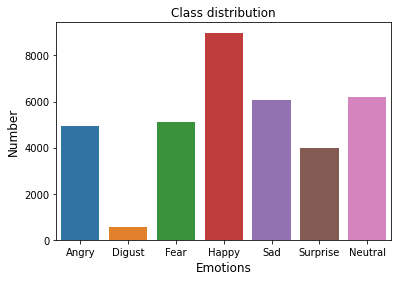

In [ ]:
# Plotting a bar graph of the class distributions

plt.figure(figsize=(6,4))
sns.barplot(emotion_counts.emotion, emotion_counts.number)
plt.title('Class distribution')
plt.ylabel('Number', fontsize=12)
plt.xlabel('Emotions', fontsize=12)
plt.show()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr

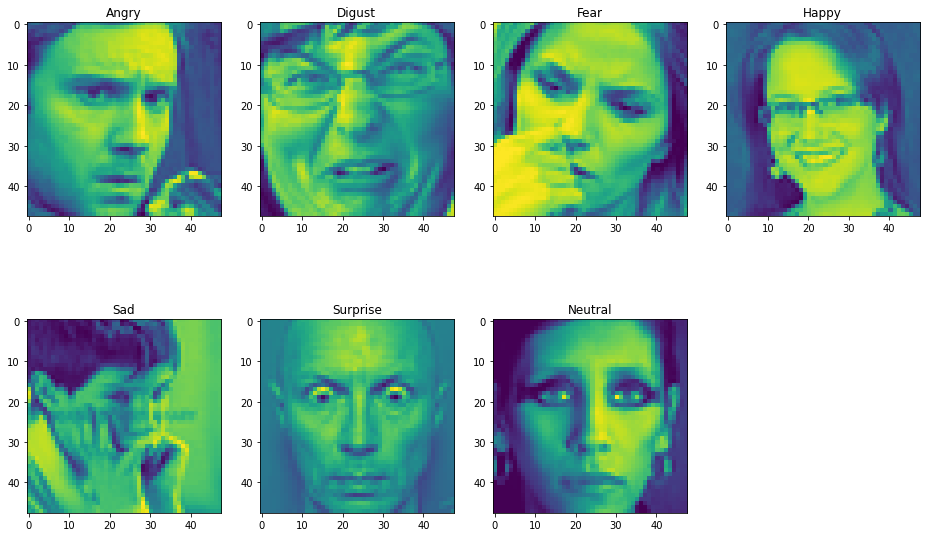

In [ ]:
# fer images
def row2image(row):
    pixels, emotion = row['pixels'], emotion_map[row['emotion']]
    img = np.array(pixels.split())
    img = img.reshape(48,48)
    image = np.zeros((48,48,3))
    image[:,:,0] = img
    image[:,:,1] = img
    image[:,:,2] = img
    return np.array([img.astype(np.uint8), emotion])

plt.figure(0, figsize=(16,10))
for i in range(1,8):
    face = fer_data[fer_data['emotion'] == i-1].iloc[0]
    img = row2image(face)
    plt.subplot(2,4,i)
    plt.imshow(img[0])
    plt.title(img[1])

plt.show()  

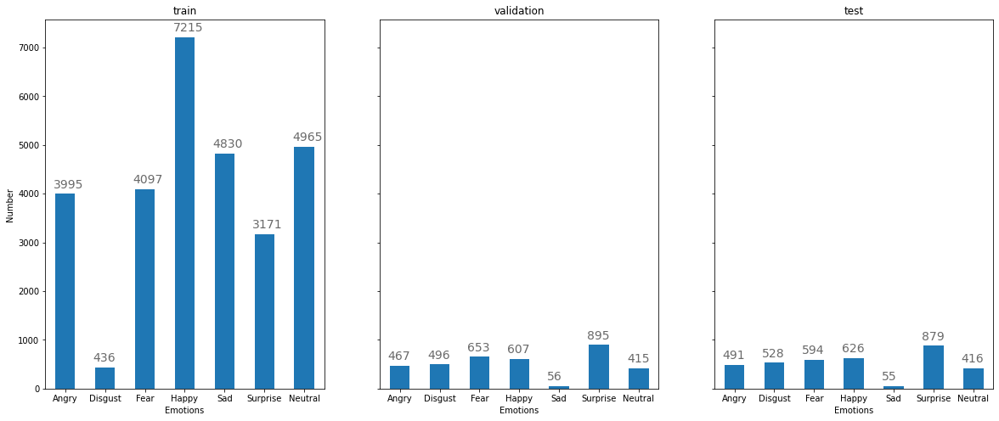

In [ ]:
# barplot class distribution of train, val and test
emotion_labels = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']

def setup_axe(axe,df,title):
    df['emotion'].value_counts(sort=False).plot(ax=axe, kind='bar', rot=0)
    axe.set_xticklabels(emotion_labels)
    axe.set_xlabel("Emotions")
    axe.set_ylabel("Number")
    axe.set_title(title)
    
    # set individual bar lables using above list
    for i in axe.patches:
        # get_x pulls left or right; get_height pushes up or down
        axe.text(i.get_x()-.05, i.get_height()+120, \
                str(round((i.get_height()), 2)), fontsize=14, color='dimgrey',
                    rotation=0)

   
fig, axes = plt.subplots(1,3, figsize=(20,8), sharey=True)
setup_axe(axes[0],data_train,'train')
setup_axe(axes[1],data_val,'validation')
setup_axe(axes[2],data_test,'test')
plt.show()

Caption data

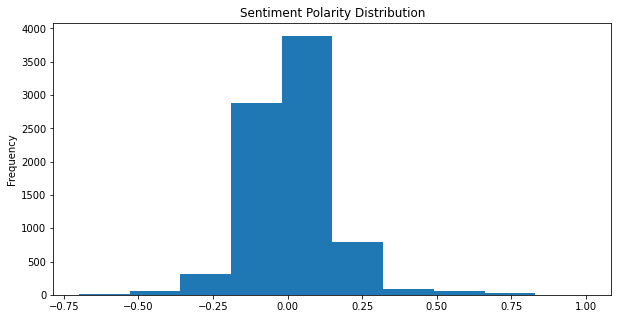

In [ ]:
descriptions_df_emotions['Polarity'].plot(
    kind='hist',
    title='Sentiment Polarity Distribution',
    figsize=(10,5))

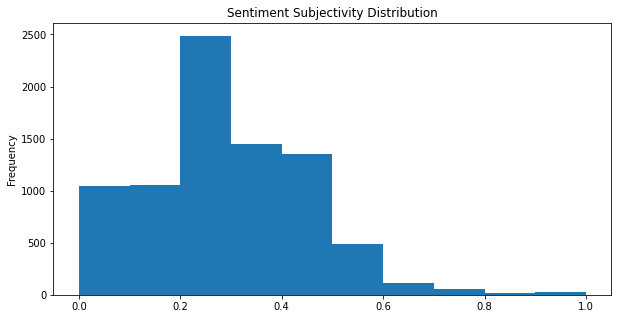

In [ ]:
descriptions_df_emotions['Subjectivity'].plot(
    kind='hist',
    title='Sentiment Subjectivity Distribution',
    figsize=(10,5))

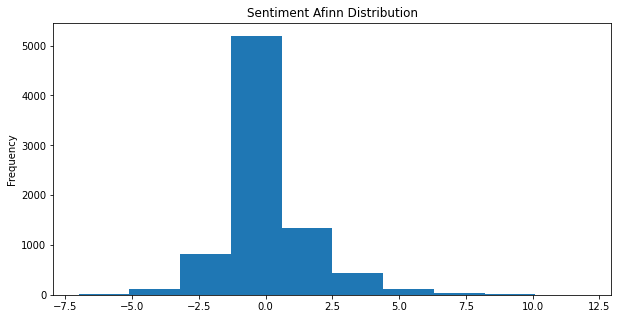

In [ ]:
descriptions_df_emotions['Afinn'].plot(
    kind='hist',
    title='Sentiment Afinn Distribution',
    figsize=(10,5))

# can do for others too

#### Bigram

In [ ]:
gram = [row.split() for row in descriptions_df_emotions.loc[:, 'word_tags_clean']]
bigram_phrases = Phrases(gram, min_count=10, progress_per=10000)
bigram = Phraser(bigram_phrases)
sentences_b = bigram[gram]
descriptions_df_emotions["Bigram"] = sentences_b
descriptions_df_emotions['Bigram'] = [','.join(map(str, l)).replace(",", " ") for l in descriptions_df_emotions['Bigram']]

# trigram_phrases = Phrases(bigram_phrases[gram], min_count=1, progress_per=10000)
# trigram = Phraser(trigram_phrases)
# sentences_t = trigram[gram]
# df["Trigram"] = sentences_t
# df['Trigram'] = [','.join(map(str, l)).replace(",", " ") for l in df['Trigram']]

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



#### Building corpus using word2vec

In [ ]:
cores = multiprocessing.cpu_count()
w2v_model = Word2Vec(min_count=10,
                     window=3,
                     size=15,
                     sample=6e-5, 
                     alpha=0.05, 
                     min_alpha=0.0007, 
                     negative=20,
                     workers=cores-1)


In [ ]:
w2v_model.build_vocab(sentences_b, progress_per=10000)
w2v_model.train(sentences_b, total_examples=w2v_model.corpus_count, epochs=5, report_delay=1)  # epochs = 40

(211673, 746635)

In [ ]:
w2v_model.wv.most_similar(positive=["boy"])

[('friend', 0.9994966983795166),
 ('finger', 0.9994027018547058),
 ('whilst', 0.9993373155593872),
 ('green', 0.9992662668228149),
 ('star', 0.9991961121559143),
 ('digging', 0.999174177646637),
 ('tricycle', 0.9991553425788879),
 ('child', 0.9991551637649536),
 ('shirtless', 0.9991428852081299),
 ('caught', 0.9991061091423035)]

In [ ]:
w2v_model.wv.most_similar(positive=["girl"])

[('dancing', 0.9993849992752075),
 ('counter', 0.9992635250091553),
 ('cross', 0.9992631077766418),
 ('people', 0.9992541074752808),
 ('men_group', 0.9992371797561646),
 ('relaxing', 0.999211847782135),
 ('individual', 0.9991689920425415),
 ('pool', 0.9991248250007629),
 ('picnic', 0.9991225004196167),
 ('funny', 0.9991202354431152)]

In [ ]:
w2v_model.wv.doesnt_match(['happy', 'sad', 'angry'])

/usr/local/lib/python3.7/dist-packages/gensim/models/keyedvectors.py:895: FutureWarning:

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.



'happy'

#### Word cloud

In [ ]:
cv=CountVectorizer(analyzer='word')
data=cv.fit_transform(descriptions_df_emotions['word_tags_clean'])
df_dtm = pd.DataFrame(data.toarray(), columns=cv.get_feature_names())
df_dtm.index=descriptions_df_emotions.index

df_dtm=df_dtm.transpose()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



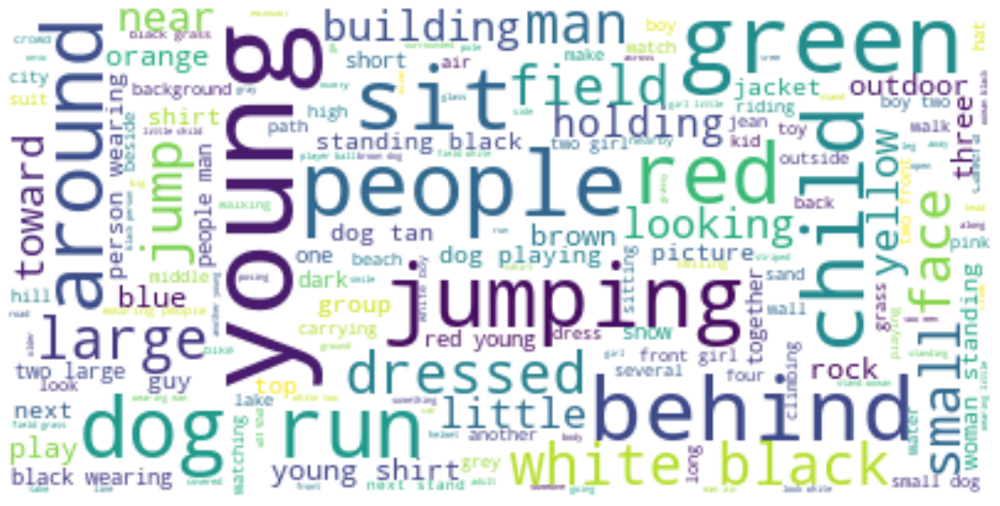

In [ ]:
text = " ".join(text for text in descriptions_df_emotions.word_tags_clean)
wordcloud = WordCloud(max_font_size=50, max_words=200, background_color="white").generate(text)
plt.figure(figsize=[20,10])
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()


In [ ]:
descriptions_df_emotions['nrc_Dominant Emotion'] = descriptions_df_emotions['nrc_Dominant Emotion'].apply(lambda x: x.replace("[",'').replace("]",'').replace("'",''))
descriptions_df_emotions['nrc_Dominant Emotion'] = descriptions_df_emotions['nrc_Dominant Emotion'].replace(r'^\s*$', 'Neutral', regex=True)

descriptions_df_emotions['emotion_label'] = descriptions_df_emotions['nrc_Dominant Emotion'].apply(lambda x: x.split(",")[0])

Text2emotions

Happy


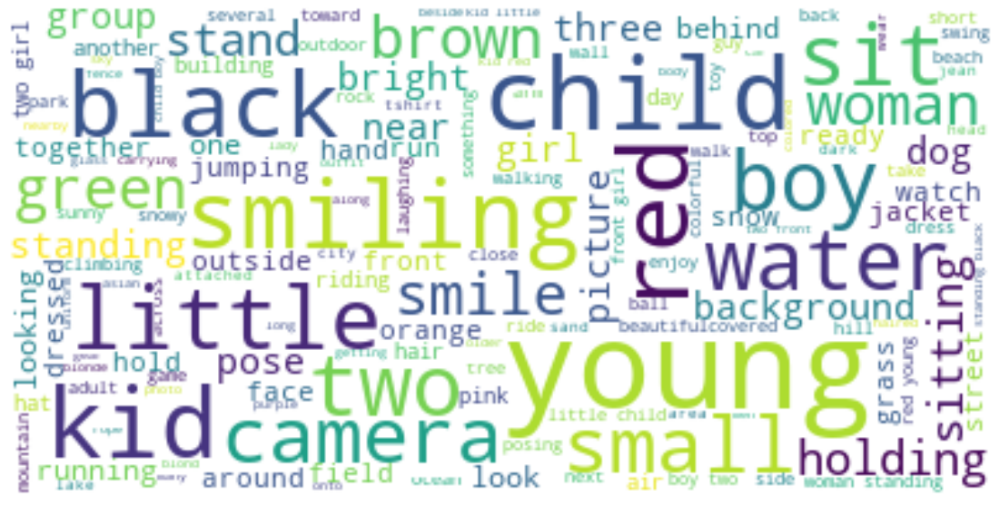

Angry


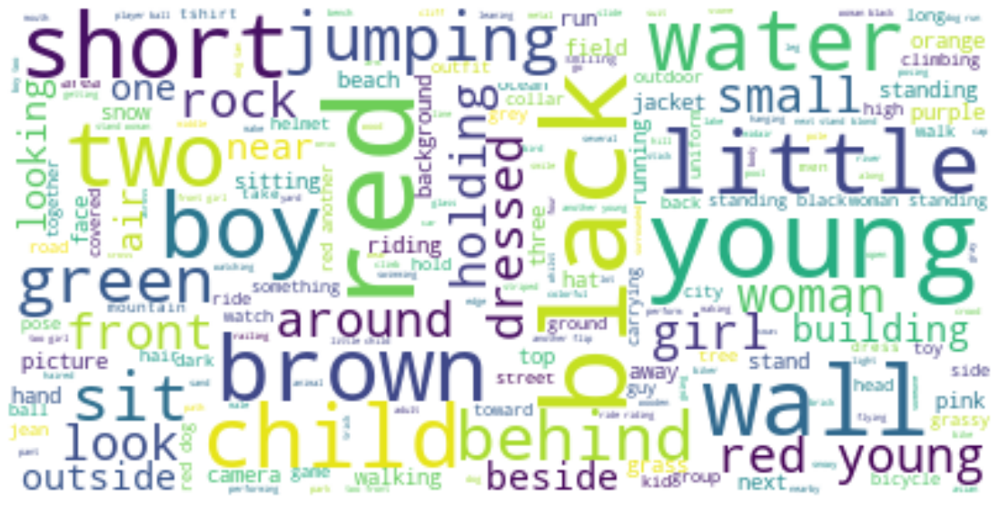

Surprise


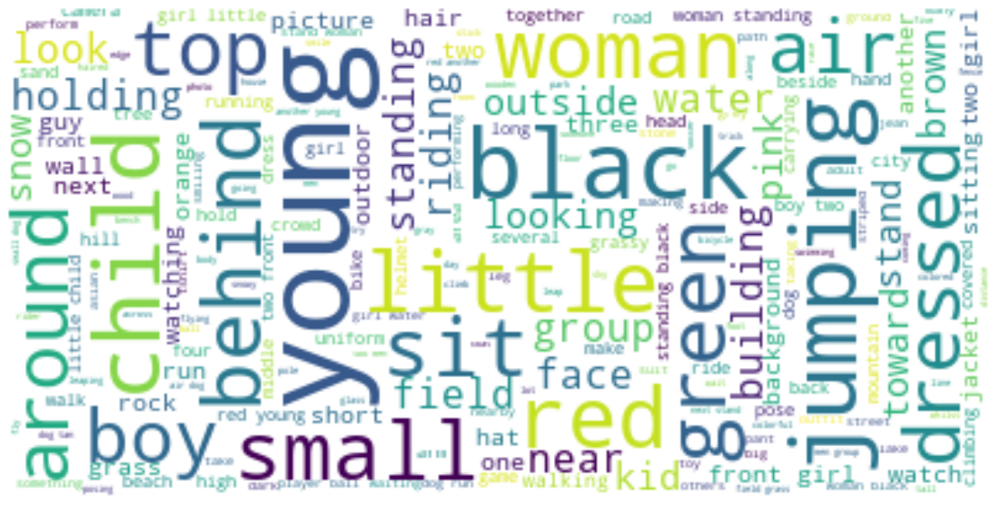

Sad


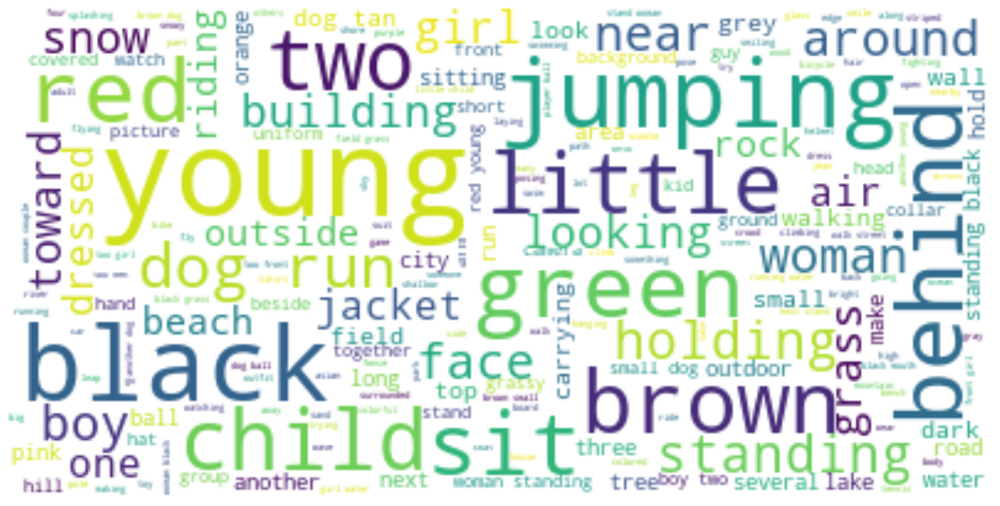

Fear


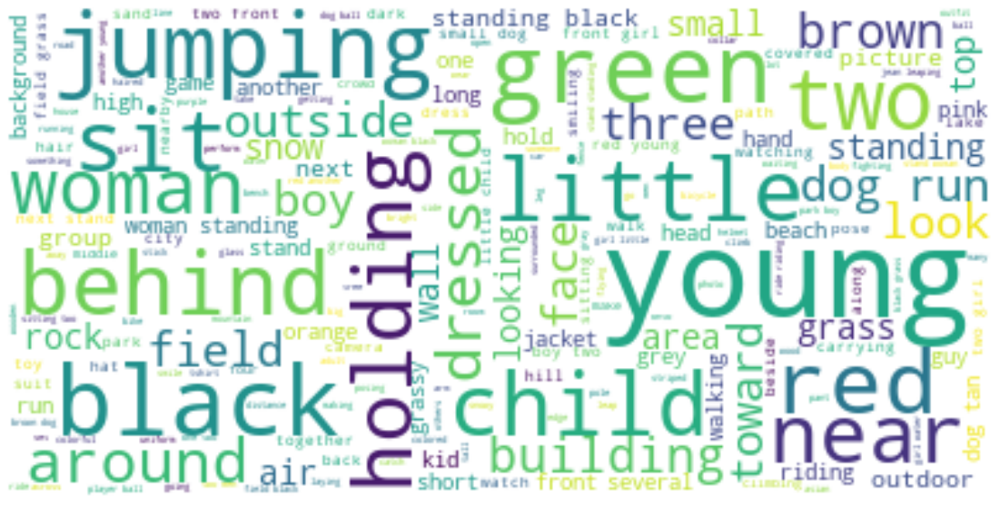

In [ ]:
t2e = ['Happy', 'Angry', 'Surprise','Sad', 'Fear']
stopwords = set(STOPWORDS)
stopwords.update(['person', 'people', 'man', ' man', 'yellow', 'white', 'jump', 'play', 'playing', 'wearing', 'blue', 'shirt', 'large'])
for i in t2e:
  new_df =  descriptions_df_emotions[descriptions_df_emotions[i]>0] 
  text = " ".join(text for text in new_df.word_tags_clean)
  print(i)
  wordcloud = WordCloud(max_font_size=50, max_words=200, background_color="white", stopwords=stopwords).generate(text)
  plt.figure(figsize=[20,10])
  plt.imshow(wordcloud, interpolation="bilinear")
  plt.axis("off")
  plt.show()
  

NRC emotions

In [ ]:
nrc = ['Angry', 'Disgust', 'Fear', 'Happy', 'Negative',
       'Positive', 'Sad', 'Surprise', 'Neutral']

Angry


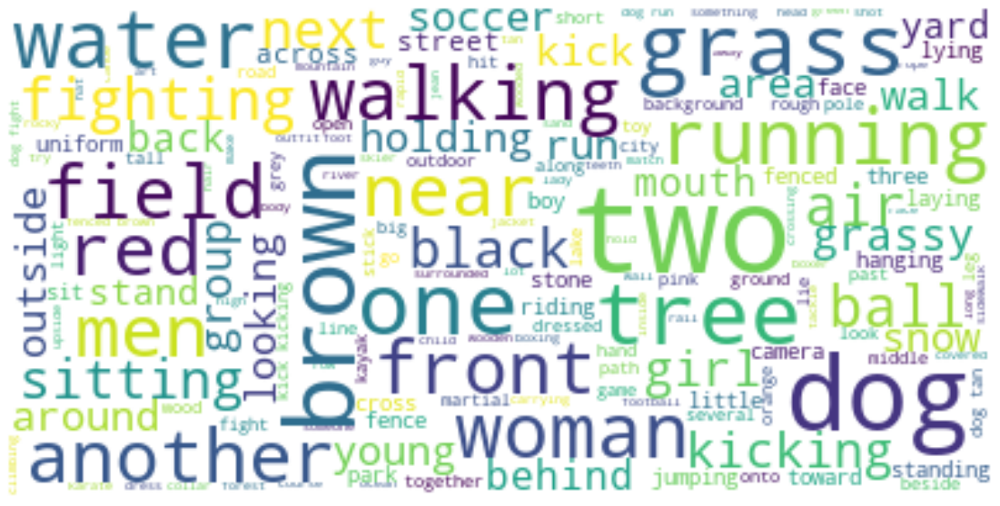

Disgust


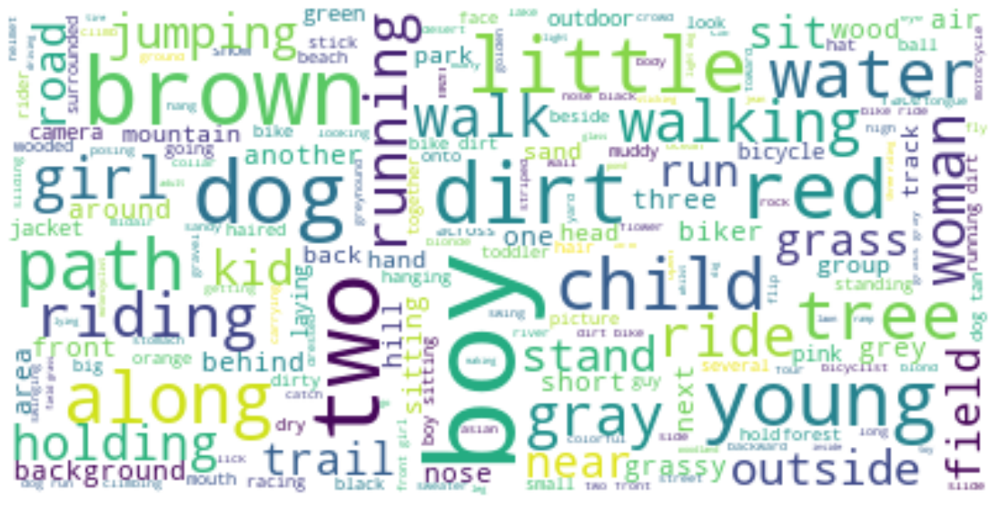

Fear


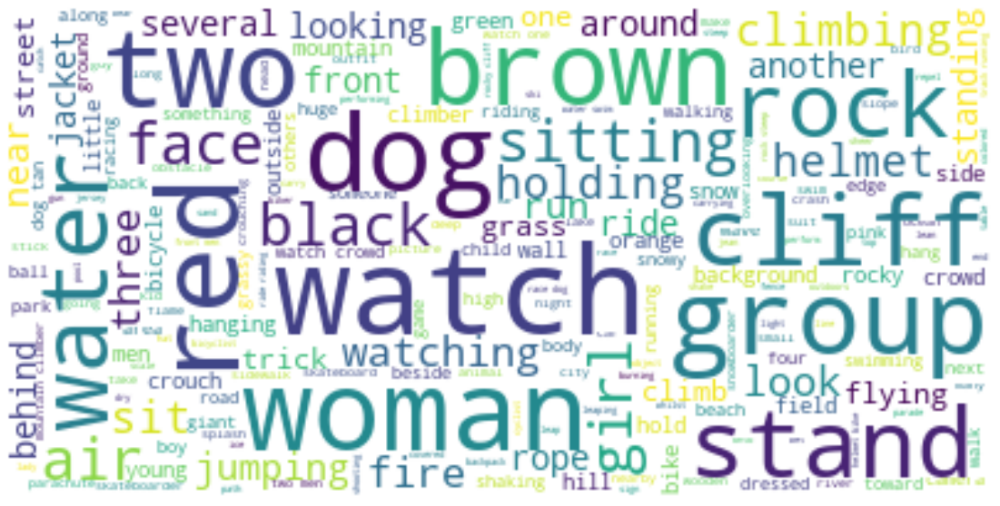

Happy


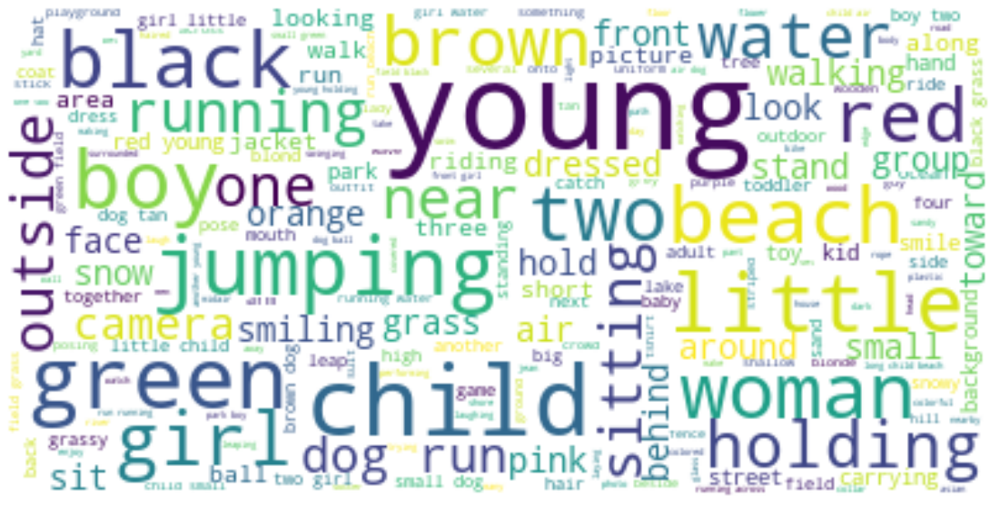

Negative


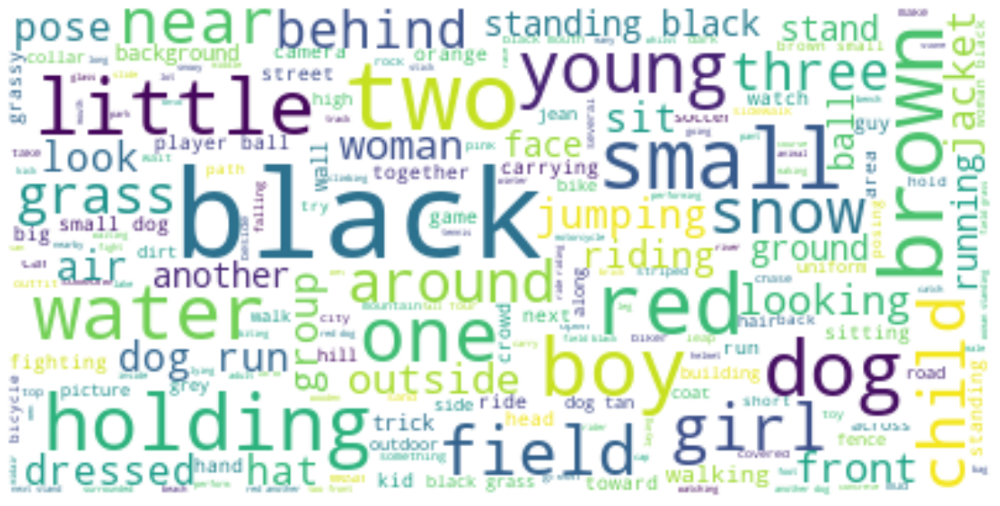

Positive


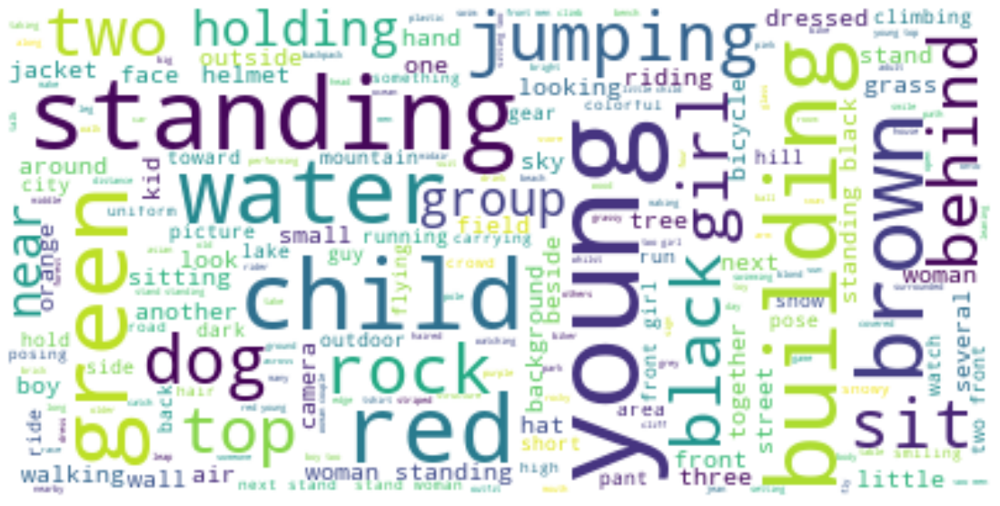

Sad


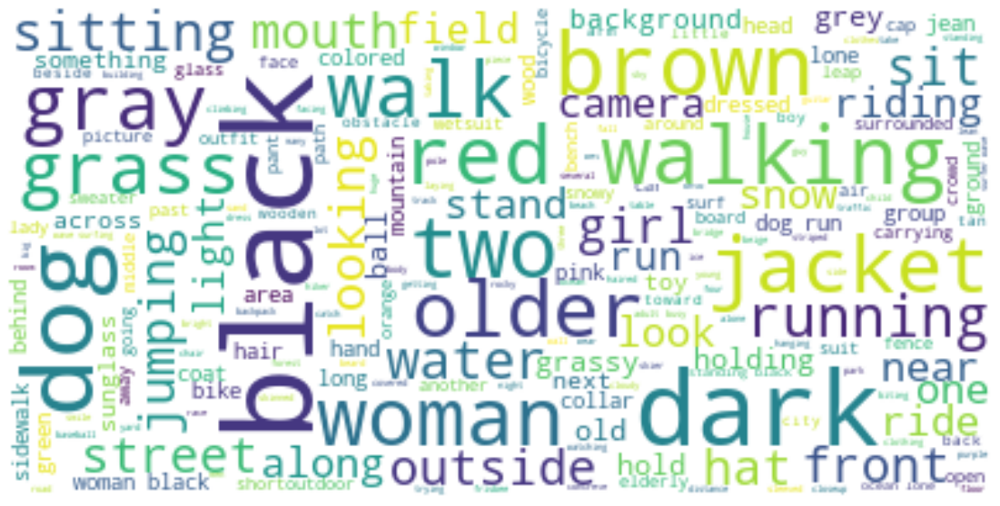

Surprise


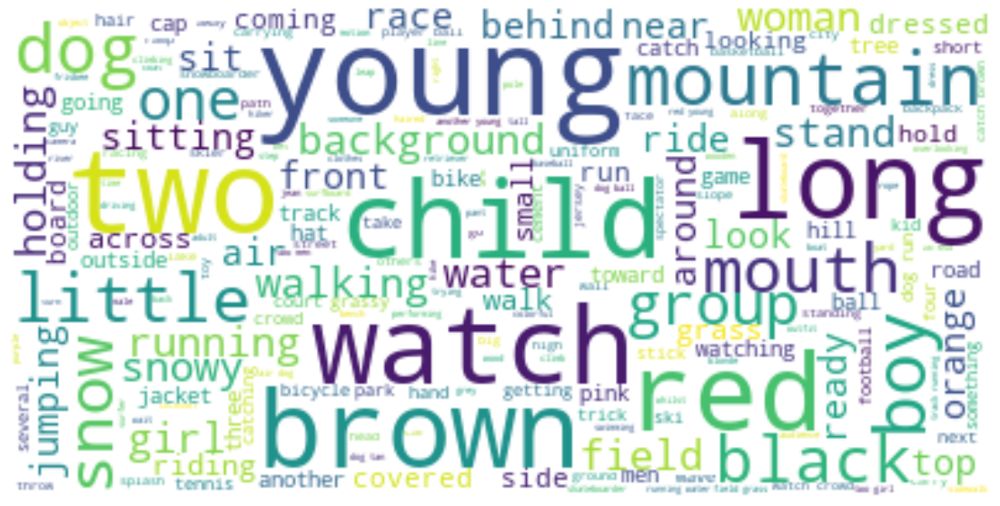

Neutral


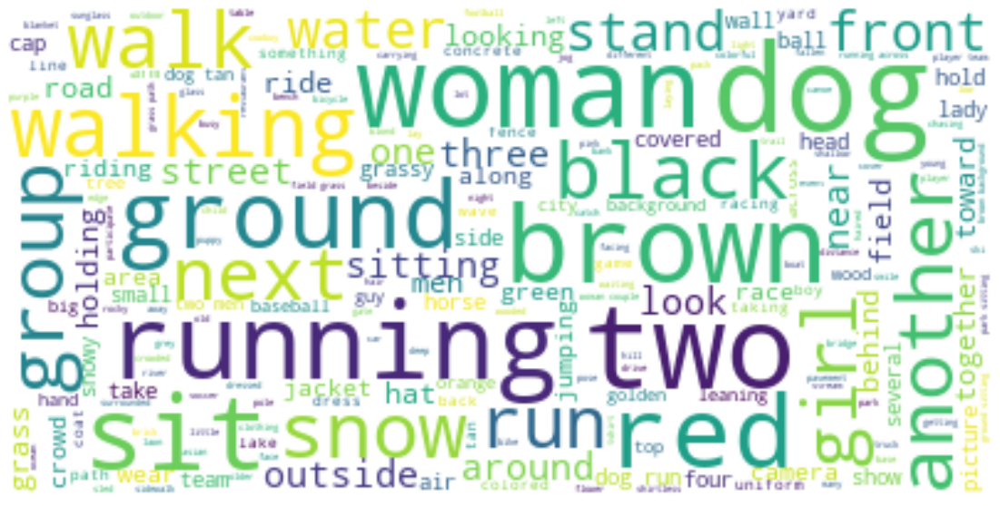

In [ ]:
stopwords = set(STOPWORDS)
stopwords.update(['person', 'people', 'man', ' man', 'yellow', 'white', 'jump', 'play', 'playing', 'wearing', 'blue', 'shirt', 'large'])
for i in nrc:
  new_df =  descriptions_df_emotions[descriptions_df_emotions['emotion_label']==i] 
  text = " ".join(text for text in new_df.word_tags_clean)
  print(i)
  wordcloud = WordCloud(max_font_size=50, max_words=200, background_color="white", stopwords=stopwords).generate(text)
  plt.figure(figsize=[20,10])
  plt.imshow(wordcloud, interpolation="bilinear")
  plt.axis("off")
  plt.show()
  

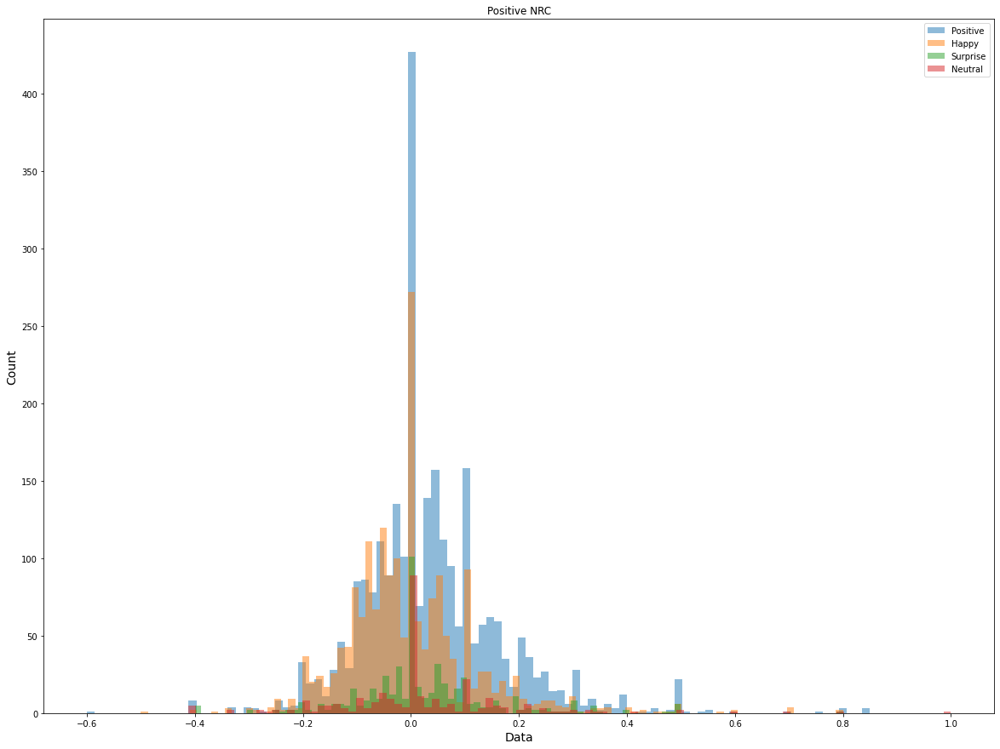

In [ ]:
plt.figure(figsize=(20,15))

plt.hist(descriptions_df_emotions[descriptions_df_emotions['emotion_label']=='Positive']['Polarity'], bins=100, alpha=0.5, label="Positive")
plt.hist(descriptions_df_emotions[descriptions_df_emotions['emotion_label']=='Happy']['Polarity'], bins=100, alpha=0.5, label="Happy")
plt.hist(descriptions_df_emotions[descriptions_df_emotions['emotion_label']=='Surprise']['Polarity'], bins=100, alpha=0.5, label="Surprise")
plt.hist(descriptions_df_emotions[descriptions_df_emotions['emotion_label']=='Neutral']['Polarity'], bins=100, alpha=0.5, label="Neutral")

plt.xlabel("Data", size=14)
plt.ylabel("Count", size=14)
plt.title("Positive NRC")
plt.legend(loc='upper right')

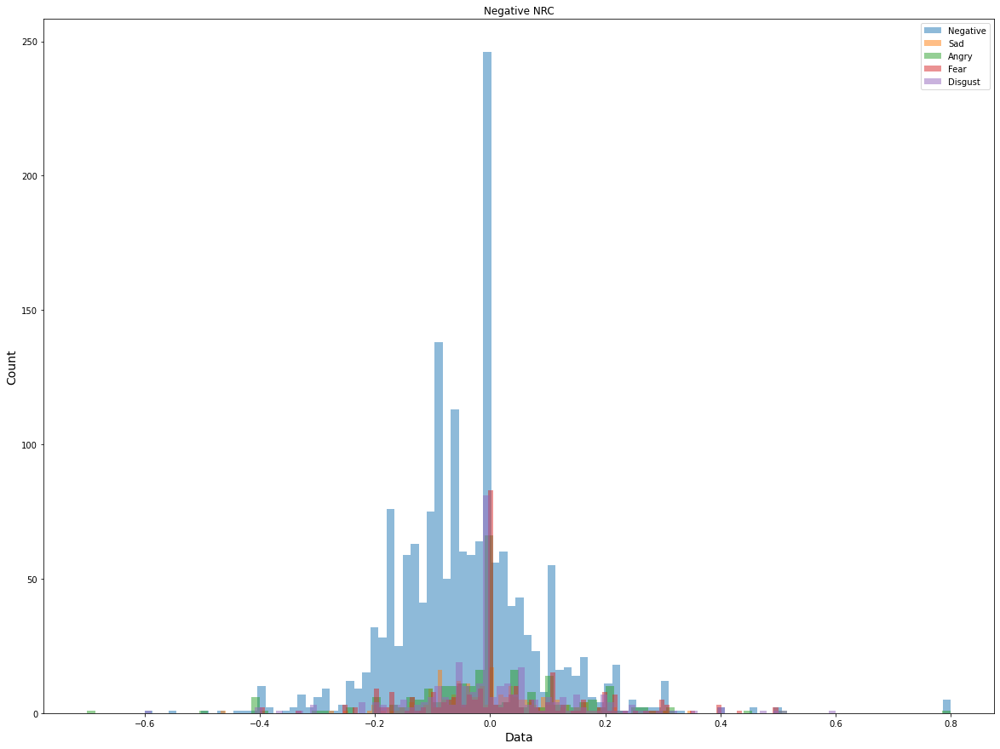

In [ ]:
plt.figure(figsize=(20,15))

plt.hist(descriptions_df_emotions[descriptions_df_emotions['emotion_label']=='Negative']['Polarity'], bins=100, alpha=0.5, label="Negative")
plt.hist(descriptions_df_emotions[descriptions_df_emotions['emotion_label']=='Sad']['Polarity'], bins=100, alpha=0.5, label="Sad")
plt.hist(descriptions_df_emotions[descriptions_df_emotions['emotion_label']=='Angry']['Polarity'], bins=100, alpha=0.5, label="Angry")
plt.hist(descriptions_df_emotions[descriptions_df_emotions['emotion_label']=='Fear']['Polarity'], bins=100, alpha=0.5, label="Fear")
plt.hist(descriptions_df_emotions[descriptions_df_emotions['emotion_label']=='Disgust']['Polarity'], bins=100, alpha=0.5, label="Disgust")


plt.xlabel("Data", size=14)
plt.ylabel("Count", size=14)
plt.title("Negative NRC")
plt.legend(loc='upper right')

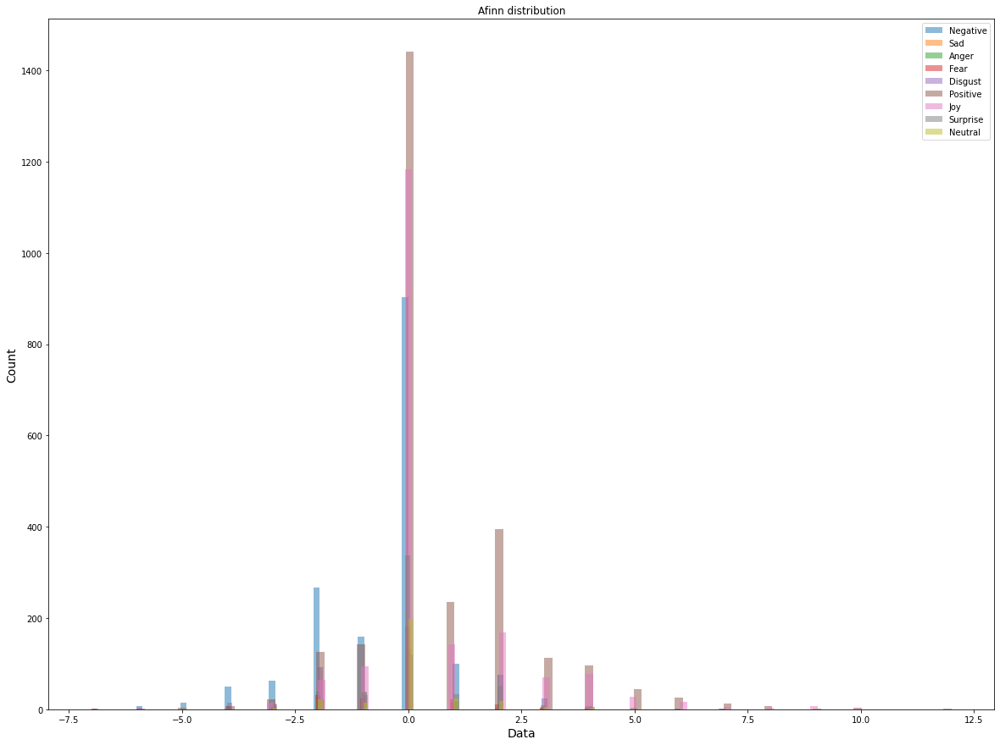

In [ ]:
plt.figure(figsize=(20,15))

plt.hist(descriptions_df_emotions[descriptions_df_emotions['emotion_label']=='Negative']['Afinn'], bins=100, alpha=0.5, label="Negative")
plt.hist(descriptions_df_emotions[descriptions_df_emotions['emotion_label']=='Sad']['Afinn'], bins=100, alpha=0.5, label="Sad")
plt.hist(descriptions_df_emotions[descriptions_df_emotions['emotion_label']=='Angry']['Afinn'], bins=100, alpha=0.5, label="Anger")
plt.hist(descriptions_df_emotions[descriptions_df_emotions['emotion_label']=='Fear']['Afinn'], bins=100, alpha=0.5, label="Fear")
plt.hist(descriptions_df_emotions[descriptions_df_emotions['emotion_label']=='Disgust']['Afinn'], bins=100, alpha=0.5, label="Disgust")

plt.hist(descriptions_df_emotions[descriptions_df_emotions['emotion_label']=='Positive']['Afinn'], bins=100, alpha=0.5, label="Positive")
plt.hist(descriptions_df_emotions[descriptions_df_emotions['emotion_label']=='Happy']['Afinn'], bins=100, alpha=0.5, label="Joy")
plt.hist(descriptions_df_emotions[descriptions_df_emotions['emotion_label']=='Surprise']['Afinn'], bins=100, alpha=0.5, label="Surprise")
plt.hist(descriptions_df_emotions[descriptions_df_emotions['emotion_label']=='Neutral']['Afinn'], bins=100, alpha=0.5, label="Neutral")

plt.xlabel("Data", size=14)
plt.ylabel("Count", size=14)
plt.title("Afinn distribution")
plt.legend(loc='upper right')

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



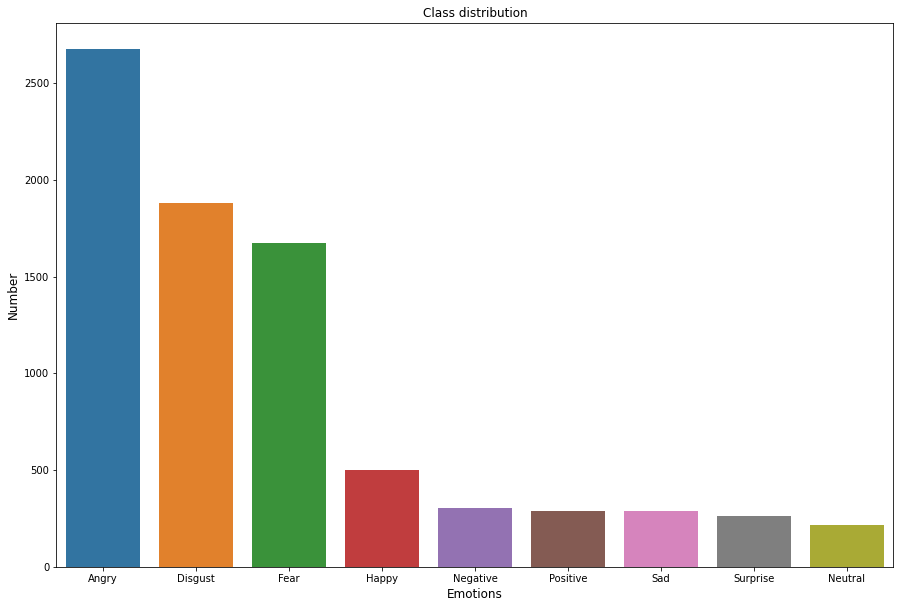

In [ ]:
plt.figure(figsize=(15,10))
sns.barplot(nrc, descriptions_df_emotions["emotion_label"].value_counts())
plt.title('Class distribution')
plt.ylabel('Number', fontsize=12)
plt.xlabel('Emotions', fontsize=12)
plt.show()

#### Bar plot of top 20 words and bigrams

In [ ]:
def get_top_n_bigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

In [ ]:
common_words_bi = get_top_n_bigram(descriptions_df_emotions.loc[:, 'word_tags_clean'], 20)

In [ ]:
df_freq_bi = pd.DataFrame(common_words_bi, columns = ['Bi Grams' , 'count'])

In [ ]:
df_freq_bi

,Bi Grams,count
0,dog run,303
1,white black,299
2,young shirt,236
3,standing black,215
4,dog playing,201
5,woman standing,197
6,dog tan,195
7,person wearing,188
8,two large,185
9,people man,178


### Model to detect facial expression

#### Basic FER Model

----------------------------------------------------------------------------------
##### Pre-processing data
##### Summary:
1. Splitting dataset into 3 parts: train, validation, test
1. Convert strings to lists of integers
1. Reshape to 48x48 and normalise grayscale image with 255.0
1. Perform one-hot encoding label, e.g. class 3 to [0,0,0,1,0,0,0]

Notice that the later two subplots share the same y-axis with the first subplot. 

The size of **train**, **validation**, **test** are **80%**, **10%** and **10%**, respectively. 

The exact number of each class of these datasets are written on top of their x-axis bar. 

In [ ]:
#initilize parameters
num_classes = 7 
width, height = 48, 48
num_epochs = 50
batch_size = 64
num_features = 64

In [ ]:
# CRNO stands for Convert, Reshape, Normalize, One-hot encoding
# (i) convert strings to lists of integers
# (ii) reshape and normalise grayscale image with 255.0
# (iii) one-hot encoding label, e.g. class 3 to [0,0,0,1,0,0,0]

def CRNO(df, dataName):
    df['pixels'] = df['pixels'].apply(lambda pixel_sequence: [int(pixel) for pixel in pixel_sequence.split()])
    data_X = np.array(df['pixels'].tolist(), dtype='float32').reshape(-1,width, height,1)/255.0   
    data_Y = to_categorical(df['emotion'], num_classes)  
    print(dataName, "_X shape: {}, ", dataName, "_Y shape: {}".format(data_X.shape, data_Y.shape))
    return data_X, data_Y

    
train_X, train_Y = CRNO(data_train, "train") #training data
val_X, val_Y     = CRNO(data_val, "val") #validation data
test_X, test_Y   = CRNO(data_test, "test") #test data

train _X shape: {},  train _Y shape: (28709, 48, 48, 1)
val _X shape: {},  val _Y shape: (3589, 48, 48, 1)
test _X shape: {},  test _Y shape: (3589, 48, 48, 1)


----------------------------------------------------------------------------------
##### Building CNN Model

##### CNN Architecture:  
* Conv -> BN -> Activation -> Conv -> BN -> Activation -> MaxPooling 
* Conv -> BN -> Activation -> Conv -> BN -> Activation -> MaxPooling 
* Conv -> BN -> Activation -> Conv -> BN -> Activation -> MaxPooling 
* Flatten
* Dense -> BN -> Activation
* Dense -> BN -> Activation
* Dense -> BN -> Activation
* Output layer

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 3
model.add(Dense(2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-7), 
              metrics=['accuracy'])

model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 46, 46, 256)       2560      
                                                                 
 batch_normalization (BatchN  (None, 46, 46, 256)      1024      
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 46, 46, 256)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 46, 46, 256)       590080    
                                                                 
 batch_normalization_1 (Batc  (None, 46, 46, 256)      1024      
 hNormalization)                                                 
                                                                 
 activation_1 (Activation)   (None, 46, 46, 256)      

In [ ]:
# without augmentation

es = EarlyStopping(monitor='val_loss', patience = 10, mode = 'min', restore_best_weights=True)




path_model=start_path+'model_fer_no_augment.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model.optimizer.lr,1e-3) # set the learning rate
# fit the model
history=model.fit(train_X, train_Y,
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
)

Epoch 1/50
449/449 [==============================] - 107s 209ms/step - loss: 1.5363 - accuracy: 0.4029 - val_loss: 1.6656 - val_accuracy: 0.3494
Epoch 2/50
449/449 [==============================] - 91s 202ms/step - loss: 1.2060 - accuracy: 0.5391 - val_loss: 1.5163 - val_accuracy: 0.4709
Epoch 3/50
449/449 [==============================] - 92s 206ms/step - loss: 1.0574 - accuracy: 0.5979 - val_loss: 1.2321 - val_accuracy: 0.5369
Epoch 4/50
449/449 [==============================] - 91s 202ms/step - loss: 0.9437 - accuracy: 0.6453 - val_loss: 1.4435 - val_accuracy: 0.4812
Epoch 5/50
449/449 [==============================] - 91s 202ms/step - loss: 0.8305 - accuracy: 0.6906 - val_loss: 1.3020 - val_accuracy: 0.5461
Epoch 6/50
449/449 [==============================] - 91s 202ms/step - loss: 0.6968 - accuracy: 0.7413 - val_loss: 1.3073 - val_accuracy: 0.5782
Epoch 7/50
449/449 [==============================] - 91s 202ms/step - loss: 0.5604 - accuracy: 0.7949 - val_loss: 1.3417 - val_a

In [ ]:
# data generator
# with augmentation

data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)


es = EarlyStopping(monitor='val_loss', patience = 10, mode = 'min', restore_best_weights=True)

# history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
#                                 steps_per_epoch=len(train_X) / batch_size,
#                                 epochs=num_epochs,
#                                 verbose=1, 
#                                 callbacks = [es],
#                                 validation_data=(val_X, val_Y))

model_augment = model
path_model=start_path+'model_fer.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model_augment.optimizer.lr,1e-3) # set the learning rate
# fit the model
history_augment=model_augment.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

Epoch 1/50
449/449 [==============================] - 94s 205ms/step - loss: 1.2335 - accuracy: 0.5280 - val_loss: 1.1632 - val_accuracy: 0.5706
Epoch 2/50
449/449 [==============================] - 91s 204ms/step - loss: 1.1423 - accuracy: 0.5665 - val_loss: 1.2820 - val_accuracy: 0.5191
Epoch 3/50
449/449 [==============================] - 91s 204ms/step - loss: 1.0967 - accuracy: 0.5824 - val_loss: 1.1570 - val_accuracy: 0.5678
Epoch 4/50
449/449 [==============================] - 91s 204ms/step - loss: 1.0645 - accuracy: 0.5958 - val_loss: 1.2651 - val_accuracy: 0.5411
Epoch 5/50
449/449 [==============================] - 92s 204ms/step - loss: 1.0341 - accuracy: 0.6077 - val_loss: 1.0737 - val_accuracy: 0.5974
Epoch 6/50
449/449 [==============================] - 91s 203ms/step - loss: 1.0124 - accuracy: 0.6169 - val_loss: 1.0446 - val_accuracy: 0.6116
Epoch 7/50
449/449 [==============================] - 91s 202ms/step - loss: 0.9910 - accuracy: 0.6238 - val_loss: 1.1481 - val_ac

##### Evaluate Test Performance

Confusion Matrix is applied and plotted to find out which emotion usually get confused with each other.

In [ ]:
def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = classes
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        #print("Normalized confusion matrix")
    #else:
        #print('Confusion matrix, without normalization')

    #print(cm)

    fig, ax = plt.subplots(figsize=(12,6))
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax

In [ ]:
def evaluate_fer_model(history, model, test_X, test_Y):

  print('Training and Validation Accuracy/Loss')
  fig, axes = plt.subplots(1,2, figsize=(18, 6))
  # Plot training & validation accuracy values
  axes[0].plot(history.history['accuracy'])
  axes[0].plot(history.history['val_accuracy'])
  axes[0].set_title('Model accuracy')
  axes[0].set_ylabel('Accuracy')
  axes[0].set_xlabel('Epoch')
  axes[0].legend(['Train', 'Validation'], loc='upper left')

  # Plot training & validation loss values
  axes[1].plot(history.history['loss'])
  axes[1].plot(history.history['val_loss'])
  axes[1].set_title('Model loss')
  axes[1].set_ylabel('Loss')
  axes[1].set_xlabel('Epoch')
  axes[1].legend(['Train', 'Validation'], loc='upper left')
  plt.show()
  print()

  test_true = np.argmax(test_Y, axis=1)
  test_pred = np.argmax(model.predict(test_X), axis=1)
  print("CNN Model Accuracy on test set: {:.4f}".format(accuracy_score(test_true, test_pred)))
  print()

  plot_confusion_matrix(test_true, test_pred, classes=emotion_labels, normalize=True, title='Normalized confusion matrix')
  plt.show()


Training and Validation Accuracy/Loss


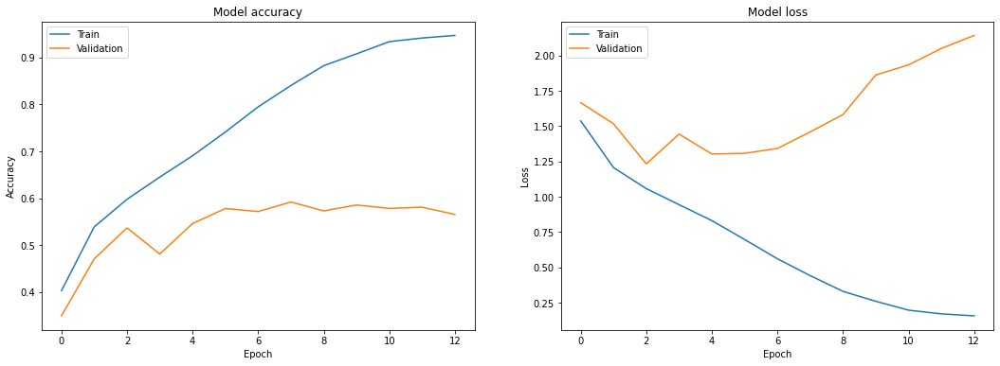


CNN Model Accuracy on test set: 0.6617



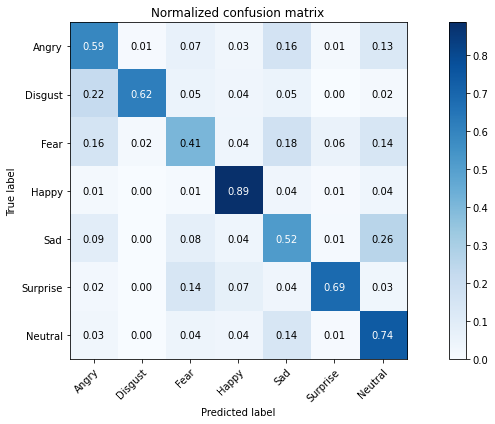

In [ ]:
# without augmentation
evaluate_fer_model(history, model, test_X, test_Y)

Training and Validation Accuracy/Loss


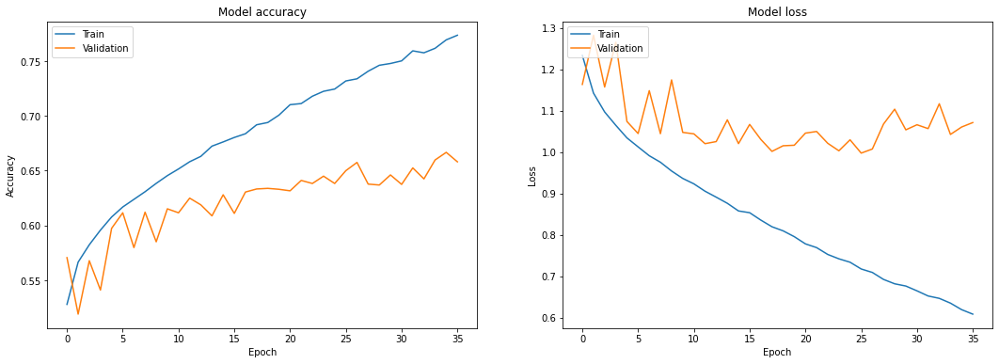


CNN Model Accuracy on test set: 0.6617



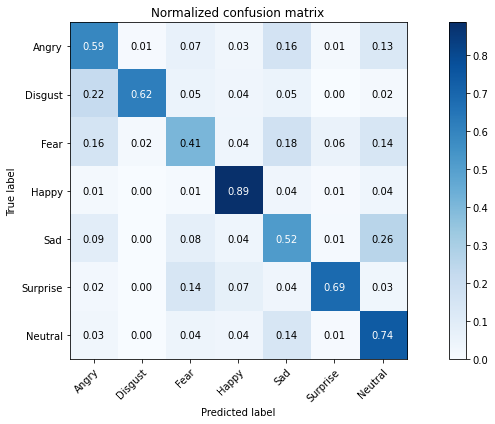

In [ ]:
# with augmentation
evaluate_fer_model(history_augment, model_augment, test_X, test_Y)

### Hypothesis 1: Changing Optimizer & Activation Function


####1a. Changing Optimizer (Activation function remains as Relu)
 
* Baseline: Adam
* 1. AdaGrad
* 2. Adadelta
* 3. RMSprop
* 4. Nadam

**1. Adagrad**

In [ ]:
from tensorflow.keras.optimizers import Adagrad

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 3
model.add(Dense(2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Adagrad(learning_rate=0.001, initial_accumulator_value=0.1, epsilon=1e-7), 
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 46, 46, 256)       2560      
_________________________________________________________________
batch_normalization (BatchNo (None, 46, 46, 256)       1024      
_________________________________________________________________
activation (Activation)      (None, 46, 46, 256)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 46, 46, 256)       590080    
_________________________________________________________________
batch_normalization_1 (Batch (None, 46, 46, 256)       1024      
_________________________________________________________________
activation_1 (Activation)    (None, 46, 46, 256)       0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 23, 23, 256)       0

In [ ]:
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)


es = EarlyStopping(monitor='val_loss', patience = 10, mode = 'min', restore_best_weights=True)

model_adagrad = model
path_model='model_fer_adagrad.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model_adagrad.optimizer.lr,1e-3) # set the learning rate
# fit the model
history_adagrad=model_adagrad.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

Epoch 1/50
449/449 [==============================] - 26s 56ms/step - loss: 1.9193 - accuracy: 0.2450 - val_loss: 1.9016 - val_accuracy: 0.2084
Epoch 2/50
449/449 [==============================] - 25s 55ms/step - loss: 1.7756 - accuracy: 0.2972 - val_loss: 1.7070 - val_accuracy: 0.3307
Epoch 3/50
449/449 [==============================] - 24s 54ms/step - loss: 1.7115 - accuracy: 0.3207 - val_loss: 1.6558 - val_accuracy: 0.3514
Epoch 4/50
449/449 [==============================] - 25s 56ms/step - loss: 1.6865 - accuracy: 0.3325 - val_loss: 1.6159 - val_accuracy: 0.3703
Epoch 5/50
449/449 [==============================] - 25s 55ms/step - loss: 1.6488 - accuracy: 0.3460 - val_loss: 1.5918 - val_accuracy: 0.3781
Epoch 6/50
449/449 [==============================] - 25s 55ms/step - loss: 1.6146 - accuracy: 0.3689 - val_loss: 1.5669 - val_accuracy: 0.3906
Epoch 7/50
449/449 [==============================] - 25s 55ms/step - loss: 1.5915 - accuracy: 0.3757 - val_loss: 1.5399 - val_accuracy:

Training and Validation Accuracy/Loss


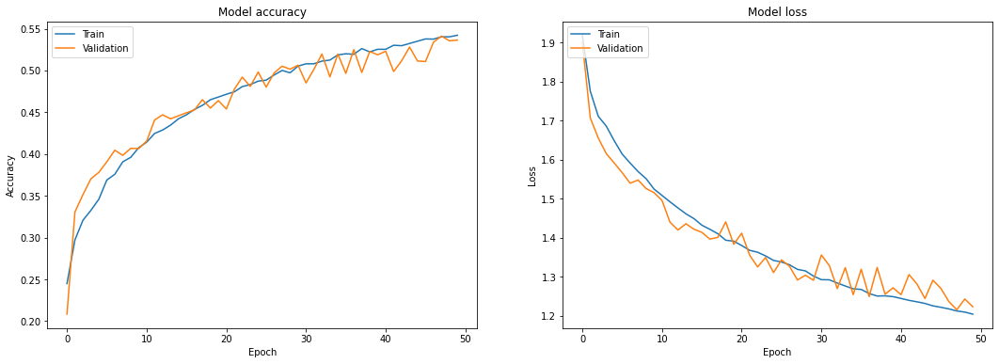


CNN Model Accuracy on test set: 0.5514



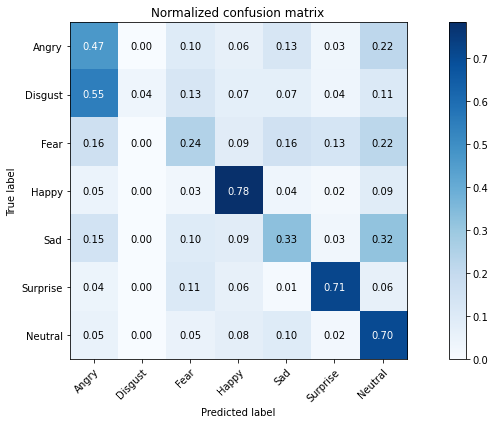

In [ ]:
evaluate_fer_model(history_adagrad, model_adagrad, test_X, test_Y)

**2. Adadelta**

In [ ]:
from tensorflow.keras.optimizers import Adadelta

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 3
model.add(Dense(2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Adadelta(learning_rate=0.001, rho=0.95, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 46, 46, 256)       2560      
_________________________________________________________________
batch_normalization (BatchNo (None, 46, 46, 256)       1024      
_________________________________________________________________
activation (Activation)      (None, 46, 46, 256)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 46, 46, 256)       590080    
_________________________________________________________________
batch_normalization_1 (Batch (None, 46, 46, 256)       1024      
_________________________________________________________________
activation_1 (Activation)    (None, 46, 46, 256)       0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 23, 23, 256)       0

In [ ]:
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)


es = EarlyStopping(monitor='val_loss', patience = 10, mode = 'min', restore_best_weights=True)

model_adadelta = model
path_model='model_fer_adadelta.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model_adadelta.optimizer.lr,1e-3) # set the learning rate
# fit the model
history_adadelta=model_adadelta.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

Epoch 1/50
449/449 [==============================] - 27s 57ms/step - loss: 2.2261 - accuracy: 0.1312 - val_loss: 2.0839 - val_accuracy: 0.1624
Epoch 2/50
449/449 [==============================] - 25s 56ms/step - loss: 2.1796 - accuracy: 0.1425 - val_loss: 2.2120 - val_accuracy: 0.1454
Epoch 3/50
449/449 [==============================] - 25s 56ms/step - loss: 2.1484 - accuracy: 0.1460 - val_loss: 2.2000 - val_accuracy: 0.1563
Epoch 4/50
449/449 [==============================] - 25s 55ms/step - loss: 2.1082 - accuracy: 0.1636 - val_loss: 2.1732 - val_accuracy: 0.1577
Epoch 5/50
449/449 [==============================] - 25s 55ms/step - loss: 2.0780 - accuracy: 0.1728 - val_loss: 2.1324 - val_accuracy: 0.1736
Epoch 6/50
449/449 [==============================] - 25s 56ms/step - loss: 2.0576 - accuracy: 0.1832 - val_loss: 2.1044 - val_accuracy: 0.1819
Epoch 7/50
449/449 [==============================] - 25s 56ms/step - loss: 2.0257 - accuracy: 0.1930 - val_loss: 2.0841 - val_accuracy:

Training and Validation Accuracy/Loss


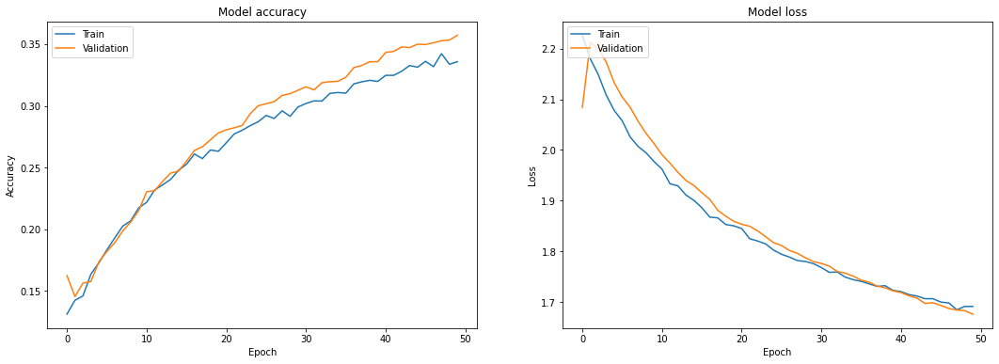


CNN Model Accuracy on test set: 0.3508



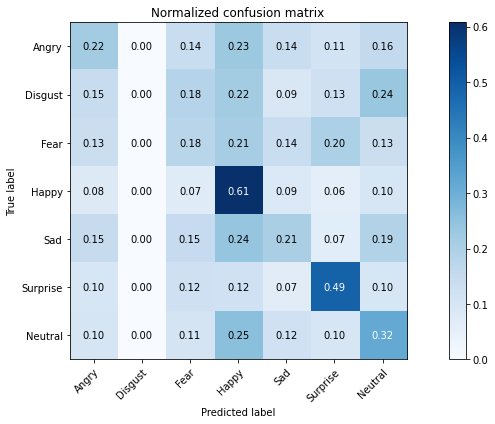

In [ ]:
evaluate_fer_model(history_adadelta, model_adadelta, test_X, test_Y)

**3. RMSprop**

In [ ]:
from tensorflow.keras.optimizers import RMSprop

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 3
model.add(Dense(2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=RMSprop(learning_rate=0.001, rho=0.9, momentum=0.0, epsilon=1e-07, centered=False), 
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 46, 46, 256)       2560      
_________________________________________________________________
batch_normalization (BatchNo (None, 46, 46, 256)       1024      
_________________________________________________________________
activation (Activation)      (None, 46, 46, 256)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 46, 46, 256)       590080    
_________________________________________________________________
batch_normalization_1 (Batch (None, 46, 46, 256)       1024      
_________________________________________________________________
activation_1 (Activation)    (None, 46, 46, 256)       0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 23, 23, 256)       0

In [ ]:
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)


es = EarlyStopping(monitor='val_loss', patience = 10, mode = 'min', restore_best_weights=True)

model_rmsprop = model
path_model='model_fer_rmsprop.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model_rmsprop.optimizer.lr,1e-3) # set the learning rate
# fit the model
history_rmsprop=model_rmsprop.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

Epoch 1/50
449/449 [==============================] - 28s 57ms/step - loss: 1.6513 - accuracy: 0.3447 - val_loss: 1.5185 - val_accuracy: 0.4129
Epoch 2/50
449/449 [==============================] - 25s 57ms/step - loss: 1.3255 - accuracy: 0.4922 - val_loss: 1.8679 - val_accuracy: 0.3918
Epoch 3/50
449/449 [==============================] - 25s 57ms/step - loss: 1.2147 - accuracy: 0.5355 - val_loss: 1.2792 - val_accuracy: 0.5174
Epoch 4/50
449/449 [==============================] - 26s 57ms/step - loss: 1.1477 - accuracy: 0.5645 - val_loss: 1.1617 - val_accuracy: 0.5595
Epoch 5/50
449/449 [==============================] - 26s 57ms/step - loss: 1.1002 - accuracy: 0.5828 - val_loss: 1.1705 - val_accuracy: 0.5573
Epoch 6/50
449/449 [==============================] - 25s 57ms/step - loss: 1.0674 - accuracy: 0.5973 - val_loss: 1.1138 - val_accuracy: 0.5745
Epoch 7/50
449/449 [==============================] - 26s 57ms/step - loss: 1.0339 - accuracy: 0.6070 - val_loss: 1.1619 - val_accuracy:

Training and Validation Accuracy/Loss


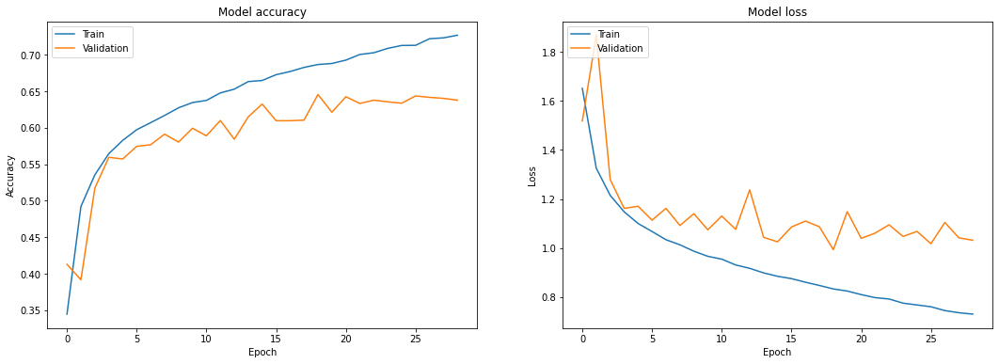


CNN Model Accuracy on test set: 0.6512



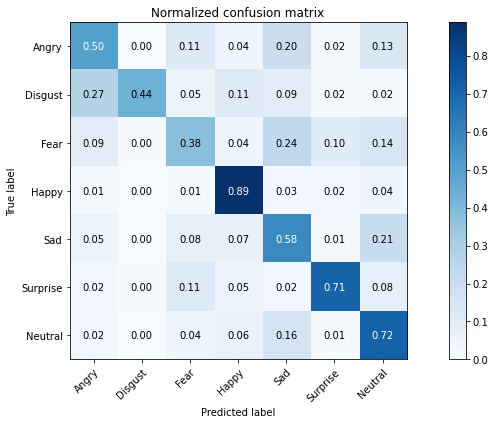

In [ ]:
evaluate_fer_model(history_rmsprop, model_rmsprop, test_X, test_Y)

**4. Nadam**

In [ ]:
from tensorflow.keras.optimizers import Nadam

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 3
model.add(Dense(2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 46, 46, 256)       2560      
_________________________________________________________________
batch_normalization (BatchNo (None, 46, 46, 256)       1024      
_________________________________________________________________
activation (Activation)      (None, 46, 46, 256)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 46, 46, 256)       590080    
_________________________________________________________________
batch_normalization_1 (Batch (None, 46, 46, 256)       1024      
_________________________________________________________________
activation_1 (Activation)    (None, 46, 46, 256)       0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 23, 23, 256)       0

In [ ]:
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)


es = EarlyStopping(monitor='val_loss', patience = 10, mode = 'min', restore_best_weights=True)

model_nadam = model
path_model='model_fer_rmsprop.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model_nadam.optimizer.lr,1e-3) # set the learning rate
# fit the model
history_nadam=model_nadam.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

Epoch 1/50
449/449 [==============================] - 30s 60ms/step - loss: 1.6543 - accuracy: 0.3472 - val_loss: 2.1537 - val_accuracy: 0.2349
Epoch 2/50
449/449 [==============================] - 27s 59ms/step - loss: 1.3453 - accuracy: 0.4799 - val_loss: 1.4465 - val_accuracy: 0.4455
Epoch 3/50
449/449 [==============================] - 27s 60ms/step - loss: 1.2100 - accuracy: 0.5411 - val_loss: 1.4047 - val_accuracy: 0.4778
Epoch 4/50
449/449 [==============================] - 27s 59ms/step - loss: 1.1467 - accuracy: 0.5626 - val_loss: 1.2765 - val_accuracy: 0.5107
Epoch 5/50
449/449 [==============================] - 27s 60ms/step - loss: 1.1050 - accuracy: 0.5819 - val_loss: 1.1415 - val_accuracy: 0.5743
Epoch 6/50
449/449 [==============================] - 27s 59ms/step - loss: 1.0699 - accuracy: 0.5960 - val_loss: 1.1530 - val_accuracy: 0.5706
Epoch 7/50
449/449 [==============================] - 27s 59ms/step - loss: 1.0356 - accuracy: 0.6089 - val_loss: 1.1186 - val_accuracy:

Training and Validation Accuracy/Loss


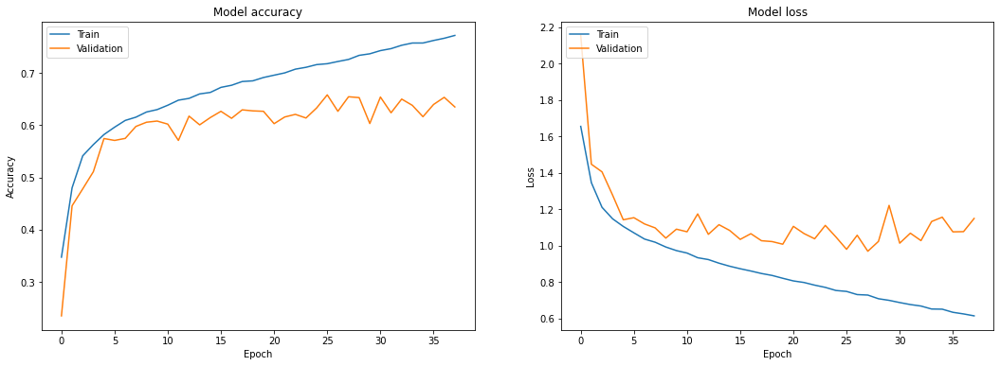


CNN Model Accuracy on test set: 0.6645



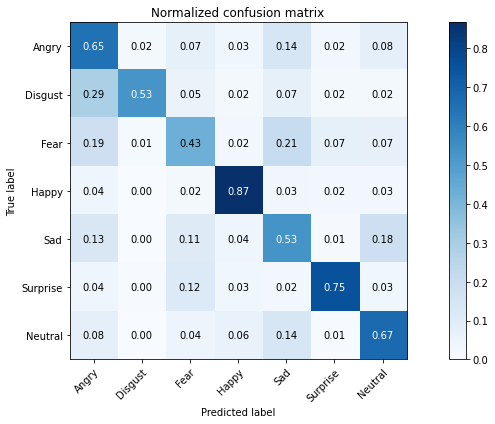

In [ ]:
evaluate_fer_model(history_nadam, model_nadam, test_X, test_Y)

####1b. Changing Activation Functions (Combinations with Adam or Nadam as optimizer)
 
* Baseline: Adam + Relu (see above)
* 1. Nadam + Relu (see above)
* 2. Adam + Sigmoid
* 3. Nadam + Sigmoid
* 4. Adam + Tanh
* 5. Nadam + Tanh

**2. Adam (optimizer) + Sigmoid (activation)**

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('sigmoid'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('sigmoid'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('sigmoid'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('sigmoid'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('sigmoid'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('sigmoid'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('sigmoid'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('sigmoid'))

#dense 3
model.add(Dense(2*num_features))
model.add(BatchNormalization())
model.add(Activation('sigmoid'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-7), 
              metrics=['accuracy'])

model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 46, 46, 256)       2560      
_________________________________________________________________
batch_normalization_9 (Batch (None, 46, 46, 256)       1024      
_________________________________________________________________
activation_9 (Activation)    (None, 46, 46, 256)       0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 46, 46, 256)       590080    
_________________________________________________________________
batch_normalization_10 (Batc (None, 46, 46, 256)       1024      
_________________________________________________________________
activation_10 (Activation)   (None, 46, 46, 256)       0         
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 23, 23, 256)      

In [ ]:
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)


es = EarlyStopping(monitor='val_loss', patience = 10, mode = 'min', restore_best_weights=True)

model_sigmoid_adam = model
path_model='model_fer_sigmoid_adam.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model_sigmoid_adam.optimizer.lr,1e-3) # set the learning rate
# fit the model
history_sigmoid_adam=model_sigmoid_adam.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

Epoch 1/50
449/449 [==============================] - 26s 56ms/step - loss: 1.6607 - accuracy: 0.3432 - val_loss: 1.7329 - val_accuracy: 0.3132
Epoch 2/50
449/449 [==============================] - 25s 55ms/step - loss: 1.4621 - accuracy: 0.4397 - val_loss: 2.2488 - val_accuracy: 0.2413
Epoch 3/50
449/449 [==============================] - 25s 56ms/step - loss: 1.3809 - accuracy: 0.4735 - val_loss: 1.5816 - val_accuracy: 0.4043
Epoch 4/50
449/449 [==============================] - 25s 55ms/step - loss: 1.3289 - accuracy: 0.4951 - val_loss: 1.4014 - val_accuracy: 0.4575
Epoch 5/50
449/449 [==============================] - 25s 55ms/step - loss: 1.2942 - accuracy: 0.5056 - val_loss: 1.6446 - val_accuracy: 0.3405
Epoch 6/50
449/449 [==============================] - 25s 55ms/step - loss: 1.2644 - accuracy: 0.5187 - val_loss: 1.4319 - val_accuracy: 0.4422
Epoch 7/50
449/449 [==============================] - 25s 55ms/step - loss: 1.2325 - accuracy: 0.5334 - val_loss: 1.4681 - val_accuracy:

Training and Validation Accuracy/Loss


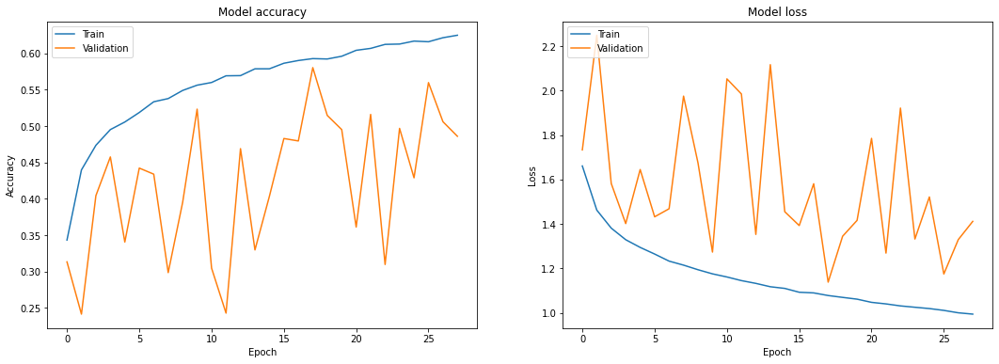


CNN Model Accuracy on test set: 0.5729



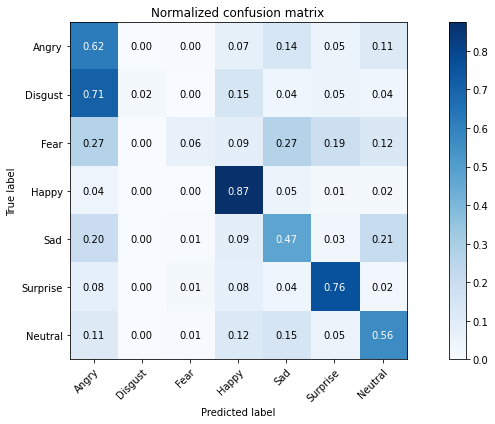

In [ ]:
evaluate_fer_model(history_sigmoid_adam, model_sigmoid_adam, test_X, test_Y)

**3. Nadam (optimizer) + Sigmoid (activation)**

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('sigmoid'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('sigmoid'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('sigmoid'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('sigmoid'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('sigmoid'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('sigmoid'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('sigmoid'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('sigmoid'))

#dense 3
model.add(Dense(2*num_features))
model.add(BatchNormalization())
model.add(Activation('sigmoid'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

2021-11-21 12:13:25.173450: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-11-21 12:13:25.275508: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-11-21 12:13:25.276269: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-11-21 12:13:25.277663: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 46, 46, 256)       2560      
_________________________________________________________________
batch_normalization (BatchNo (None, 46, 46, 256)       1024      
_________________________________________________________________
activation (Activation)      (None, 46, 46, 256)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 46, 46, 256)       590080    
_________________________________________________________________
batch_normalization_1 (Batch (None, 46, 46, 256)       1024      
_________________________________________________________________
activation_1 (Activation)    (None, 46, 46, 256)       0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 23, 23, 256)       0

In [ ]:
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)


es = EarlyStopping(monitor='val_loss', patience = 10, mode = 'min', restore_best_weights=True)

model_sigmoid_nadam = model
path_model='model_fer_sigmoid_nadam.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model_sigmoid_nadam.optimizer.lr,1e-3) # set the learning rate
# fit the model
history_sigmoid_nadam=model_sigmoid_nadam.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

2021-11-21 12:13:33.971885: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/50


2021-11-21 12:13:38.497250: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


449/449 [==============================] - 38s 61ms/step - loss: 1.6142 - accuracy: 0.3642 - val_loss: 1.9445 - val_accuracy: 0.1945
Epoch 2/50
449/449 [==============================] - 27s 60ms/step - loss: 1.4303 - accuracy: 0.4535 - val_loss: 2.1428 - val_accuracy: 0.2611
Epoch 3/50
449/449 [==============================] - 27s 61ms/step - loss: 1.3544 - accuracy: 0.4833 - val_loss: 1.4646 - val_accuracy: 0.4054
Epoch 4/50
449/449 [==============================] - 27s 60ms/step - loss: 1.3094 - accuracy: 0.5005 - val_loss: 2.3382 - val_accuracy: 0.2530
Epoch 5/50
449/449 [==============================] - 27s 60ms/step - loss: 1.2731 - accuracy: 0.5170 - val_loss: 1.8713 - val_accuracy: 0.3773
Epoch 6/50
449/449 [==============================] - 27s 61ms/step - loss: 1.2448 - accuracy: 0.5275 - val_loss: 1.8972 - val_accuracy: 0.3263
Epoch 7/50
449/449 [==============================] - 27s 60ms/step - loss: 1.2177 - accuracy: 0.5361 - val_loss: 1.3778 - val_accuracy: 0.4533
Epo

Training and Validation Accuracy/Loss


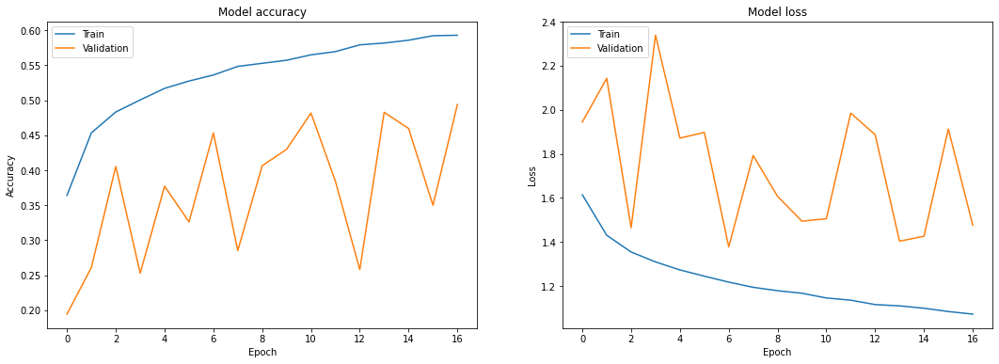


CNN Model Accuracy on test set: 0.4511



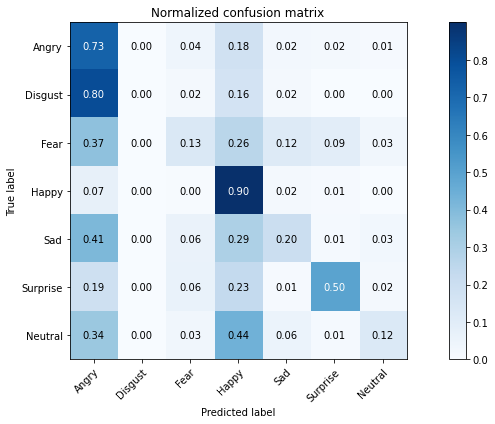

In [ ]:
evaluate_fer_model(history_sigmoid_nadam, model_sigmoid_nadam, test_X, test_Y)

**4. Adam (optimizer) + Tanh (activation)**

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('tanh'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('tanh'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('tanh'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('tanh'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('tanh'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('tanh'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('tanh'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('tanh'))

#dense 3
model.add(Dense(2*num_features))
model.add(BatchNormalization())
model.add(Activation('tanh'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-7), 
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 46, 46, 256)       2560      
_________________________________________________________________
batch_normalization (BatchNo (None, 46, 46, 256)       1024      
_________________________________________________________________
activation (Activation)      (None, 46, 46, 256)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 46, 46, 256)       590080    
_________________________________________________________________
batch_normalization_1 (Batch (None, 46, 46, 256)       1024      
_________________________________________________________________
activation_1 (Activation)    (None, 46, 46, 256)       0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 23, 23, 256)       0

In [ ]:
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)


es = EarlyStopping(monitor='val_loss', patience = 10, mode = 'min', restore_best_weights=True)

model_tanh_adam = model
path_model='model_fer_tanh_adam.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model_tanh_adam.optimizer.lr,1e-3) # set the learning rate
# fit the model
history_tanh_adam=model_tanh_adam.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

Epoch 1/50
449/449 [==============================] - 27s 58ms/step - loss: 1.7684 - accuracy: 0.2938 - val_loss: 1.8051 - val_accuracy: 0.3110
Epoch 2/50
449/449 [==============================] - 25s 55ms/step - loss: 1.5922 - accuracy: 0.3733 - val_loss: 1.5324 - val_accuracy: 0.4146
Epoch 3/50
449/449 [==============================] - 25s 56ms/step - loss: 1.4729 - accuracy: 0.4301 - val_loss: 1.5342 - val_accuracy: 0.3973
Epoch 4/50
449/449 [==============================] - 25s 56ms/step - loss: 1.4040 - accuracy: 0.4586 - val_loss: 1.4196 - val_accuracy: 0.4570
Epoch 5/50
449/449 [==============================] - 25s 56ms/step - loss: 1.3526 - accuracy: 0.4796 - val_loss: 1.3153 - val_accuracy: 0.4929
Epoch 6/50
449/449 [==============================] - 25s 55ms/step - loss: 1.3059 - accuracy: 0.4999 - val_loss: 1.3145 - val_accuracy: 0.5038
Epoch 7/50
449/449 [==============================] - 25s 56ms/step - loss: 1.2719 - accuracy: 0.5103 - val_loss: 1.2609 - val_accuracy:

Training and Validation Accuracy/Loss


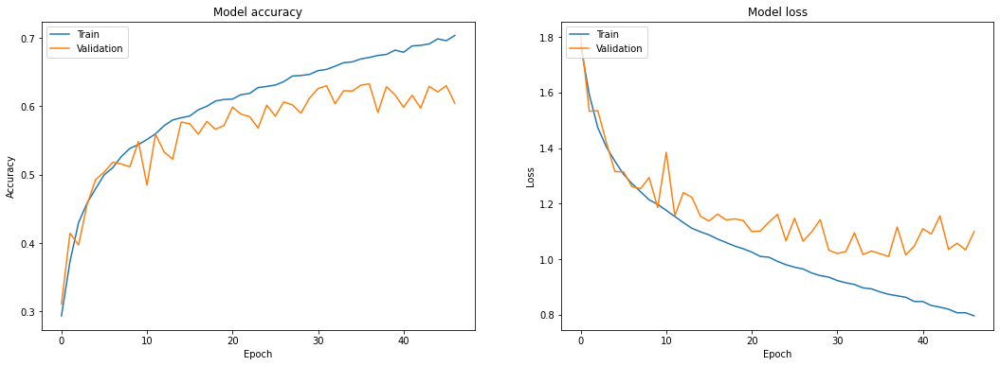


CNN Model Accuracy on test set: 0.6367



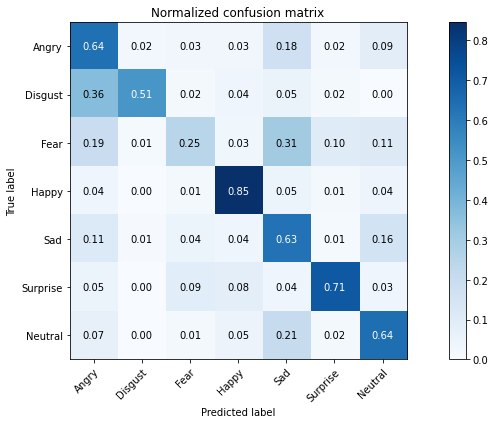

In [ ]:
evaluate_fer_model(history_tanh_adam, model_tanh_adam, test_X, test_Y)

**5. Nadam (optimizer) + Tanh (activation)**

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('tanh'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('tanh'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('tanh'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('tanh'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('tanh'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('tanh'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('tanh'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('tanh'))

#dense 3
model.add(Dense(2*num_features))
model.add(BatchNormalization())
model.add(Activation('tanh'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 46, 46, 256)       2560      
_________________________________________________________________
batch_normalization (BatchNo (None, 46, 46, 256)       1024      
_________________________________________________________________
activation (Activation)      (None, 46, 46, 256)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 46, 46, 256)       590080    
_________________________________________________________________
batch_normalization_1 (Batch (None, 46, 46, 256)       1024      
_________________________________________________________________
activation_1 (Activation)    (None, 46, 46, 256)       0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 23, 23, 256)       0

In [ ]:
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)


es = EarlyStopping(monitor='val_loss', patience = 10, mode = 'min', restore_best_weights=True)

model_tanh_nadam = model
path_model='model_fer_tanh_nadam.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model_tanh_nadam.optimizer.lr,1e-3) # set the learning rate
# fit the model
history_tanh_nadam=model_tanh_nadam.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

Epoch 1/50
449/449 [==============================] - 31s 63ms/step - loss: 1.7562 - accuracy: 0.2989 - val_loss: 2.1934 - val_accuracy: 0.2232
Epoch 2/50
449/449 [==============================] - 27s 60ms/step - loss: 1.5486 - accuracy: 0.3934 - val_loss: 1.6297 - val_accuracy: 0.3901
Epoch 3/50
449/449 [==============================] - 28s 61ms/step - loss: 1.4443 - accuracy: 0.4400 - val_loss: 1.4577 - val_accuracy: 0.4397
Epoch 4/50
449/449 [==============================] - 27s 61ms/step - loss: 1.3638 - accuracy: 0.4758 - val_loss: 1.3649 - val_accuracy: 0.4723
Epoch 5/50
449/449 [==============================] - 27s 61ms/step - loss: 1.3066 - accuracy: 0.5008 - val_loss: 1.3745 - val_accuracy: 0.4873
Epoch 6/50
449/449 [==============================] - 27s 60ms/step - loss: 1.2720 - accuracy: 0.5153 - val_loss: 1.2620 - val_accuracy: 0.5177
Epoch 7/50
449/449 [==============================] - 27s 60ms/step - loss: 1.2370 - accuracy: 0.5268 - val_loss: 1.2513 - val_accuracy:

Training and Validation Accuracy/Loss


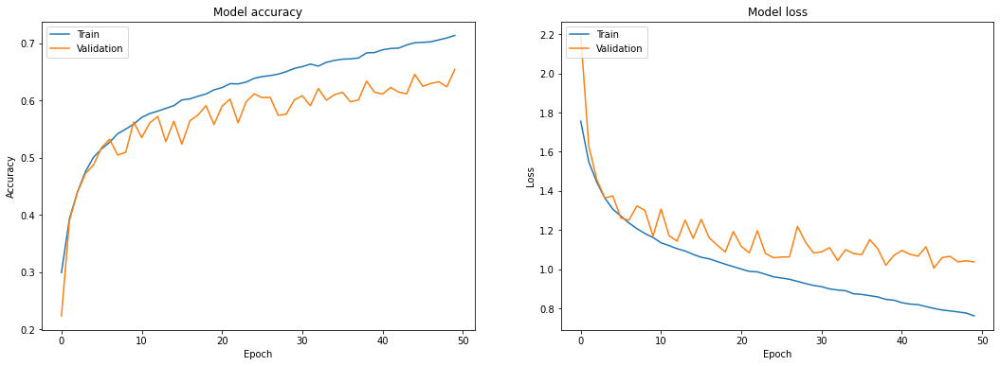


CNN Model Accuracy on test set: 0.6453



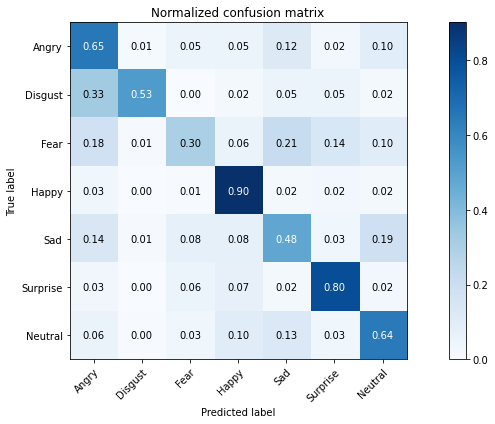

In [ ]:
evaluate_fer_model(history_tanh_nadam, model_tanh_nadam, test_X, test_Y)

### Hypothesis 2: Increasing the number of hidden layers 


#### 1. 4 hidden layers, 1024, 512, 256, 128

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 3
model.add(Dense(2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 46, 46, 256)       2560      
                                                                 
 batch_normalization (BatchN  (None, 46, 46, 256)      1024      
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 46, 46, 256)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 46, 46, 256)       590080    
                                                                 
 batch_normalization_1 (Batc  (None, 46, 46, 256)      1024      
 hNormalization)                                                 
                                                                 
 activation_1 (Activation)   (None, 46, 46, 256)       0

In [ ]:
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)


es = EarlyStopping(monitor='val_loss', patience = 10, mode = 'min', restore_best_weights=True)

# history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
#                                 steps_per_epoch=len(train_X) / batch_size,
#                                 epochs=num_epochs,
#                                 verbose=1, 
#                                 callbacks = [es],
#                                 validation_data=(val_X, val_Y))


path_model=start_path+'model_fer.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model.optimizer.lr,1e-3) # set the learning rate
# fit the model
history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

Epoch 1/50
449/449 [==============================] - 98s 208ms/step - loss: 1.6625 - accuracy: 0.3429 - val_loss: 1.8357 - val_accuracy: 0.2452
Epoch 2/50
449/449 [==============================] - 94s 209ms/step - loss: 1.3551 - accuracy: 0.4748 - val_loss: 1.4459 - val_accuracy: 0.4639
Epoch 3/50
449/449 [==============================] - 94s 210ms/step - loss: 1.2289 - accuracy: 0.5270 - val_loss: 1.5878 - val_accuracy: 0.4391
Epoch 4/50
449/449 [==============================] - 94s 210ms/step - loss: 1.1619 - accuracy: 0.5567 - val_loss: 1.3615 - val_accuracy: 0.4987
Epoch 5/50
449/449 [==============================] - 94s 210ms/step - loss: 1.1122 - accuracy: 0.5768 - val_loss: 1.2796 - val_accuracy: 0.5339
Epoch 6/50
449/449 [==============================] - 95s 211ms/step - loss: 1.0740 - accuracy: 0.5916 - val_loss: 1.1399 - val_accuracy: 0.5729
Epoch 7/50
449/449 [==============================] - 94s 210ms/step - loss: 1.0455 - accuracy: 0.6043 - val_loss: 1.3078 - val_ac

Training and Validation Accuracy/Loss


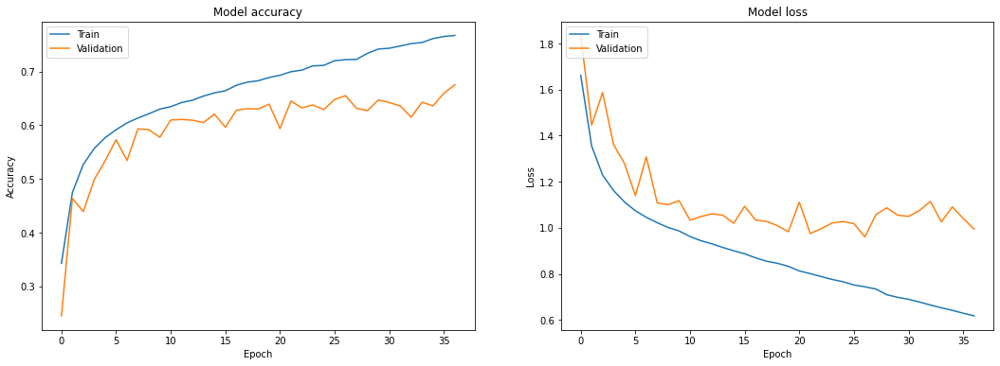


CNN Model Accuracy on test set: 0.6634



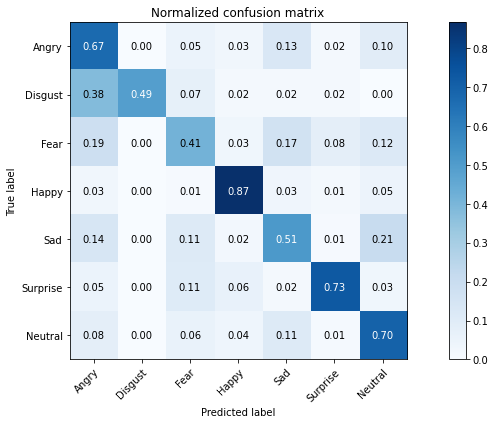

In [ ]:
evaluate_fer_model(history, model, test_X, test_Y)

#### 2. 4 hidden layers, 512, 256, 128, 64

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 3
model.add(Dense(num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 46, 46, 256)       2560      
                                                                 
 batch_normalization (BatchN  (None, 46, 46, 256)      1024      
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 46, 46, 256)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 46, 46, 256)       590080    
                                                                 
 batch_normalization_1 (Batc  (None, 46, 46, 256)      1024      
 hNormalization)                                                 
                                                                 
 activation_1 (Activation)   (None, 46, 46, 256)       0

In [ ]:
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)


es = EarlyStopping(monitor='val_loss', patience = 10, mode = 'min', restore_best_weights=True)

# history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
#                                 steps_per_epoch=len(train_X) / batch_size,
#                                 epochs=num_epochs,
#                                 verbose=1, 
#                                 callbacks = [es],
#                                 validation_data=(val_X, val_Y))


path_model=start_path+'model_fer.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model.optimizer.lr,1e-3) # set the learning rate
# fit the model
history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

Epoch 1/50
449/449 [==============================] - 98s 207ms/step - loss: 1.7124 - accuracy: 0.3085 - val_loss: 1.8774 - val_accuracy: 0.3073
Epoch 2/50
449/449 [==============================] - 92s 206ms/step - loss: 1.3966 - accuracy: 0.4608 - val_loss: 1.3128 - val_accuracy: 0.4943
Epoch 3/50
449/449 [==============================] - 93s 206ms/step - loss: 1.2394 - accuracy: 0.5245 - val_loss: 1.5803 - val_accuracy: 0.4068
Epoch 4/50
449/449 [==============================] - 93s 206ms/step - loss: 1.1711 - accuracy: 0.5534 - val_loss: 1.1776 - val_accuracy: 0.5575
Epoch 5/50
449/449 [==============================] - 93s 206ms/step - loss: 1.1169 - accuracy: 0.5749 - val_loss: 1.2682 - val_accuracy: 0.5472
Epoch 6/50
449/449 [==============================] - 93s 206ms/step - loss: 1.0804 - accuracy: 0.5889 - val_loss: 1.1293 - val_accuracy: 0.5823
Epoch 7/50
449/449 [==============================] - 92s 206ms/step - loss: 1.0532 - accuracy: 0.6023 - val_loss: 1.3230 - val_ac

Training and Validation Accuracy/Loss


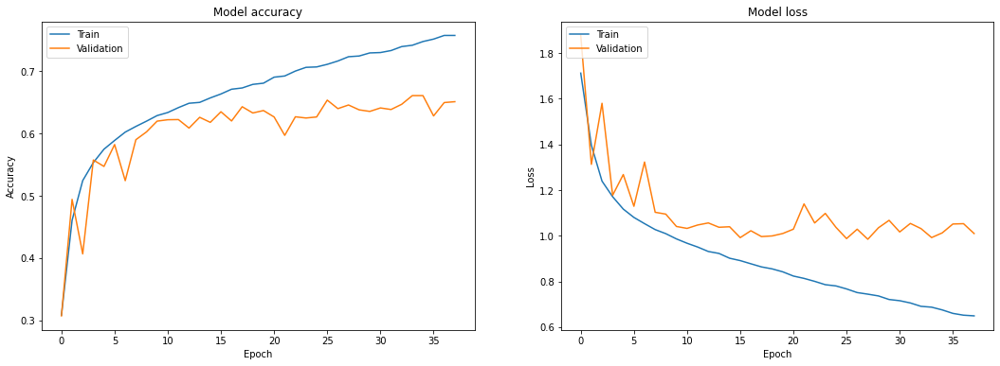


CNN Model Accuracy on test set: 0.6592



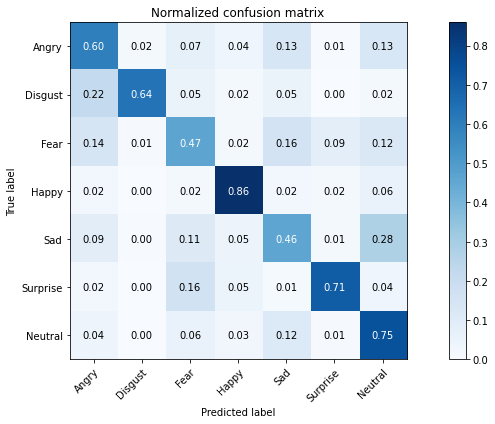

In [ ]:
evaluate_fer_model(history, model, test_X, test_Y)

#### 3. 3 layers: 1024, 512, 256

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 46, 46, 256)       2560      
                                                                 
 batch_normalization (BatchN  (None, 46, 46, 256)      1024      
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 46, 46, 256)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 46, 46, 256)       590080    
                                                                 
 batch_normalization_1 (Batc  (None, 46, 46, 256)      1024      
 hNormalization)                                                 
                                                                 
 activation_1 (Activation)   (None, 46, 46, 256)       0

In [ ]:
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)


es = EarlyStopping(monitor='val_loss', patience = 10, mode = 'min', restore_best_weights=True)

# history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
#                                 steps_per_epoch=len(train_X) / batch_size,
#                                 epochs=num_epochs,
#                                 verbose=1, 
#                                 callbacks = [es],
#                                 validation_data=(val_X, val_Y))


path_model=start_path+'model_fer.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model.optimizer.lr,1e-3) # set the learning rate
# fit the model
history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

Epoch 1/50
449/449 [==============================] - 98s 208ms/step - loss: 1.6454 - accuracy: 0.3512 - val_loss: 1.6578 - val_accuracy: 0.3622
Epoch 2/50
449/449 [==============================] - 93s 208ms/step - loss: 1.3439 - accuracy: 0.4835 - val_loss: 1.4144 - val_accuracy: 0.4508
Epoch 3/50
449/449 [==============================] - 94s 208ms/step - loss: 1.2146 - accuracy: 0.5398 - val_loss: 1.3331 - val_accuracy: 0.5049
Epoch 4/50
449/449 [==============================] - 94s 208ms/step - loss: 1.1518 - accuracy: 0.5606 - val_loss: 1.4129 - val_accuracy: 0.4937
Epoch 5/50
449/449 [==============================] - 94s 208ms/step - loss: 1.1040 - accuracy: 0.5813 - val_loss: 1.1505 - val_accuracy: 0.5737
Epoch 6/50
449/449 [==============================] - 94s 208ms/step - loss: 1.0690 - accuracy: 0.5966 - val_loss: 1.2166 - val_accuracy: 0.5587
Epoch 7/50
449/449 [==============================] - 94s 209ms/step - loss: 1.0387 - accuracy: 0.6044 - val_loss: 1.2193 - val_ac

Training and Validation Accuracy/Loss


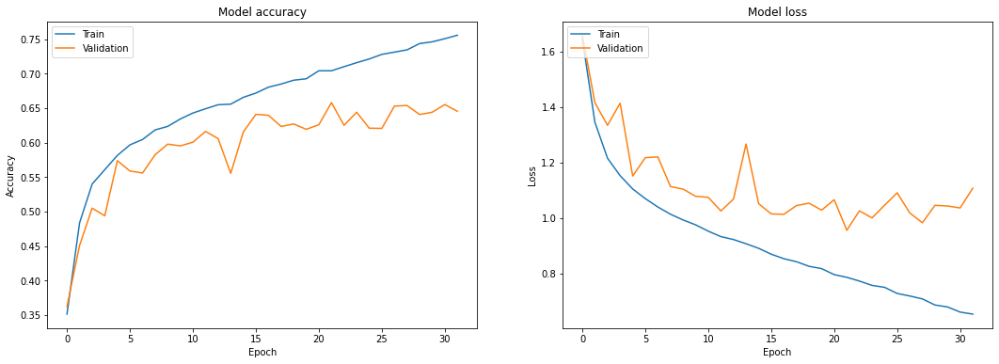


CNN Model Accuracy on test set: 0.6676



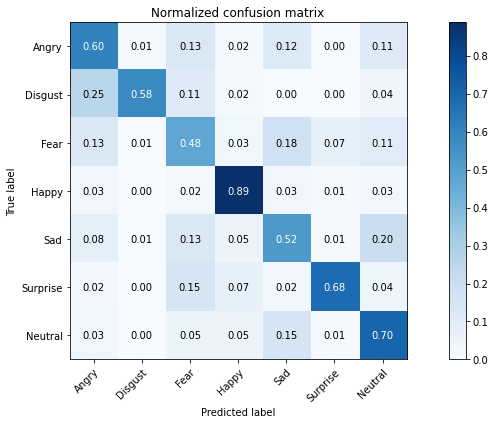

In [ ]:
evaluate_fer_model(history, model, test_X, test_Y)

#### 4. 3 layers: 2048, 1024, 512

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(2*2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 46, 46, 256)       2560      
                                                                 
 batch_normalization_9 (Batc  (None, 46, 46, 256)      1024      
 hNormalization)                                                 
                                                                 
 activation_9 (Activation)   (None, 46, 46, 256)       0         
                                                                 
 conv2d_7 (Conv2D)           (None, 46, 46, 256)       590080    
                                                                 
 batch_normalization_10 (Bat  (None, 46, 46, 256)      1024      
 chNormalization)                                                
                                                                 
 activation_10 (Activation)  (None, 46, 46, 256)      

In [ ]:
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)


es = EarlyStopping(monitor='val_loss', patience = 10, mode = 'min', restore_best_weights=True)

# history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
#                                 steps_per_epoch=len(train_X) / batch_size,
#                                 epochs=num_epochs,
#                                 verbose=1, 
#                                 callbacks = [es],
#                                 validation_data=(val_X, val_Y))


path_model=start_path+'model_fer.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model.optimizer.lr,1e-3) # set the learning rate
# fit the model
history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

Epoch 1/50
449/449 [==============================] - 110s 214ms/step - loss: 1.6529 - accuracy: 0.3518 - val_loss: 1.5731 - val_accuracy: 0.3530
Epoch 2/50
449/449 [==============================] - 94s 210ms/step - loss: 1.3426 - accuracy: 0.4844 - val_loss: 3.3075 - val_accuracy: 0.2828
Epoch 3/50
449/449 [==============================] - 94s 210ms/step - loss: 1.2318 - accuracy: 0.5318 - val_loss: 1.6353 - val_accuracy: 0.4514
Epoch 4/50
449/449 [==============================] - 94s 210ms/step - loss: 1.1673 - accuracy: 0.5551 - val_loss: 1.3958 - val_accuracy: 0.5107
Epoch 5/50
449/449 [==============================] - 95s 210ms/step - loss: 1.1218 - accuracy: 0.5745 - val_loss: 1.3301 - val_accuracy: 0.5394
Epoch 6/50
449/449 [==============================] - 96s 214ms/step - loss: 1.0723 - accuracy: 0.5947 - val_loss: 1.1604 - val_accuracy: 0.5737
Epoch 7/50
449/449 [==============================] - 95s 211ms/step - loss: 1.0378 - accuracy: 0.6070 - val_loss: 1.1458 - val_a

Training and Validation Accuracy/Loss


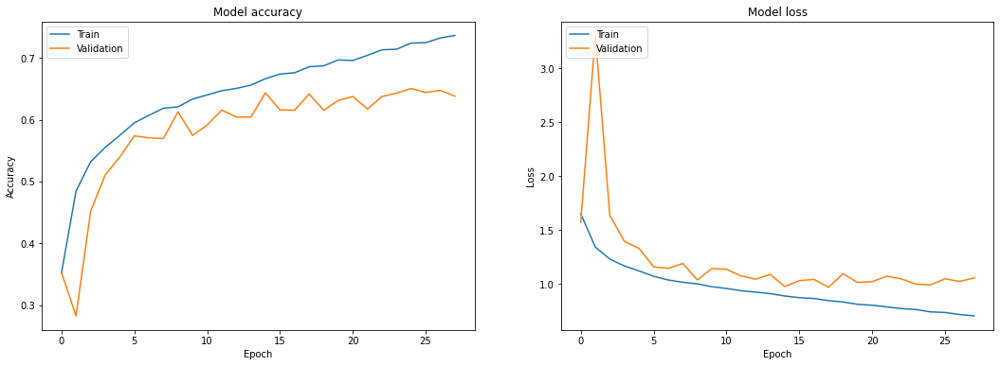


CNN Model Accuracy on test set: 0.6576



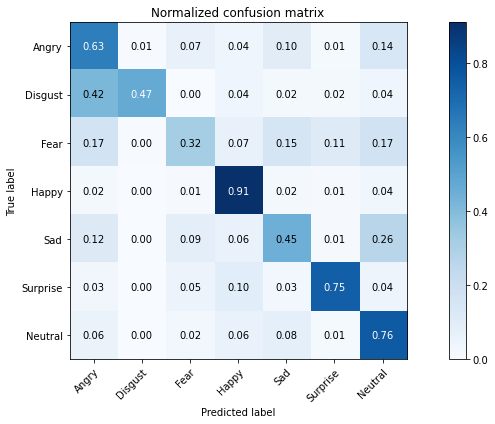

In [ ]:
evaluate_fer_model(history, model, test_X, test_Y)

#### 5. 3 layers: 256, 128, 64

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 46, 46, 256)       2560      
                                                                 
 batch_normalization (BatchN  (None, 46, 46, 256)      1024      
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 46, 46, 256)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 46, 46, 256)       590080    
                                                                 
 batch_normalization_1 (Batc  (None, 46, 46, 256)      1024      
 hNormalization)                                                 
                                                                 
 activation_1 (Activation)   (None, 46, 46, 256)       0

In [ ]:
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)


es = EarlyStopping(monitor='val_loss', patience = 10, mode = 'min', restore_best_weights=True)

# history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
#                                 steps_per_epoch=len(train_X) / batch_size,
#                                 epochs=num_epochs,
#                                 verbose=1, 
#                                 callbacks = [es],
#                                 validation_data=(val_X, val_Y))


path_model=start_path+'model_fer.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model.optimizer.lr,1e-3) # set the learning rate
# fit the model
history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

Epoch 1/50
449/449 [==============================] - 94s 201ms/step - loss: 1.7084 - accuracy: 0.3214 - val_loss: 1.7900 - val_accuracy: 0.3210
Epoch 2/50
449/449 [==============================] - 90s 200ms/step - loss: 1.3841 - accuracy: 0.4684 - val_loss: 1.5845 - val_accuracy: 0.4157
Epoch 3/50
449/449 [==============================] - 90s 200ms/step - loss: 1.2396 - accuracy: 0.5252 - val_loss: 1.4832 - val_accuracy: 0.4921
Epoch 4/50
449/449 [==============================] - 90s 200ms/step - loss: 1.1648 - accuracy: 0.5552 - val_loss: 1.3483 - val_accuracy: 0.5054
Epoch 5/50
449/449 [==============================] - 90s 199ms/step - loss: 1.1145 - accuracy: 0.5764 - val_loss: 1.3035 - val_accuracy: 0.5124
Epoch 6/50
449/449 [==============================] - 89s 199ms/step - loss: 1.0763 - accuracy: 0.5903 - val_loss: 1.2071 - val_accuracy: 0.5495
Epoch 7/50
449/449 [==============================] - 90s 199ms/step - loss: 1.0514 - accuracy: 0.6030 - val_loss: 1.1698 - val_ac

Training and Validation Accuracy/Loss


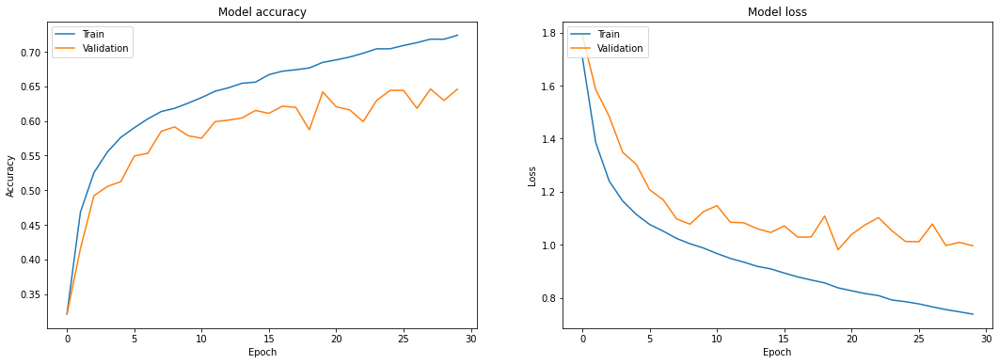


CNN Model Accuracy on test set: 0.6464



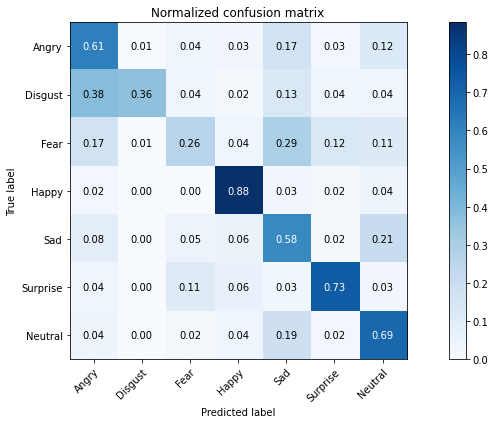

In [ ]:
evaluate_fer_model(history, model, test_X, test_Y)

#### 6. 2 layers: 1024, 512

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 46, 46, 256)       2560      
                                                                 
 batch_normalization (BatchN  (None, 46, 46, 256)      1024      
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 46, 46, 256)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 46, 46, 256)       590080    
                                                                 
 batch_normalization_1 (Batc  (None, 46, 46, 256)      1024      
 hNormalization)                                                 
                                                                 
 activation_1 (Activation)   (None, 46, 46, 256)       0

In [ ]:
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)


es = EarlyStopping(monitor='val_loss', patience = 10, mode = 'min', restore_best_weights=True)

# history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
#                                 steps_per_epoch=len(train_X) / batch_size,
#                                 epochs=num_epochs,
#                                 verbose=1, 
#                                 callbacks = [es],
#                                 validation_data=(val_X, val_Y))


path_model=start_path+'model_fer.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model.optimizer.lr,1e-3) # set the learning rate
# fit the model
history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

Epoch 1/50
449/449 [==============================] - 96s 204ms/step - loss: 1.6417 - accuracy: 0.3667 - val_loss: 1.6171 - val_accuracy: 0.3792
Epoch 2/50
449/449 [==============================] - 91s 203ms/step - loss: 1.3319 - accuracy: 0.4895 - val_loss: 1.3181 - val_accuracy: 0.5205
Epoch 3/50
449/449 [==============================] - 91s 203ms/step - loss: 1.2146 - accuracy: 0.5405 - val_loss: 1.3418 - val_accuracy: 0.5049
Epoch 4/50
449/449 [==============================] - 91s 203ms/step - loss: 1.1528 - accuracy: 0.5605 - val_loss: 1.1842 - val_accuracy: 0.5417
Epoch 5/50
449/449 [==============================] - 91s 203ms/step - loss: 1.1032 - accuracy: 0.5821 - val_loss: 1.2284 - val_accuracy: 0.5450
Epoch 6/50
449/449 [==============================] - 91s 203ms/step - loss: 1.0662 - accuracy: 0.5959 - val_loss: 1.1586 - val_accuracy: 0.5709
Epoch 7/50
449/449 [==============================] - 91s 203ms/step - loss: 1.0348 - accuracy: 0.6088 - val_loss: 1.2764 - val_ac

Training and Validation Accuracy/Loss


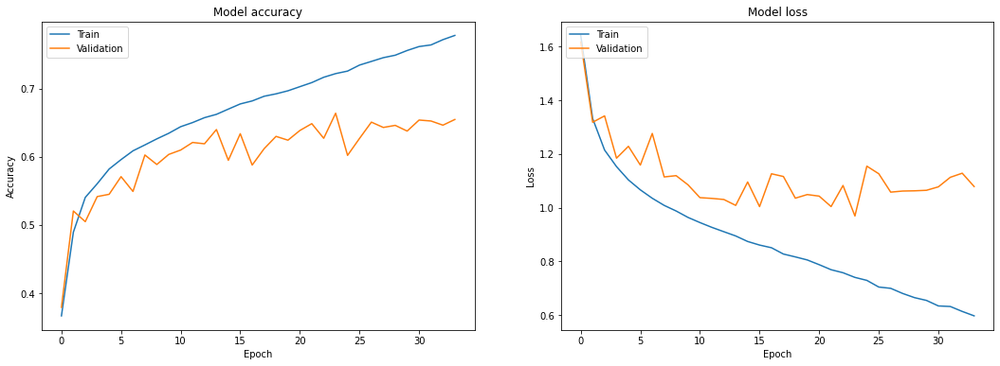


CNN Model Accuracy on test set: 0.6512



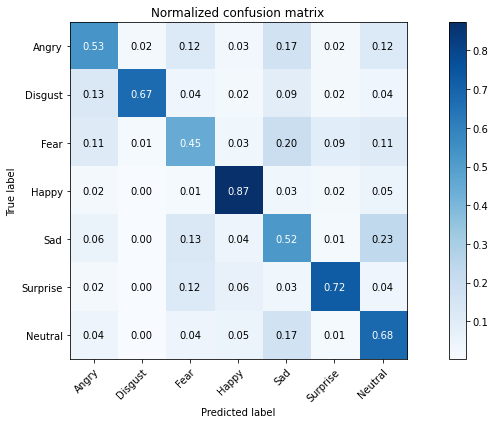

In [ ]:
evaluate_fer_model(history, model, test_X, test_Y)

### Hypothesis 3: Regularization Methods

####1. Changing Dropout Rates 
 
Baseline: Original Model does not have dropout layers

Including dropout layers and varying dropout rates 

*   a. Dropout rate = 0.2
*   b. Dropout rate = 0.5
*   c. Dropout rate = 0.7

All scenarios here are with data augmentation.
Dropout layers added after Dense operations as per convention.







Data Generator and EarlyStopping presets

In [ ]:
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)


es = EarlyStopping(monitor='val_loss', patience = 10, mode = 'min', restore_best_weights=True)

from tensorflow.keras.optimizers import Nadam

**Dropout layer after every dense operation**



1a.  **Dropout rate = 0.2**



In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*2*num_features))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(2*2*2*num_features))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 46, 46, 256)       2560      
                                                                 
 batch_normalization_9 (Batc  (None, 46, 46, 256)      1024      
 hNormalization)                                                 
                                                                 
 activation_9 (Activation)   (None, 46, 46, 256)       0         
                                                                 
 conv2d_7 (Conv2D)           (None, 46, 46, 256)       590080    
                                                                 
 batch_normalization_10 (Bat  (None, 46, 46, 256)      1024      
 chNormalization)                                                
                                                                 
 activation_10 (Activation)  (None, 46, 46, 256)      

In [ ]:
model_withdropouts = model
path_model=start_path+'model_fer__withdropouts.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model.optimizer.lr,1e-3) # set the learning rate
# fit the model
history_withdropouts = model.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
)

Epoch 1/50
449/449 [==============================] - 111s 215ms/step - loss: 1.7269 - accuracy: 0.3192 - val_loss: 1.8772 - val_accuracy: 0.2040
Epoch 2/50
449/449 [==============================] - 96s 214ms/step - loss: 1.3837 - accuracy: 0.4673 - val_loss: 1.3248 - val_accuracy: 0.5015
Epoch 3/50
449/449 [==============================] - 94s 210ms/step - loss: 1.2454 - accuracy: 0.5254 - val_loss: 1.2069 - val_accuracy: 0.5302
Epoch 4/50
449/449 [==============================] - 94s 210ms/step - loss: 1.1733 - accuracy: 0.5531 - val_loss: 1.1582 - val_accuracy: 0.5609
Epoch 5/50
449/449 [==============================] - 94s 210ms/step - loss: 1.1295 - accuracy: 0.5702 - val_loss: 1.2769 - val_accuracy: 0.5241
Epoch 6/50
449/449 [==============================] - 94s 210ms/step - loss: 1.0877 - accuracy: 0.5880 - val_loss: 1.1611 - val_accuracy: 0.5653
Epoch 7/50
449/449 [==============================] - 96s 214ms/step - loss: 1.0660 - accuracy: 0.5980 - val_loss: 1.2570 - val_a

Training and Validation Accuracy/Loss


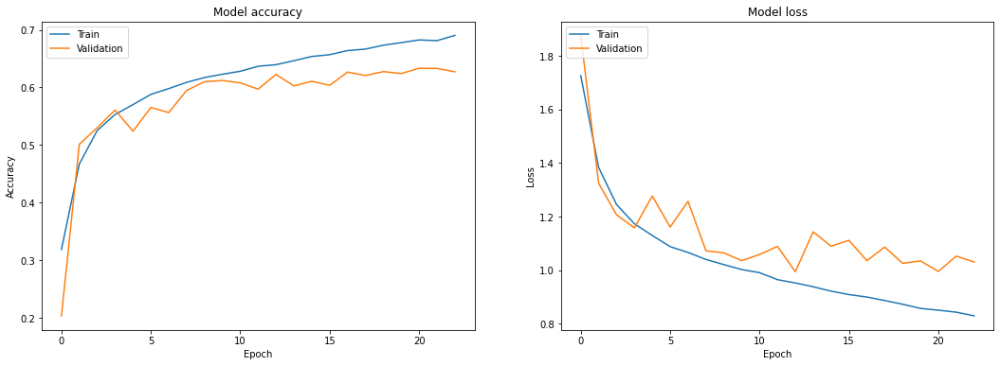


CNN Model Accuracy on test set: 0.6475



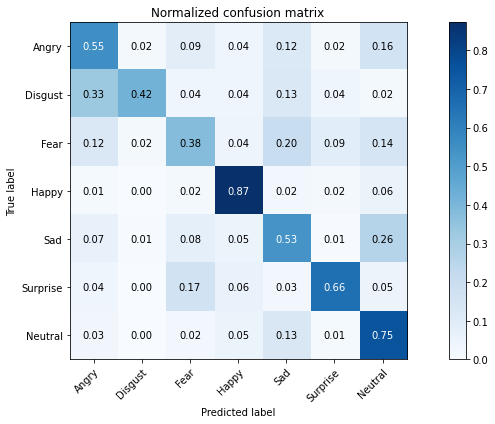

In [ ]:
evaluate_fer_model(history_withdropouts, model_withdropouts, test_X, test_Y)


1b.  **Dropout rate = 0.5**





In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*2*num_features))
model.add(Dropout(0.5))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(2*2*2*num_features))
model.add(Dropout(0.5))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(Dropout(0.5))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 46, 46, 256)       2560      
                                                                 
 batch_normalization (BatchN  (None, 46, 46, 256)      1024      
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 46, 46, 256)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 46, 46, 256)       590080    
                                                                 
 batch_normalization_1 (Batc  (None, 46, 46, 256)      1024      
 hNormalization)                                                 
                                                                 
 activation_1 (Activation)   (None, 46, 46, 256)       0

In [ ]:
model_withdropout05 = model
path_model=start_path+'model_fer__withdropout05.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model.optimizer.lr,1e-3) # set the learning rate
# fit the model
history_withdropout05 = model.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
)

Epoch 1/50
449/449 [==============================] - 101s 211ms/step - loss: 1.8240 - accuracy: 0.2615 - val_loss: 2.0108 - val_accuracy: 0.1733
Epoch 2/50
449/449 [==============================] - 94s 210ms/step - loss: 1.4767 - accuracy: 0.4248 - val_loss: 1.6421 - val_accuracy: 0.3204
Epoch 3/50
449/449 [==============================] - 96s 214ms/step - loss: 1.3207 - accuracy: 0.4952 - val_loss: 1.2526 - val_accuracy: 0.5308
Epoch 4/50
449/449 [==============================] - 94s 210ms/step - loss: 1.2436 - accuracy: 0.5271 - val_loss: 1.4093 - val_accuracy: 0.4472
Epoch 5/50
449/449 [==============================] - 94s 210ms/step - loss: 1.1863 - accuracy: 0.5540 - val_loss: 1.4063 - val_accuracy: 0.4595
Epoch 6/50
449/449 [==============================] - 94s 210ms/step - loss: 1.1445 - accuracy: 0.5699 - val_loss: 1.2564 - val_accuracy: 0.5336
Epoch 7/50
449/449 [==============================] - 94s 210ms/step - loss: 1.1200 - accuracy: 0.5800 - val_loss: 1.1547 - val_a

Training and Validation Accuracy/Loss


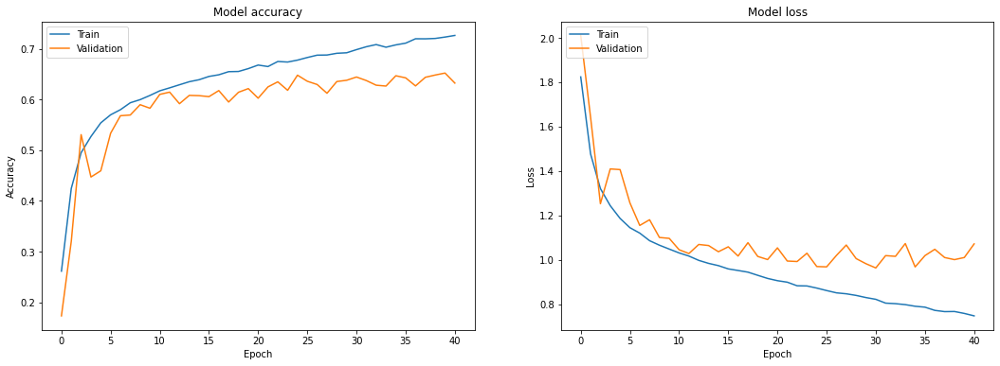


CNN Model Accuracy on test set: 0.6592



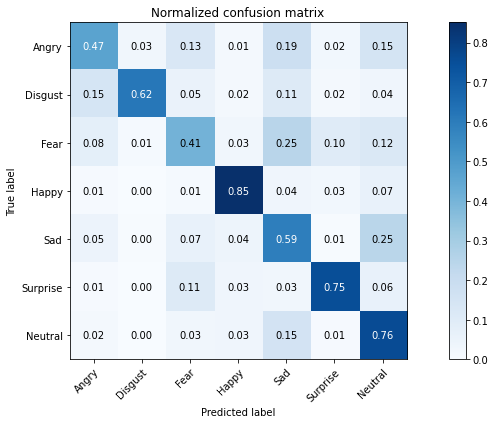

In [ ]:
evaluate_fer_model(history_withdropout05, model_withdropout05, test_X, test_Y)


1c.  **Dropout rate = 0.7**

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*2*num_features))
model.add(Dropout(0.7))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(2*2*2*num_features))
model.add(Dropout(0.7))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(Dropout(0.7))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 46, 46, 256)       2560      
                                                                 
 batch_normalization (BatchN  (None, 46, 46, 256)      1024      
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 46, 46, 256)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 46, 46, 256)       590080    
                                                                 
 batch_normalization_1 (Batc  (None, 46, 46, 256)      1024      
 hNormalization)                                                 
                                                                 
 activation_1 (Activation)   (None, 46, 46, 256)       0

In [ ]:
model_withdropout07 = model
path_model=start_path+'model_fer__withdropout07.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model.optimizer.lr,1e-3) # set the learning rate
# fit the model
history_withdropout07 = model.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
)

Epoch 1/50
449/449 [==============================] - 100s 212ms/step - loss: 1.8779 - accuracy: 0.2135 - val_loss: 1.8235 - val_accuracy: 0.2494
Epoch 2/50
449/449 [==============================] - 94s 210ms/step - loss: 1.7053 - accuracy: 0.2976 - val_loss: 1.7608 - val_accuracy: 0.2190
Epoch 3/50
449/449 [==============================] - 94s 210ms/step - loss: 1.5001 - accuracy: 0.3990 - val_loss: 1.4691 - val_accuracy: 0.4115
Epoch 4/50
449/449 [==============================] - 94s 210ms/step - loss: 1.4062 - accuracy: 0.4368 - val_loss: 1.6062 - val_accuracy: 0.3274
Epoch 5/50
449/449 [==============================] - 94s 210ms/step - loss: 1.3341 - accuracy: 0.4818 - val_loss: 1.3746 - val_accuracy: 0.4751
Epoch 6/50
449/449 [==============================] - 94s 210ms/step - loss: 1.2767 - accuracy: 0.5095 - val_loss: 1.2574 - val_accuracy: 0.5327
Epoch 7/50
449/449 [==============================] - 94s 210ms/step - loss: 1.2285 - accuracy: 0.5329 - val_loss: 1.2677 - val_a

Training and Validation Accuracy/Loss


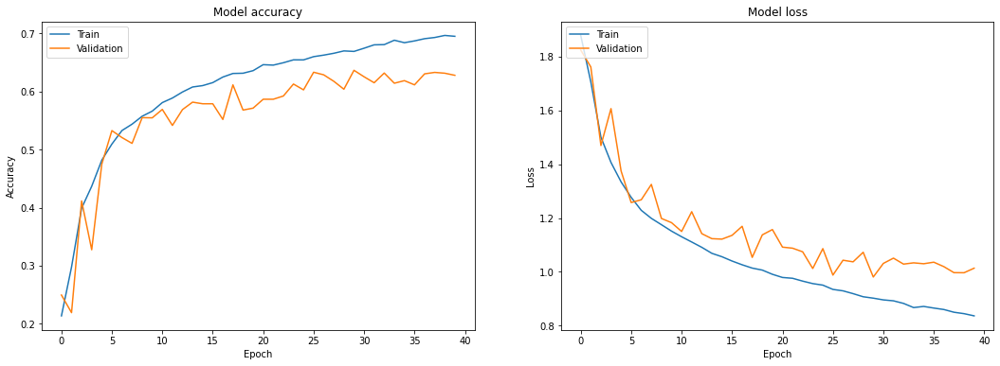


CNN Model Accuracy on test set: 0.6447



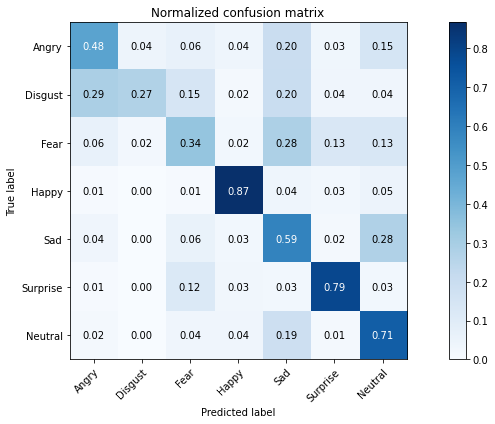

In [ ]:
evaluate_fer_model(history_withdropout07, model_withdropout07, test_X, test_Y)

####2. Increasing Dropout Layers

Previously added dropout layers after every Dense operation but this time, dropout layers are added after every conv operations.

**2a. Dropout rate = 0.2**

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*2*num_features))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(2*2*2*num_features))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 46, 46, 256)       2560      
                                                                 
 dropout (Dropout)           (None, 46, 46, 256)       0         
                                                                 
 batch_normalization (BatchN  (None, 46, 46, 256)      1024      
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 46, 46, 256)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 46, 46, 256)       590080    
                                                                 
 dropout_1 (Dropout)         (None, 46, 46, 256)       0         
                                                        

In [ ]:
model_dropout02convdense = model
path_model=start_path+'model_fer_dropout02convdense.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model.optimizer.lr,1e-3) # set the learning rate
# fit the model
history_dropout02convdense = model.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
)

Epoch 1/50
449/449 [==============================] - 114s 241ms/step - loss: 1.8233 - accuracy: 0.2659 - val_loss: 1.9171 - val_accuracy: 0.1697
Epoch 2/50
449/449 [==============================] - 108s 241ms/step - loss: 1.5690 - accuracy: 0.3842 - val_loss: 1.6469 - val_accuracy: 0.3954
Epoch 3/50
449/449 [==============================] - 108s 241ms/step - loss: 1.3534 - accuracy: 0.4787 - val_loss: 1.4645 - val_accuracy: 0.4210
Epoch 4/50
449/449 [==============================] - 108s 241ms/step - loss: 1.2653 - accuracy: 0.5106 - val_loss: 1.3306 - val_accuracy: 0.4870
Epoch 5/50
449/449 [==============================] - 108s 241ms/step - loss: 1.2080 - accuracy: 0.5423 - val_loss: 1.2335 - val_accuracy: 0.5333
Epoch 6/50
449/449 [==============================] - 108s 241ms/step - loss: 1.1691 - accuracy: 0.5568 - val_loss: 1.1586 - val_accuracy: 0.5511
Epoch 7/50
449/449 [==============================] - 108s 241ms/step - loss: 1.1349 - accuracy: 0.5674 - val_loss: 1.1284 -

Training and Validation Accuracy/Loss


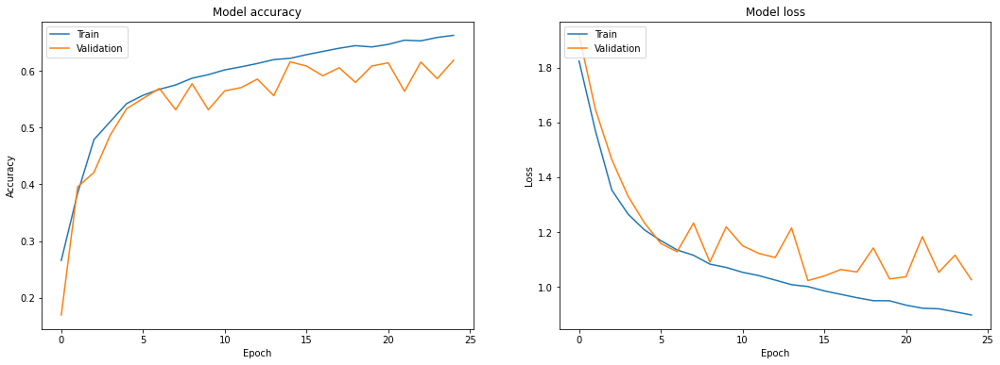


CNN Model Accuracy on test set: 0.6322



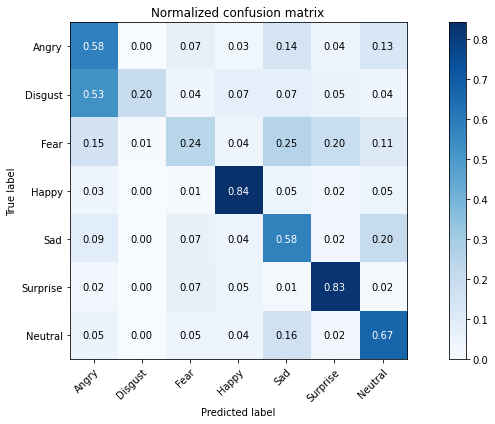

In [ ]:
evaluate_fer_model(history_dropout02convdense, model_dropout02convdense, test_X, test_Y)

**2b. Dropout rate = 0.5**

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(Dropout(0.5))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.5))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.5))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.5))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.5))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.5))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*2*num_features))
model.add(Dropout(0.5))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(2*2*2*num_features))
model.add(Dropout(0.5))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(Dropout(0.5))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 46, 46, 256)       2560      
                                                                 
 dropout (Dropout)           (None, 46, 46, 256)       0         
                                                                 
 batch_normalization (BatchN  (None, 46, 46, 256)      1024      
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 46, 46, 256)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 46, 46, 256)       590080    
                                                                 
 dropout_1 (Dropout)         (None, 46, 46, 256)       0         
                                                        

In [ ]:
model_dropout05convdense = model
path_model=start_path+'model_fer_dropout05convdense.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model.optimizer.lr,1e-3) # set the learning rate
# fit the model
history_dropout05convdense = model.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
)

Epoch 1/50
449/449 [==============================] - 113s 240ms/step - loss: 1.8853 - accuracy: 0.2191 - val_loss: 1.8938 - val_accuracy: 0.1819
Epoch 2/50
449/449 [==============================] - 108s 241ms/step - loss: 1.8000 - accuracy: 0.2497 - val_loss: 1.8693 - val_accuracy: 0.2494
Epoch 3/50
449/449 [==============================] - 108s 241ms/step - loss: 1.7425 - accuracy: 0.2898 - val_loss: 1.9628 - val_accuracy: 0.1819
Epoch 4/50
449/449 [==============================] - 108s 240ms/step - loss: 1.6499 - accuracy: 0.3407 - val_loss: 1.9125 - val_accuracy: 0.2920
Epoch 5/50
449/449 [==============================] - 108s 241ms/step - loss: 1.5419 - accuracy: 0.3906 - val_loss: 1.8984 - val_accuracy: 0.3349
Epoch 6/50
449/449 [==============================] - 108s 241ms/step - loss: 1.4563 - accuracy: 0.4357 - val_loss: 1.9345 - val_accuracy: 0.2522
Epoch 7/50
449/449 [==============================] - 108s 240ms/step - loss: 1.4080 - accuracy: 0.4547 - val_loss: 1.8333 -

Training and Validation Accuracy/Loss


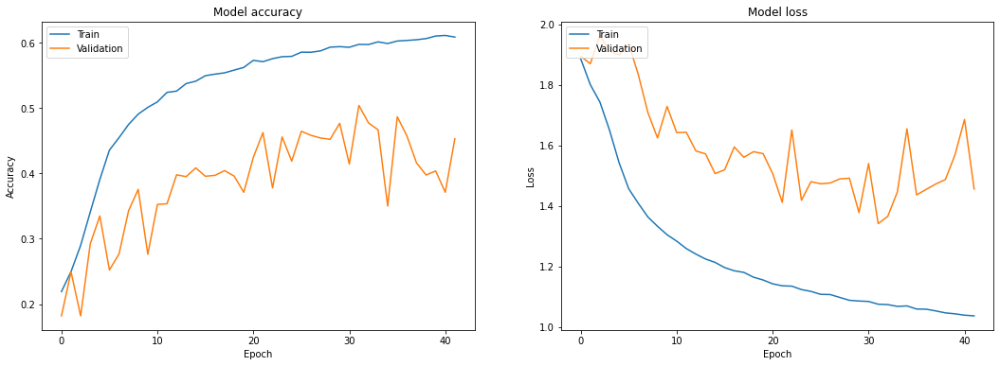


CNN Model Accuracy on test set: 0.5079



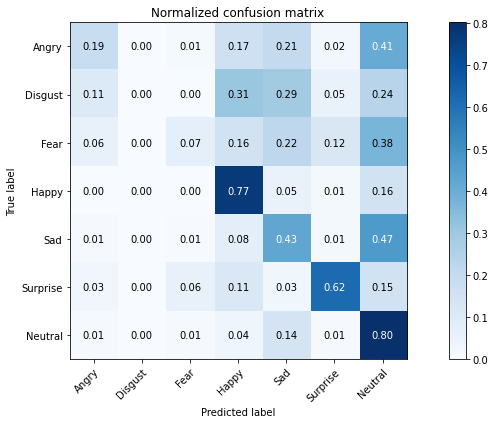

In [ ]:
evaluate_fer_model(history_dropout05convdense, model_dropout05convdense, test_X, test_Y)

**2c. Dropout rate = 0.7**

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(Dropout(0.7))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.7))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.7))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.7))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.7))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.7))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*2*num_features))
model.add(Dropout(0.7))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(2*2*2*num_features))
model.add(Dropout(0.7))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(Dropout(0.7))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 46, 46, 256)       2560      
                                                                 
 dropout (Dropout)           (None, 46, 46, 256)       0         
                                                                 
 batch_normalization (BatchN  (None, 46, 46, 256)      1024      
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 46, 46, 256)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 46, 46, 256)       590080    
                                                                 
 dropout_1 (Dropout)         (None, 46, 46, 256)       0         
                                                        

In [ ]:
model_dropout07convdense = model
path_model=start_path+'model_fer_dropout07convdense.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model.optimizer.lr,1e-3) # set the learning rate
# fit the model
history_dropout07convdense = model.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
)

Epoch 1/50
449/449 [==============================] - 123s 241ms/step - loss: 1.8890 - accuracy: 0.2115 - val_loss: 1.8662 - val_accuracy: 0.1819
Epoch 2/50
449/449 [==============================] - 108s 241ms/step - loss: 1.8242 - accuracy: 0.2259 - val_loss: 1.8460 - val_accuracy: 0.2494
Epoch 3/50
449/449 [==============================] - 108s 241ms/step - loss: 1.8068 - accuracy: 0.2376 - val_loss: 1.8574 - val_accuracy: 0.2494
Epoch 4/50
449/449 [==============================] - 108s 242ms/step - loss: 1.7963 - accuracy: 0.2459 - val_loss: 1.8479 - val_accuracy: 0.2494
Epoch 5/50
449/449 [==============================] - 109s 242ms/step - loss: 1.7870 - accuracy: 0.2551 - val_loss: 1.8748 - val_accuracy: 0.1819
Epoch 6/50
449/449 [==============================] - 108s 241ms/step - loss: 1.7742 - accuracy: 0.2642 - val_loss: 1.8984 - val_accuracy: 0.2494
Epoch 7/50
449/449 [==============================] - 108s 241ms/step - loss: 1.7545 - accuracy: 0.2760 - val_loss: 1.9104 -

Training and Validation Accuracy/Loss


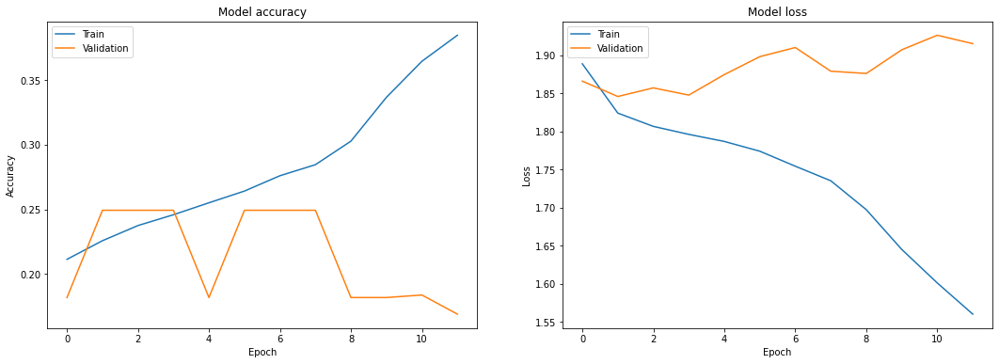


CNN Model Accuracy on test set: 0.2449



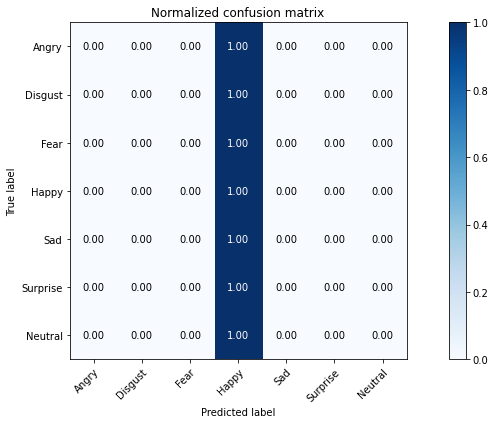

In [ ]:
evaluate_fer_model(history_dropout07convdense, model_dropout07convdense, test_X, test_Y)

####3. Inclusion vs Exclusion of Batch Normalization 

Baseline model: Includes BN

a. Without BN - removal of BN layer completely

b. Without BN - replace BN layer with dropout layer using dropout rate with highest acc

c. Vary number of BN layers used - halving the original number of BN layers used

3a. Removal of Batch Normalization layer 

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(Activation('relu'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(Activation('relu'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(Activation('relu'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*2*num_features))
model.add(Activation('relu'))

model.add(Dense(2*2*2*num_features))
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 46, 46, 256)       2560      
                                                                 
 activation_9 (Activation)   (None, 46, 46, 256)       0         
                                                                 
 conv2d_7 (Conv2D)           (None, 46, 46, 256)       590080    
                                                                 
 activation_10 (Activation)  (None, 46, 46, 256)       0         
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 23, 23, 256)      0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 23, 23, 128)       295040    
                                                      

In [ ]:
model_withoutbn = model
path_model=start_path+'model_fer_withoutbn.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model.optimizer.lr,1e-3) # set the learning rate
# fit the model
history_withoutbn = model_withoutbn.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
)

Epoch 1/50
449/449 [==============================] - 78s 166ms/step - loss: 1.8173 - accuracy: 0.2497 - val_loss: 1.8081 - val_accuracy: 0.2494
Epoch 2/50
449/449 [==============================] - 72s 159ms/step - loss: 1.7691 - accuracy: 0.2711 - val_loss: 1.6748 - val_accuracy: 0.3285
Epoch 3/50
449/449 [==============================] - 71s 159ms/step - loss: 1.6035 - accuracy: 0.3650 - val_loss: 1.4669 - val_accuracy: 0.4280
Epoch 4/50
449/449 [==============================] - 71s 159ms/step - loss: 1.4946 - accuracy: 0.4117 - val_loss: 1.4094 - val_accuracy: 0.4567
Epoch 5/50
449/449 [==============================] - 74s 164ms/step - loss: 1.4048 - accuracy: 0.4564 - val_loss: 1.3152 - val_accuracy: 0.5049
Epoch 6/50
449/449 [==============================] - 71s 159ms/step - loss: 1.3410 - accuracy: 0.4849 - val_loss: 1.2677 - val_accuracy: 0.5196
Epoch 7/50
449/449 [==============================] - 71s 158ms/step - loss: 1.2865 - accuracy: 0.5032 - val_loss: 1.2382 - val_ac

Training and Validation Accuracy/Loss


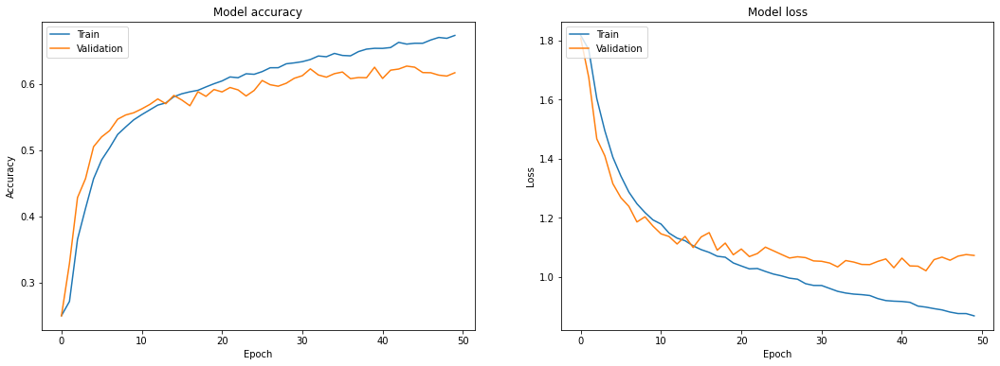


CNN Model Accuracy on test set: 0.6269



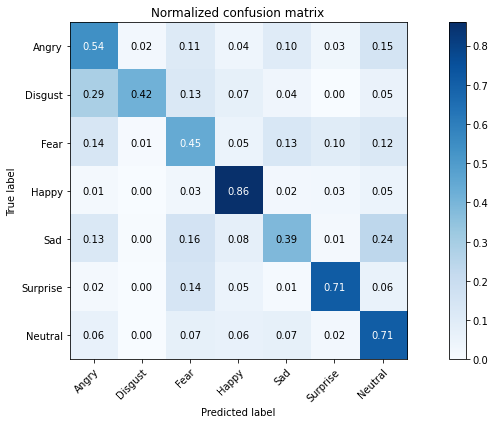

In [ ]:
evaluate_fer_model(history_withoutbn, model_withoutbn, test_X, test_Y)

3b. Replace Batch Normalization layer with hyperparameter tuned dropout rate in conv layers

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(Dropout(0.5))
model.add(Activation('relu'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.5))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.5))
model.add(Activation('relu'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.5))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.5))
model.add(Activation('relu'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.5))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*2*num_features))
model.add(Dropout(0.5))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(2*2*2*num_features))
model.add(Dropout(0.5))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(Dropout(0.5))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 46, 46, 256)       2560      
                                                                 
 dropout (Dropout)           (None, 46, 46, 256)       0         
                                                                 
 activation (Activation)     (None, 46, 46, 256)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 46, 46, 256)       590080    
                                                                 
 dropout_1 (Dropout)         (None, 46, 46, 256)       0         
                                                                 
 activation_1 (Activation)   (None, 46, 46, 256)       0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 23, 23, 256)      0

In [ ]:
model_doinconv = model
path_model=start_path+'model_fer_doinconv.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model.optimizer.lr,1e-3) # set the learning rate
# fit the model
history_doinconv = model_doinconv.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
)

Epoch 1/50
449/449 [==============================] - 101s 215ms/step - loss: 1.8984 - accuracy: 0.2171 - val_loss: 1.8585 - val_accuracy: 0.2118
Epoch 2/50
449/449 [==============================] - 94s 210ms/step - loss: 1.8073 - accuracy: 0.2441 - val_loss: 1.9029 - val_accuracy: 0.2494
Epoch 3/50
449/449 [==============================] - 94s 210ms/step - loss: 1.7524 - accuracy: 0.2830 - val_loss: 1.8708 - val_accuracy: 0.2494
Epoch 4/50
449/449 [==============================] - 97s 215ms/step - loss: 1.7022 - accuracy: 0.3156 - val_loss: 1.9426 - val_accuracy: 0.2513
Epoch 5/50
449/449 [==============================] - 94s 209ms/step - loss: 1.6516 - accuracy: 0.3464 - val_loss: 1.8525 - val_accuracy: 0.3023
Epoch 6/50
449/449 [==============================] - 94s 209ms/step - loss: 1.6066 - accuracy: 0.3653 - val_loss: 1.8470 - val_accuracy: 0.3204
Epoch 7/50
449/449 [==============================] - 94s 209ms/step - loss: 1.5580 - accuracy: 0.3923 - val_loss: 1.7901 - val_a

Training and Validation Accuracy/Loss


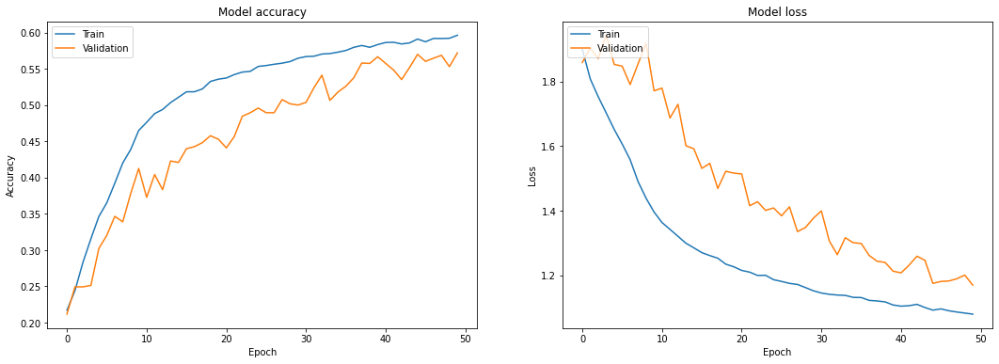


CNN Model Accuracy on test set: 0.5759



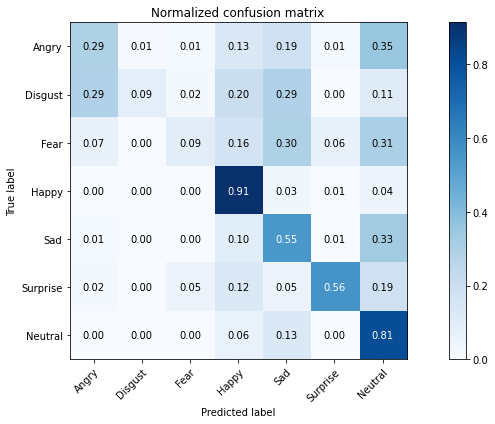

In [ ]:
evaluate_fer_model(history_doinconv, model_doinconv, test_X, test_Y)

Replace Batch Normalization layer with hyperparameter tuned dropout rate in conv layers AND dense layers

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(Dropout(0.5))
model.add(Activation('relu'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.5))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.5))
model.add(Activation('relu'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.5))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.5))
model.add(Activation('relu'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(Dropout(0.5))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*2*num_features))
model.add(Dropout(0.5))
model.add(Activation('relu'))

model.add(Dense(2*2*2*num_features))
model.add(Dropout(0.5))
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(Dropout(0.5))
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 46, 46, 256)       2560      
                                                                 
 dropout (Dropout)           (None, 46, 46, 256)       0         
                                                                 
 activation (Activation)     (None, 46, 46, 256)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 46, 46, 256)       590080    
                                                                 
 dropout_1 (Dropout)         (None, 46, 46, 256)       0         
                                                                 
 activation_1 (Activation)   (None, 46, 46, 256)       0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 23, 23, 256)      0

In [ ]:
model_doinconvnobndense = model
path_model=start_path+'model_fer_doinconvnobndense.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model.optimizer.lr,1e-3) # set the learning rate
# fit the model
history_doinconvnobndense = model_doinconvnobndense.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
)

Epoch 1/50
449/449 [==============================] - 96s 207ms/step - loss: 1.8270 - accuracy: 0.2443 - val_loss: 1.8117 - val_accuracy: 0.2494
Epoch 2/50
449/449 [==============================] - 93s 208ms/step - loss: 1.8151 - accuracy: 0.2511 - val_loss: 1.8154 - val_accuracy: 0.2494
Epoch 3/50
449/449 [==============================] - 91s 203ms/step - loss: 1.8140 - accuracy: 0.2513 - val_loss: 1.8112 - val_accuracy: 0.2494
Epoch 4/50
449/449 [==============================] - 92s 205ms/step - loss: 1.8127 - accuracy: 0.2513 - val_loss: 1.8120 - val_accuracy: 0.2494
Epoch 5/50
449/449 [==============================] - 92s 205ms/step - loss: 1.8115 - accuracy: 0.2513 - val_loss: 1.8133 - val_accuracy: 0.2494
Epoch 6/50
449/449 [==============================] - 92s 205ms/step - loss: 1.8122 - accuracy: 0.2513 - val_loss: 1.8113 - val_accuracy: 0.2494
Epoch 7/50
449/449 [==============================] - 92s 204ms/step - loss: 1.8111 - accuracy: 0.2513 - val_loss: 1.8107 - val_ac

Training and Validation Accuracy/Loss


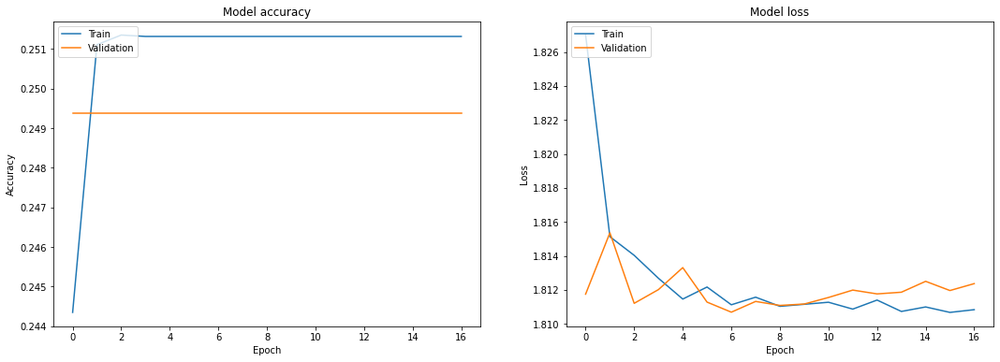


CNN Model Accuracy on test set: 0.2449



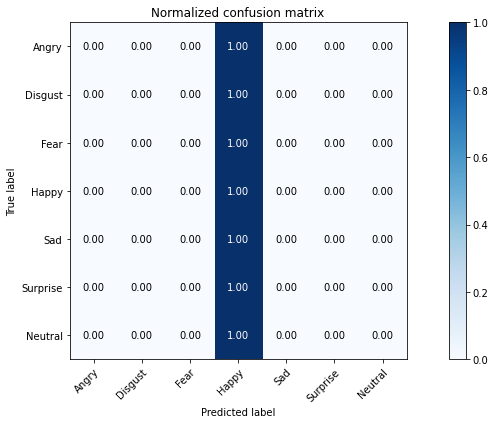

In [ ]:
evaluate_fer_model(history_doinconvnobndense, model_doinconvnobndense, test_X, test_Y)

3c. Varying the number of Batch Normalization layers used

**5 BN Layers** vs Original 9 BN layers

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(2*2*2*num_features))
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 46, 46, 256)       2560      
                                                                 
 batch_normalization (BatchN  (None, 46, 46, 256)      1024      
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 46, 46, 256)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 46, 46, 256)       590080    
                                                                 
 activation_1 (Activation)   (None, 46, 46, 256)       0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 23, 23, 256)      0         
 )                                                      

In [ ]:
model_with5bn = model
path_model=start_path+'model_fer_with5bn.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model.optimizer.lr,1e-3) # set the learning rate
# fit the model
history_with5bn = model_with5bn.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
)

Epoch 1/50
449/449 [==============================] - 100s 188ms/step - loss: 1.6513 - accuracy: 0.3454 - val_loss: 1.7014 - val_accuracy: 0.3129
Epoch 2/50
449/449 [==============================] - 83s 185ms/step - loss: 1.3394 - accuracy: 0.4829 - val_loss: 1.3180 - val_accuracy: 0.4812
Epoch 3/50
449/449 [==============================] - 83s 186ms/step - loss: 1.2146 - accuracy: 0.5334 - val_loss: 1.5499 - val_accuracy: 0.4511
Epoch 4/50
449/449 [==============================] - 83s 185ms/step - loss: 1.1498 - accuracy: 0.5619 - val_loss: 1.2067 - val_accuracy: 0.5450
Epoch 5/50
449/449 [==============================] - 83s 185ms/step - loss: 1.1041 - accuracy: 0.5828 - val_loss: 1.3343 - val_accuracy: 0.5171
Epoch 6/50
449/449 [==============================] - 83s 185ms/step - loss: 1.0664 - accuracy: 0.5954 - val_loss: 1.1847 - val_accuracy: 0.5542
Epoch 7/50
449/449 [==============================] - 83s 185ms/step - loss: 1.0356 - accuracy: 0.6045 - val_loss: 1.2717 - val_a

Training and Validation Accuracy/Loss


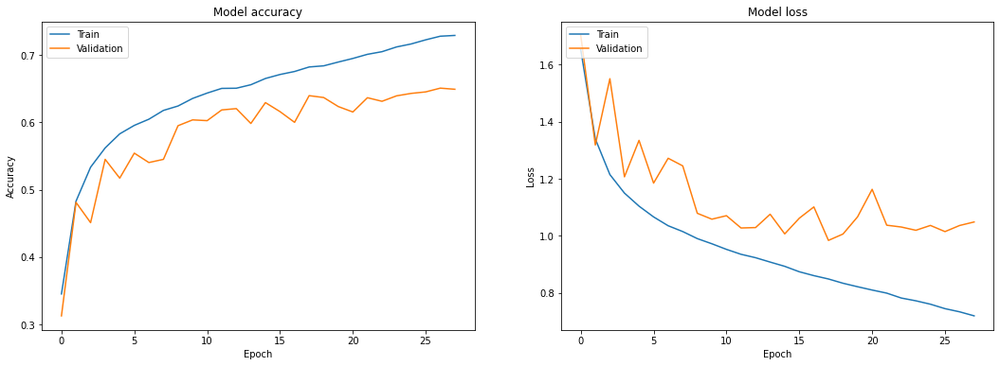


CNN Model Accuracy on test set: 0.6531



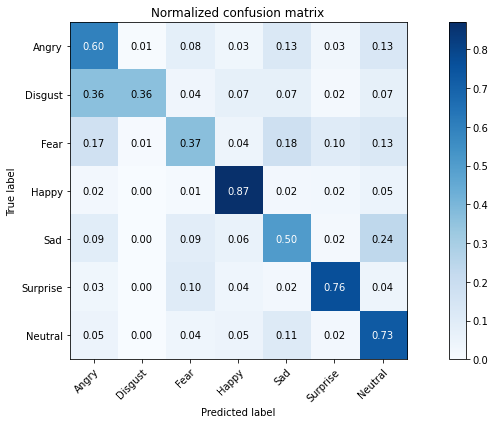

In [ ]:
evaluate_fer_model(history_with5bn, model_with5bn, test_X, test_Y)

**Also 5 BN layers but different sequence**

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(Activation('relu'))
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(Activation('relu'))
model.add(Conv2D(2*num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(Activation('relu'))
model.add(Conv2D(num_features, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*2*num_features))
model.add(Activation('relu'))

model.add(Dense(2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 46, 46, 256)       2560      
                                                                 
 activation (Activation)     (None, 46, 46, 256)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 46, 46, 256)       590080    
                                                                 
 batch_normalization (BatchN  (None, 46, 46, 256)      1024      
 ormalization)                                                   
                                                                 
 activation_1 (Activation)   (None, 46, 46, 256)       0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 23, 23, 256)      0         
 )                                                      

In [ ]:
model_with5bnpt2 = model
path_model=start_path+'model_fer_with5bnpt2.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model.optimizer.lr,1e-3) # set the learning rate
# fit the model
history_with5bnpt2 = model_with5bnpt2.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
)

Epoch 1/50
449/449 [==============================] - 90s 189ms/step - loss: 1.6628 - accuracy: 0.3397 - val_loss: 1.8005 - val_accuracy: 0.3162
Epoch 2/50
449/449 [==============================] - 85s 188ms/step - loss: 1.3655 - accuracy: 0.4757 - val_loss: 1.5382 - val_accuracy: 0.4093
Epoch 3/50
449/449 [==============================] - 84s 187ms/step - loss: 1.2509 - accuracy: 0.5194 - val_loss: 1.2718 - val_accuracy: 0.5227
Epoch 4/50
449/449 [==============================] - 84s 186ms/step - loss: 1.1773 - accuracy: 0.5524 - val_loss: 1.3489 - val_accuracy: 0.5130
Epoch 5/50
449/449 [==============================] - 84s 186ms/step - loss: 1.1366 - accuracy: 0.5662 - val_loss: 1.2336 - val_accuracy: 0.5483
Epoch 6/50
449/449 [==============================] - 84s 187ms/step - loss: 1.0990 - accuracy: 0.5839 - val_loss: 1.2343 - val_accuracy: 0.5378
Epoch 7/50
449/449 [==============================] - 84s 187ms/step - loss: 1.0694 - accuracy: 0.5970 - val_loss: 1.2293 - val_ac

Training and Validation Accuracy/Loss


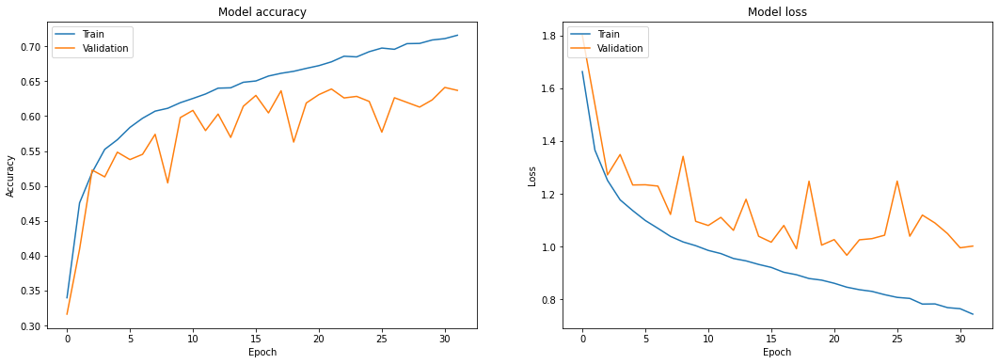


CNN Model Accuracy on test set: 0.6562



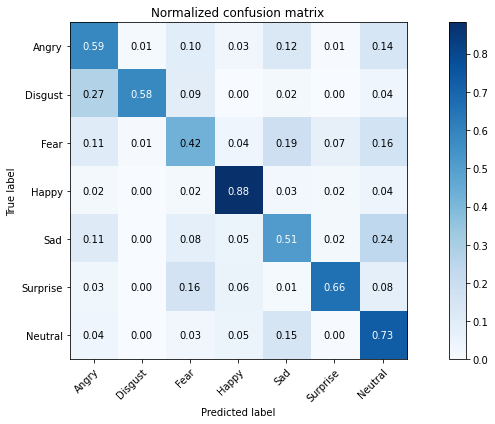

In [ ]:
evaluate_fer_model(history_with5bnpt2, model_with5bnpt2, test_X, test_Y)

### Hypothesis 4: Changes in Kernel Size/Filter, Max Pooling sizes

#### 1a. Changing kernel sizes from (5,5) -> (3.3) -> (1,1) while increasing neurons from 32 -> 64 -> 128 in Conv2d layers

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(32, kernel_size=(5, 5), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(32, kernel_size=(5, 5), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(64, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(64, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(128, kernel_size=(1, 1), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(128, kernel_size=(1, 1), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 44, 44, 32)        832       
                                                                 
 batch_normalization (BatchN  (None, 44, 44, 32)       128       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 44, 44, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 44, 44, 32)        25632     
                                                                 
 batch_normalization_1 (Batc  (None, 44, 44, 32)       128       
 hNormalization)                                                 
                                                                 
 activation_1 (Activation)   (None, 44, 44, 32)        0

In [ ]:
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)


es = EarlyStopping(monitor='val_loss', patience = 10, mode = 'min', restore_best_weights=True)

# history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
#                                 steps_per_epoch=len(train_X) / batch_size,
#                                 epochs=num_epochs,
#                                 verbose=1, 
#                                 callbacks = [es],
#                                 validation_data=(val_X, val_Y))


path_model=start_path+'model_fer_pool.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model.optimizer.lr,1e-3) # set the learning rate
# fit the model
history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

Epoch 1/50
449/449 [==============================] - 42s 64ms/step - loss: 1.6602 - accuracy: 0.3474 - val_loss: 1.6462 - val_accuracy: 0.3360
Epoch 2/50
449/449 [==============================] - 29s 64ms/step - loss: 1.3867 - accuracy: 0.4634 - val_loss: 1.5339 - val_accuracy: 0.3965
Epoch 3/50
449/449 [==============================] - 29s 65ms/step - loss: 1.2735 - accuracy: 0.5145 - val_loss: 1.2933 - val_accuracy: 0.5132
Epoch 4/50
449/449 [==============================] - 29s 65ms/step - loss: 1.2122 - accuracy: 0.5393 - val_loss: 1.2126 - val_accuracy: 0.5297
Epoch 5/50
449/449 [==============================] - 29s 65ms/step - loss: 1.1635 - accuracy: 0.5571 - val_loss: 1.2191 - val_accuracy: 0.5389
Epoch 6/50
449/449 [==============================] - 29s 64ms/step - loss: 1.1259 - accuracy: 0.5723 - val_loss: 1.1661 - val_accuracy: 0.5534
Epoch 7/50
449/449 [==============================] - 29s 64ms/step - loss: 1.0982 - accuracy: 0.5831 - val_loss: 1.1552 - val_accuracy:

Training and Validation Accuracy/Loss


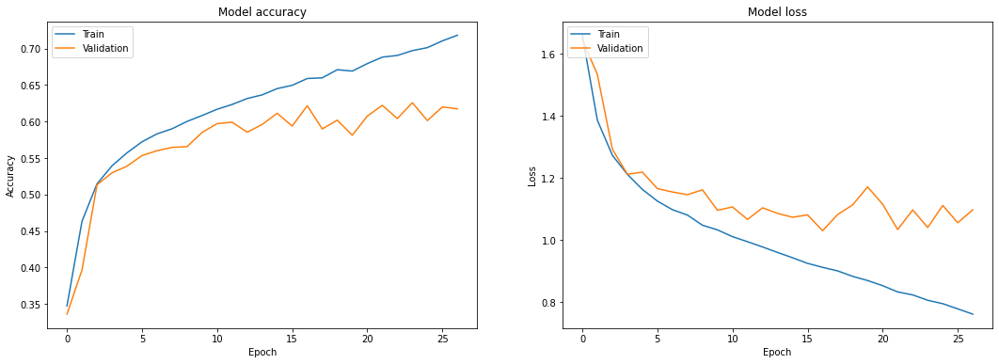


CNN Model Accuracy on test set: 0.6330



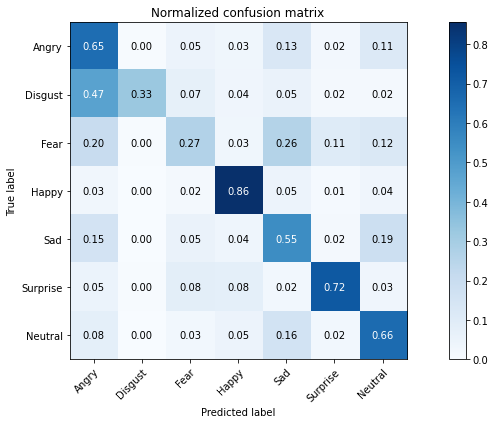

In [ ]:
evaluate_fer_model(history, model, test_X, test_Y)

#### 1b. Making 1a more cost-effective

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(32, kernel_size=(1, 5), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(32, kernel_size=(5, 1), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 2
model.add(Conv2D(64, kernel_size=(1, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(64, kernel_size=(3, 1), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(128, kernel_size=(1, 1), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(128, kernel_size=(1, 1), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 48, 44, 32)        192       
                                                                 
 batch_normalization (BatchN  (None, 48, 44, 32)       128       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 48, 44, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 48, 44, 32)        5152      
                                                                 
 batch_normalization_1 (Batc  (None, 48, 44, 32)       128       
 hNormalization)                                                 
                                                                 
 activation_1 (Activation)   (None, 48, 44, 32)        0

In [ ]:
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)


es = EarlyStopping(monitor='val_loss', patience = 10, mode = 'min', restore_best_weights=True)

# history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
#                                 steps_per_epoch=len(train_X) / batch_size,
#                                 epochs=num_epochs,
#                                 verbose=1, 
#                                 callbacks = [es],
#                                 validation_data=(val_X, val_Y))


path_model=start_path+'model_fer_pool_2.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model.optimizer.lr,1e-3) # set the learning rate
# fit the model
history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

Epoch 1/50
449/449 [==============================] - 31s 58ms/step - loss: 1.6367 - accuracy: 0.3594 - val_loss: 1.7322 - val_accuracy: 0.3486
Epoch 2/50
449/449 [==============================] - 26s 59ms/step - loss: 1.4130 - accuracy: 0.4542 - val_loss: 1.3948 - val_accuracy: 0.4611
Epoch 3/50
449/449 [==============================] - 26s 57ms/step - loss: 1.3178 - accuracy: 0.4924 - val_loss: 1.3122 - val_accuracy: 0.4932
Epoch 4/50
449/449 [==============================] - 26s 58ms/step - loss: 1.2526 - accuracy: 0.5200 - val_loss: 1.2226 - val_accuracy: 0.5419
Epoch 5/50
449/449 [==============================] - 26s 59ms/step - loss: 1.2069 - accuracy: 0.5398 - val_loss: 1.2927 - val_accuracy: 0.4976
Epoch 6/50
449/449 [==============================] - 26s 58ms/step - loss: 1.1696 - accuracy: 0.5557 - val_loss: 1.2287 - val_accuracy: 0.5414
Epoch 7/50
449/449 [==============================] - 26s 58ms/step - loss: 1.1381 - accuracy: 0.5687 - val_loss: 1.1688 - val_accuracy:

Training and Validation Accuracy/Loss


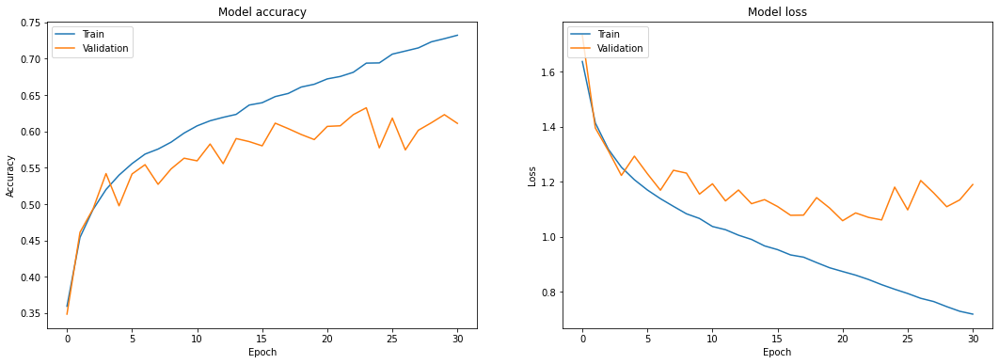


CNN Model Accuracy on test set: 0.6219



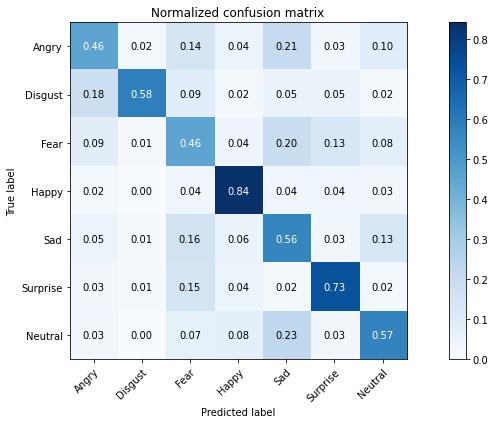

In [ ]:
evaluate_fer_model(history, model, test_X, test_Y)

#### 2a. Changing pooling sizes

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(32, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(32, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(3, 3), strides=(3, 3)))

#module 2
model.add(Conv2D(64, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(64, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(128, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(128, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(1, 1)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 46, 46, 32)        320       
                                                                 
 batch_normalization (BatchN  (None, 46, 46, 32)       128       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 46, 46, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 46, 46, 32)        9248      
                                                                 
 batch_normalization_1 (Batc  (None, 46, 46, 32)       128       
 hNormalization)                                                 
                                                                 
 activation_1 (Activation)   (None, 46, 46, 32)        0

In [ ]:
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)


es = EarlyStopping(monitor='val_loss', patience = 10, mode = 'min', restore_best_weights=True)

# history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
#                                 steps_per_epoch=len(train_X) / batch_size,
#                                 epochs=num_epochs,
#                                 verbose=1, 
#                                 callbacks = [es],
#                                 validation_data=(val_X, val_Y))


path_model=start_path+'model_fer_pool_3.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model.optimizer.lr,1e-3) # set the learning rate
# fit the model
history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

Epoch 1/50
449/449 [==============================] - 33s 64ms/step - loss: 1.5557 - accuracy: 0.3951 - val_loss: 1.6771 - val_accuracy: 0.3608
Epoch 2/50
449/449 [==============================] - 28s 62ms/step - loss: 1.2910 - accuracy: 0.5028 - val_loss: 1.2591 - val_accuracy: 0.5283
Epoch 3/50
449/449 [==============================] - 28s 62ms/step - loss: 1.1944 - accuracy: 0.5471 - val_loss: 1.2378 - val_accuracy: 0.5311
Epoch 4/50
449/449 [==============================] - 28s 62ms/step - loss: 1.1357 - accuracy: 0.5670 - val_loss: 1.2728 - val_accuracy: 0.5542
Epoch 5/50
449/449 [==============================] - 28s 62ms/step - loss: 1.0983 - accuracy: 0.5801 - val_loss: 1.4671 - val_accuracy: 0.4528
Epoch 6/50
449/449 [==============================] - 29s 64ms/step - loss: 1.0643 - accuracy: 0.5955 - val_loss: 1.1460 - val_accuracy: 0.5575
Epoch 7/50
449/449 [==============================] - 29s 64ms/step - loss: 1.0382 - accuracy: 0.6067 - val_loss: 1.1296 - val_accuracy:

Training and Validation Accuracy/Loss


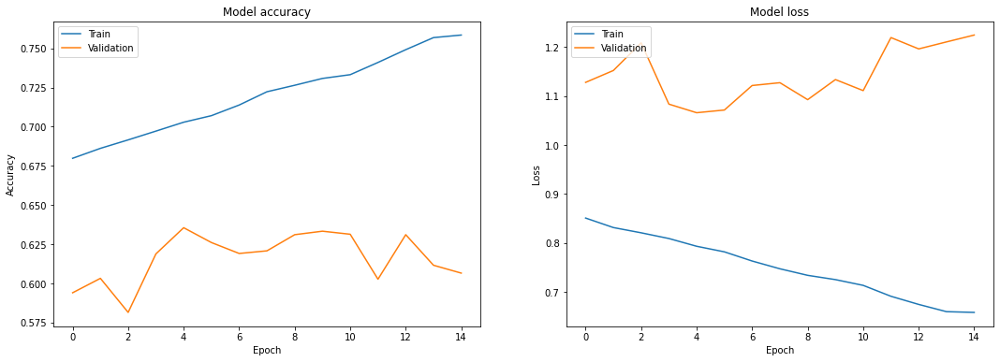


CNN Model Accuracy on test set: 0.6473



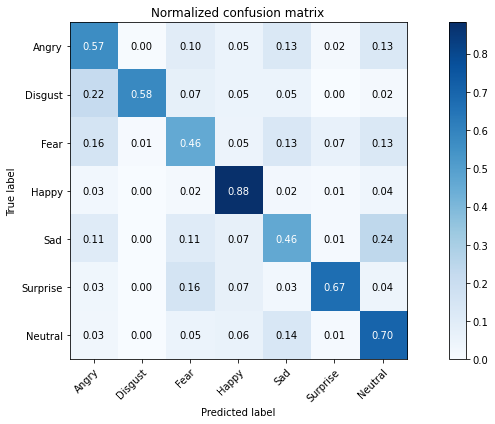

In [ ]:
evaluate_fer_model(history, model, test_X, test_Y)

#### 2b. Changing pooling sizes + stride sizes (size = 1,1)

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(32, kernel_size=(3, 3), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(32, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(3, 3), strides=(1, 1)))

#module 2
model.add(Conv2D(64, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(64, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(1, 1)))

#module 3
model.add(Conv2D(128, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(128, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(1, 1)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 46, 46, 32)        320       
                                                                 
 batch_normalization_9 (Batc  (None, 46, 46, 32)       128       
 hNormalization)                                                 
                                                                 
 activation_9 (Activation)   (None, 46, 46, 32)        0         
                                                                 
 conv2d_7 (Conv2D)           (None, 46, 46, 32)        9248      
                                                                 
 batch_normalization_10 (Bat  (None, 46, 46, 32)       128       
 chNormalization)                                                
                                                                 
 activation_10 (Activation)  (None, 46, 46, 32)       

In [ ]:
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)


es = EarlyStopping(monitor='val_loss', patience = 10, mode = 'min', restore_best_weights=True)

# history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
#                                 steps_per_epoch=len(train_X) / batch_size,
#                                 epochs=num_epochs,
#                                 verbose=1, 
#                                 callbacks = [es],
#                                 validation_data=(val_X, val_Y))


path_model=start_path+'model_fer_pool_6.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model.optimizer.lr,1e-3) # set the learning rate
# fit the model
history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

Epoch 1/50
449/449 [==============================] - 292s 616ms/step - loss: 1.5853 - accuracy: 0.3783 - val_loss: 1.6056 - val_accuracy: 0.3605
Epoch 2/50
449/449 [==============================] - 254s 566ms/step - loss: 1.3387 - accuracy: 0.4864 - val_loss: 1.4876 - val_accuracy: 0.4391
Epoch 3/50
449/449 [==============================] - 253s 564ms/step - loss: 1.2397 - accuracy: 0.5266 - val_loss: 1.3318 - val_accuracy: 0.5219
Epoch 4/50
449/449 [==============================] - 250s 558ms/step - loss: 1.1709 - accuracy: 0.5562 - val_loss: 1.3520 - val_accuracy: 0.4909
Epoch 5/50
449/449 [==============================] - 254s 565ms/step - loss: 1.1360 - accuracy: 0.5672 - val_loss: 1.2260 - val_accuracy: 0.5316
Epoch 6/50
449/449 [==============================] - 250s 558ms/step - loss: 1.1007 - accuracy: 0.5832 - val_loss: 1.2814 - val_accuracy: 0.5372
Epoch 7/50
449/449 [==============================] - 254s 566ms/step - loss: 1.0698 - accuracy: 0.5959 - val_loss: 1.2862 -

In [ ]:
evaluate_fer_model(history, model, test_X, test_Y)

#### 3. Changing pooling sizes + kernel sizes

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(32, kernel_size=(5, 5), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(32, kernel_size=(5, 5), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(3, 3), strides=(3, 3)))

#module 2
model.add(Conv2D(64, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(64, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#module 3
model.add(Conv2D(128, kernel_size=(1, 1), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(128, kernel_size=(1, 1), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(1, 1)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

In [ ]:
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)


es = EarlyStopping(monitor='val_loss', patience = 10, mode = 'min', restore_best_weights=True)

# history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
#                                 steps_per_epoch=len(train_X) / batch_size,
#                                 epochs=num_epochs,
#                                 verbose=1, 
#                                 callbacks = [es],
#                                 validation_data=(val_X, val_Y))


path_model=start_path+'model_fer_pool_5.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model.optimizer.lr,1e-3) # set the learning rate
# fit the model
history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

In [ ]:
evaluate_fer_model(history, model, test_X, test_Y)

#### 4. Enlarging kernel and pooling sizes 

In [ ]:
model = Sequential()

#module 1
model.add(Conv2D(32, kernel_size=(7, 7), input_shape=(width, height, 1), data_format='channels_last'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(32, kernel_size=(5, 5), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(5, 5), strides=(3, 3)))

#module 2
model.add(Conv2D(64, kernel_size=(5, 5), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(64, kernel_size=(5, 5), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2)))

#module 3
model.add(Conv2D(128, kernel_size=(5, 5), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(128, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(1, 1)))

#flatten
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 42, 42, 32)        1600      
                                                                 
 batch_normalization (BatchN  (None, 42, 42, 32)       128       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 42, 42, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 42, 42, 32)        25632     
                                                                 
 batch_normalization_1 (Batc  (None, 42, 42, 32)       128       
 hNormalization)                                                 
                                                                 
 activation_1 (Activation)   (None, 42, 42, 32)        0

In [ ]:
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)


es = EarlyStopping(monitor='val_loss', patience = 10, mode = 'min', restore_best_weights=True)

# history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
#                                 steps_per_epoch=len(train_X) / batch_size,
#                                 epochs=num_epochs,
#                                 verbose=1, 
#                                 callbacks = [es],
#                                 validation_data=(val_X, val_Y))


path_model=start_path+'model_fer_pool_4.h5' # save model at this location after each epoch
tensorflow.keras.backend.clear_session() # destroys the current graph and builds a new one
K.set_value(model.optimizer.lr,1e-3) # set the learning rate
# fit the model
history = model.fit(data_generator.flow(train_X, train_Y, batch_size),
            batch_size=batch_size, 
            epochs=num_epochs, 
            verbose=1, 
            validation_data=(val_X, val_Y),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

Epoch 1/50
449/449 [==============================] - 32s 61ms/step - loss: 1.6009 - accuracy: 0.3715 - val_loss: 1.5910 - val_accuracy: 0.3748
Epoch 2/50
449/449 [==============================] - 27s 61ms/step - loss: 1.3437 - accuracy: 0.4857 - val_loss: 1.6399 - val_accuracy: 0.4436
Epoch 3/50
449/449 [==============================] - 27s 61ms/step - loss: 1.2435 - accuracy: 0.5254 - val_loss: 1.5939 - val_accuracy: 0.4739
Epoch 4/50
449/449 [==============================] - 27s 61ms/step - loss: 1.1880 - accuracy: 0.5502 - val_loss: 1.4353 - val_accuracy: 0.5024
Epoch 5/50
449/449 [==============================] - 28s 61ms/step - loss: 1.1514 - accuracy: 0.5661 - val_loss: 1.4167 - val_accuracy: 0.4753
Epoch 6/50
449/449 [==============================] - 27s 61ms/step - loss: 1.1152 - accuracy: 0.5771 - val_loss: 1.2647 - val_accuracy: 0.5277
Epoch 7/50
449/449 [==============================] - 27s 60ms/step - loss: 1.0869 - accuracy: 0.5915 - val_loss: 1.3197 - val_accuracy:

Training and Validation Accuracy/Loss


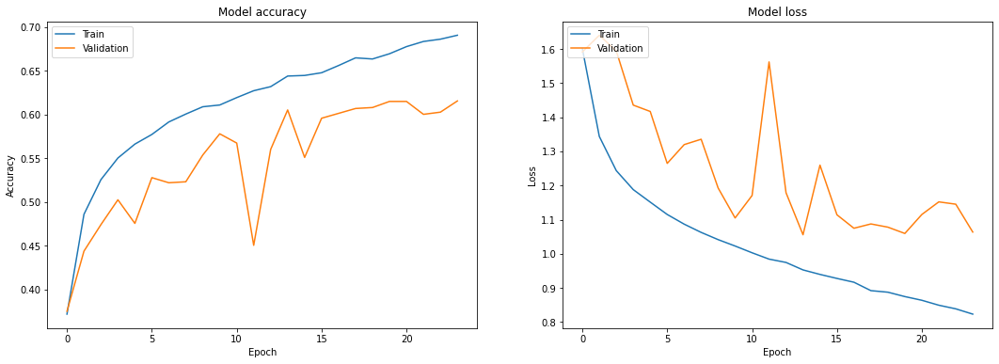


CNN Model Accuracy on test set: 0.6322



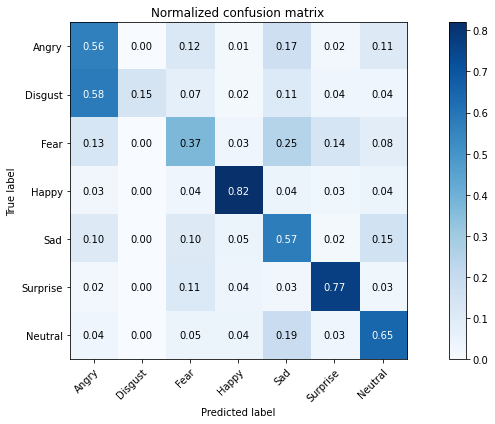

In [ ]:
evaluate_fer_model(history, model, test_X, test_Y)

#### Results

In [ ]:
model1a = load_model(start_path+'model_fer_pool.h5')
model1b = load_model(start_path+'model_fer_pool_2.h5')
model2a = load_model(start_path+'model_fer_pool_3.h5')

model3 = load_model(start_path+'model_fer_pool_5.h5')
model4 = load_model(start_path+'model_fer_pool_4.h5')

test_true = np.argmax(test_Y, axis=1)
test_pred_1a = np.argmax(model1a.predict(test_X), axis=1)
print("CNN Model Accuracy on test set: {:.4f}".format(accuracy_score(test_true, test_pred_1a)))

test_pred_1b = np.argmax(model1b.predict(test_X), axis=1)
print("CNN Model Accuracy on test set: {:.4f}".format(accuracy_score(test_true, test_pred_1b)))

test_pred_2a = np.argmax(model2a.predict(test_X), axis=1)
print("CNN Model Accuracy on test set: {:.4f}".format(accuracy_score(test_true, test_pred_2a)))

test_pred_3 = np.argmax(model3.predict(test_X), axis=1)
print("CNN Model Accuracy on test set: {:.4f}".format(accuracy_score(test_true, test_pred_3)))

test_pred_4 = np.argmax(model4.predict(test_X), axis=1)
print("CNN Model Accuracy on test set: {:.4f}".format(accuracy_score(test_true, test_pred_4)))

CNN Model Accuracy on test set: 0.6456
CNN Model Accuracy on test set: 0.6283
CNN Model Accuracy on test set: 0.6592
CNN Model Accuracy on test set: 0.6264
CNN Model Accuracy on test set: 0.6297


In [ ]:
model2b = load_model(start_path+'model_fer_pool_6.h5')
test_pred_2b = np.argmax(model2b.predict(test_X), axis=1)
print("CNN Model Accuracy on test set: {:.4f}".format(accuracy_score(test_true, test_pred_2b)))

CNN Model Accuracy on test set: 0.6013


## VGG
As the pre-trained model requires an input shape of 3 channels, we will have to preprocess our data to have a shape of (48, 48, 3). 

### Functions to separate the pixels and labels 

In [ ]:
NUM_CLASSES = 7
IMG_SIZE = 48

def pandas_vector_to_list(pandas_df):
    py_list = [item[0] for item in pandas_df.values.tolist()]
    return py_list


def process_emotion(emotion):
    """
    Takes in a vector of emotions and outputs a list of emotions as one-hot vectors.
    :param emotion: vector of ints (0-7)
    :return: list of one-hot vectors (array of 7)
    """
    emotion_as_list = pandas_vector_to_list(emotion)
    y_data = []
    for index in range(len(emotion_as_list)):
        y_data.append(emotion_as_list[index])

    # Y data
    y_data_categorical = np_utils.to_categorical(y_data, NUM_CLASSES)
    return y_data_categorical


def process_pixels(pixels, img_size=IMG_SIZE):
    """
    Takes in a string (pixels) that has space separated ints. Will transform the ints
    to a 48x48 matrix of floats(/255).
    :param pixels: string with space separated ints
    :param img_size: image size
    :return: array of 48x48 matrices
    """
    pixels_as_list = pandas_vector_to_list(pixels)

    np_image_array = []
    for index, item in enumerate(pixels_as_list):
        # 48x48
        data = np.zeros((img_size, img_size), dtype=np.uint8)
        # split space separated ints
        pixel_data = item.split()

        # 0 -> 47, loop through the rows
        for i in range(0, img_size):
            # (0 = 0), (1 = 47), (2 = 94), ...
            pixel_index = i * img_size
            # (0 = [0:47]), (1 = [47: 94]), (2 = [94, 141]), ...
            data[i] = pixel_data[pixel_index:pixel_index + img_size]

        np_image_array.append(np.array(data))

    np_image_array = np.array(np_image_array)
    # convert to float and divide by 255
    np_image_array = np_image_array.astype('float32') / 255.0
    return np_image_array


In [ ]:
train_X = process_pixels(data_train[['pixels']])
train_Y = process_emotion(data_train[['emotion']])

val_X = process_pixels(data_val[['pixels']])
val_Y = process_emotion(data_val[['emotion']])

test_X = process_pixels(data_test[['pixels']])
test_Y = process_emotion(data_test[['emotion']])

### Function to change shape into (48, 48, 3) so that can fit into VGG input 

In [ ]:
def duplicate_input_layer(array_input, size):
    vg_input = np.empty([size, 48, 48, 3])
    for index, item in enumerate(vg_input):
        item[:, :, 0] = array_input[index]
        item[:, :, 1] = array_input[index]
        item[:, :, 2] = array_input[index]
    return vg_input

In [ ]:
n_train = int(len(train_X))
n_val = int(len(val_X))
n_test = int(len(test_X))

x_train_input = duplicate_input_layer(train_X, n_train)
x_val_input = duplicate_input_layer(val_X, n_val)
x_test_input = duplicate_input_layer(test_X, n_test)

print("train shape: {}, \nvalidation shape: {}, \ntest shape: {}".format(x_train_input.shape, x_val_input.shape, x_test_input.shape))

train shape: (28709, 48, 48, 3), 
validation shape: (3589, 48, 48, 3), 
test shape: (3589, 48, 48, 3)


In [ ]:
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)

### VGG16
### Without Data Augmentation

In [ ]:
base_model = tf.keras.applications.VGG16(input_shape=(48,48,3),include_top=False,weights="imagenet")
base_model.trainable = False

58900480/58889256 [==============================] - 1s 0us/step


In [ ]:
es = EarlyStopping(monitor='val_loss', patience = 10, mode = 'min', restore_best_weights=True)
path_model=start_path+'model_vgg16.h5' # save model at this location after each epoch
K.set_value(model.optimizer.lr,1e-3) # set the learning rate

In [ ]:
num_features = 64
num_classes = 7 
batch_size = 64

model=Sequential()
model.add(base_model)
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 3
model.add(Dense(2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-7), 
              metrics=['accuracy'])

In [ ]:
history=model.fit(x_train_input, train_Y,validation_data=(x_val_input, val_Y),epochs = 50, batch_size=batch_size, verbose = 1,callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

Epoch 1/50
449/449 [==============================] - 37s 74ms/step - loss: 0.5607 - accuracy: 0.8082 - val_loss: 1.5727 - val_accuracy: 0.5587
Epoch 2/50
449/449 [==============================] - 32s 72ms/step - loss: 0.4612 - accuracy: 0.8417 - val_loss: 1.6608 - val_accuracy: 0.5743
Epoch 3/50
449/449 [==============================] - 34s 75ms/step - loss: 0.4000 - accuracy: 0.8634 - val_loss: 1.7413 - val_accuracy: 0.5642
Epoch 4/50
449/449 [==============================] - 32s 71ms/step - loss: 0.3484 - accuracy: 0.8818 - val_loss: 1.8545 - val_accuracy: 0.5600
Epoch 5/50
449/449 [==============================] - 32s 71ms/step - loss: 0.3064 - accuracy: 0.8954 - val_loss: 1.9484 - val_accuracy: 0.5745
Epoch 6/50
449/449 [==============================] - 32s 72ms/step - loss: 0.2736 - accuracy: 0.9070 - val_loss: 1.9414 - val_accuracy: 0.5837
Epoch 7/50
449/449 [==============================] - 32s 71ms/step - loss: 0.2371 - accuracy: 0.9191 - val_loss: 2.0678 - val_accuracy:

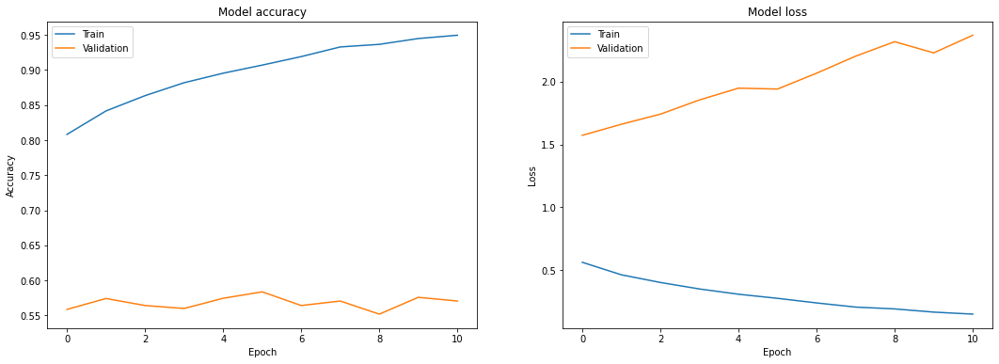

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(18, 6))
# Plot training & validation accuracy values
axes[0].plot(history.history['accuracy'])
axes[0].plot(history.history['val_accuracy'])
axes[0].set_title('Model accuracy')
axes[0].set_ylabel('Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
axes[1].plot(history.history['loss'])
axes[1].plot(history.history['val_loss'])
axes[1].set_title('Model loss')
axes[1].set_ylabel('Loss')
axes[1].set_xlabel('Epoch')
axes[1].legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
test_true = np.argmax(test_Y, axis=1)
test_pred = np.argmax(model.predict(x_test_input), axis=1)
print("CNN Model Accuracy on test set: {:.4f}".format(accuracy_score(test_true, test_pred)))

CNN Model Accuracy on test set: 0.5631


### With Data Augmentation

In [ ]:
history=model.fit(data_generator.flow(x_train_input, train_Y, batch_size),validation_data=(x_val_input, val_Y),epochs = 50, batch_size=batch_size, verbose = 1,callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

Epoch 1/50
449/449 [==============================] - 79s 104ms/step - loss: 1.5465 - accuracy: 0.4008 - val_loss: 2.2515 - val_accuracy: 0.3522
Epoch 2/50
449/449 [==============================] - 44s 99ms/step - loss: 1.4054 - accuracy: 0.4624 - val_loss: 1.3613 - val_accuracy: 0.4879
Epoch 3/50
449/449 [==============================] - 45s 99ms/step - loss: 1.3537 - accuracy: 0.4823 - val_loss: 1.6938 - val_accuracy: 0.4157
Epoch 4/50
449/449 [==============================] - 44s 99ms/step - loss: 1.3266 - accuracy: 0.4934 - val_loss: 1.6008 - val_accuracy: 0.4447
Epoch 5/50
449/449 [==============================] - 44s 98ms/step - loss: 1.2969 - accuracy: 0.5042 - val_loss: 1.7540 - val_accuracy: 0.3831
Epoch 6/50
449/449 [==============================] - 44s 97ms/step - loss: 1.2755 - accuracy: 0.5151 - val_loss: 1.3098 - val_accuracy: 0.5046
Epoch 7/50
449/449 [==============================] - 44s 97ms/step - loss: 1.2585 - accuracy: 0.5185 - val_loss: 1.2731 - val_accuracy

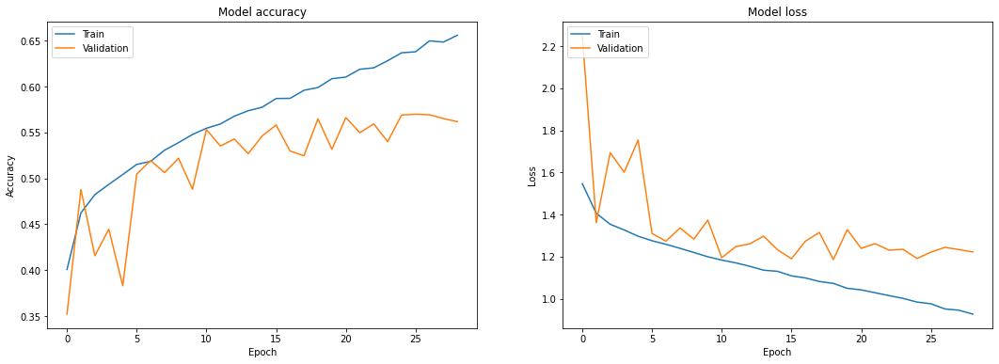

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(18, 6))
# Plot training & validation accuracy values
axes[0].plot(history.history['accuracy'])
axes[0].plot(history.history['val_accuracy'])
axes[0].set_title('Model accuracy')
axes[0].set_ylabel('Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
axes[1].plot(history.history['loss'])
axes[1].plot(history.history['val_loss'])
axes[1].set_title('Model loss')
axes[1].set_ylabel('Loss')
axes[1].set_xlabel('Epoch')
axes[1].legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
test_true = np.argmax(test_Y, axis=1)
test_pred = np.argmax(model.predict(x_test_input), axis=1)
print("CNN Model Accuracy on test set: {:.4f}".format(accuracy_score(test_true, test_pred)))

CNN Model Accuracy on test set: 0.5848


### VGG19
### Without Data Augmentation

In [ ]:
base_model_2 = tf.keras.applications.VGG19(input_shape=(48,48,3),include_top=False,weights="imagenet")

80150528/80134624 [==============================] - 1s 0us/step


In [ ]:
model=Sequential()
model.add(base_model_2)
model.add(Flatten())

#dense 1
model.add(Dense(2*2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 2
model.add(Dense(2*2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#dense 3
model.add(Dense(2*num_features))
model.add(BatchNormalization())
model.add(Activation('relu'))

#output layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', 
              optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-7), 
              metrics=['accuracy'])

In [ ]:
history=model.fit(x_train_input, train_Y,validation_data=(x_val_input, val_Y),epochs = 50, batch_size=batch_size, verbose = 1,callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

Epoch 1/50
449/449 [==============================] - 39s 83ms/step - loss: 1.2423 - accuracy: 0.5374 - val_loss: 1.3415 - val_accuracy: 0.5026
Epoch 2/50
449/449 [==============================] - 38s 84ms/step - loss: 1.1656 - accuracy: 0.5660 - val_loss: 1.3916 - val_accuracy: 0.4851
Epoch 3/50
449/449 [==============================] - 38s 85ms/step - loss: 1.1174 - accuracy: 0.5873 - val_loss: 1.3312 - val_accuracy: 0.5124
Epoch 4/50
449/449 [==============================] - 40s 89ms/step - loss: 1.0690 - accuracy: 0.6072 - val_loss: 1.5684 - val_accuracy: 0.4728
Epoch 5/50
449/449 [==============================] - 38s 85ms/step - loss: 1.0174 - accuracy: 0.6261 - val_loss: 1.4118 - val_accuracy: 0.5141
Epoch 6/50
449/449 [==============================] - 38s 85ms/step - loss: 0.9631 - accuracy: 0.6499 - val_loss: 1.3837 - val_accuracy: 0.5261
Epoch 7/50
449/449 [==============================] - 38s 85ms/step - loss: 0.9006 - accuracy: 0.6729 - val_loss: 1.4496 - val_accuracy:

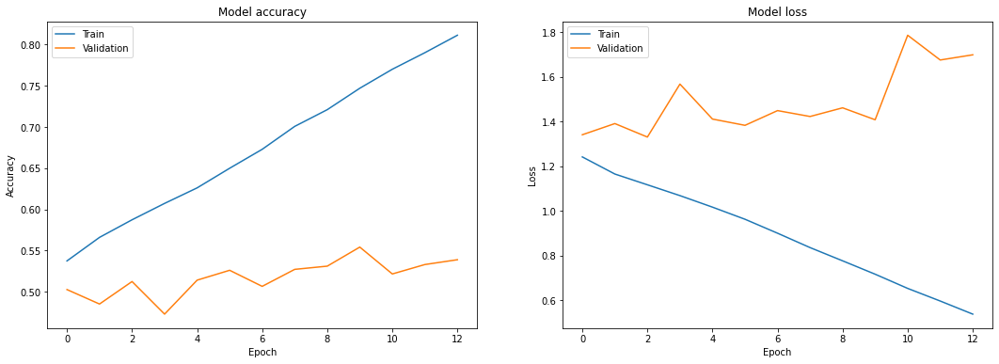

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(18, 6))
# Plot training & validation accuracy values
axes[0].plot(history.history['accuracy'])
axes[0].plot(history.history['val_accuracy'])
axes[0].set_title('Model accuracy')
axes[0].set_ylabel('Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
axes[1].plot(history.history['loss'])
axes[1].plot(history.history['val_loss'])
axes[1].set_title('Model loss')
axes[1].set_ylabel('Loss')
axes[1].set_xlabel('Epoch')
axes[1].legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
test_true = np.argmax(test_Y, axis=1)
test_pred = np.argmax(model.predict(x_test_input), axis=1)
print("CNN Model Accuracy on test set: {:.4f}".format(accuracy_score(test_true, test_pred)))

CNN Model Accuracy on test set: 0.5166


### With Data Augmentation

In [ ]:
history=model.fit(data_generator.flow(x_train_input, train_Y, batch_size),validation_data=(x_val_input, val_Y),epochs = 50, batch_size=batch_size, verbose = 1,callbacks=[
                ModelCheckpoint(filepath=path_model), es]
            )

Epoch 1/50
449/449 [==============================] - 79s 169ms/step - loss: 1.7945 - accuracy: 0.2566 - val_loss: 3.4252 - val_accuracy: 0.1691
Epoch 2/50
449/449 [==============================] - 75s 167ms/step - loss: 1.6928 - accuracy: 0.2999 - val_loss: 2.0910 - val_accuracy: 0.2120
Epoch 3/50
449/449 [==============================] - 75s 167ms/step - loss: 1.5958 - accuracy: 0.3517 - val_loss: 1.5478 - val_accuracy: 0.4143
Epoch 4/50
449/449 [==============================] - 78s 174ms/step - loss: 1.4376 - accuracy: 0.4313 - val_loss: 1.4864 - val_accuracy: 0.4082
Epoch 5/50
449/449 [==============================] - 75s 167ms/step - loss: 1.3714 - accuracy: 0.4555 - val_loss: 1.3845 - val_accuracy: 0.4634
Epoch 6/50
449/449 [==============================] - 75s 168ms/step - loss: 1.3233 - accuracy: 0.4795 - val_loss: 1.4016 - val_accuracy: 0.4466
Epoch 7/50
449/449 [==============================] - 75s 168ms/step - loss: 1.2910 - accuracy: 0.4920 - val_loss: 1.2914 - val_ac

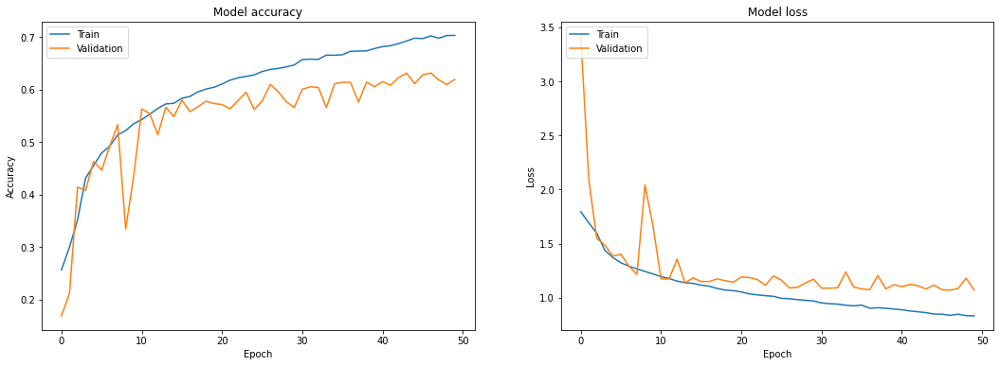

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(18, 6))
# Plot training & validation accuracy values
axes[0].plot(history.history['accuracy'])
axes[0].plot(history.history['val_accuracy'])
axes[0].set_title('Model accuracy')
axes[0].set_ylabel('Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
axes[1].plot(history.history['loss'])
axes[1].plot(history.history['val_loss'])
axes[1].set_title('Model loss')
axes[1].set_ylabel('Loss')
axes[1].set_xlabel('Epoch')
axes[1].legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
test_true = np.argmax(test_Y, axis=1)
test_pred = np.argmax(model.predict(x_test_input), axis=1)
print("CNN Model Accuracy on test set: {:.4f}".format(accuracy_score(test_true, test_pred)))

CNN Model Accuracy on test set: 0.6358


## ResNet Models (18, 50, 152)

### ResNet50 (With Data Augmentation)

##### i. Data Preprocessing

In [ ]:
def load_faces_emotions(data):
    
    image_size=(48,48)
    data = (data[data['pixels'].notnull()])
    pixels = data['pixels'].tolist()
    width, height = 48, 48
    faces = []
    
    for pixel_sequence in pixels:
        face = [int(pixel) for pixel in pixel_sequence.split(' ')]
        face = np.asarray(face).reshape(width, height)
        face = cv2.resize(face.astype('uint8'),image_size)
        faces.append(face.astype('float32'))
        
    faces = np.asarray(faces)
    faces = np.expand_dims(faces, -1)
    emotions = (data['emotion'])
    
    return faces, emotions

In [ ]:
def normalize_images(x, v2=True):
    
    x = x.astype('float32')
    x = x / 255.0
    
    if v2:
        
        x = x - 0.5
        x = x * 2.0
        
    return x

In [ ]:
faces, emotions = load_faces_emotions(fer_data)
faces = normalize_images(faces)
X_train, X_test, y_train, y_test = train_test_split(faces, emotions, test_size=0.2,shuffle=True)

##### ii. Data Augmentation

In [ ]:
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        shear_range = 10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)

##### iii. Model Building

In [ ]:
def identity_block(X, f, filters, stage, block):
    
    # defining name basis
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    
    # Retrieve Filters
    F1, F2, F3 = filters
    
    # Save the input value. You'll need this later to add back to the main path. 
    X_shortcut = X
    
    # First component of main path
    X = Conv2D(filters = F1, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2a', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2a')(X)
    X = Activation('relu')(X)
    
   
    # Second component of main path
    X = Conv2D(filters = F2, kernel_size = (f, f), strides = (1,1), padding = 'same', name = conv_name_base + '2b', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    # Third component of main path 
    X = Conv2D(filters = F3, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2c', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2c')(X)

    # Final step: Add shortcut value to main path, and pass it through a RELU activation 
    X = Add()([X_shortcut,X])
    X = Activation("relu")(X)
        
    return X

In [ ]:
def convolutional_block(X, f, filters, stage, block, s = 2):
    
    # defining name basis
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    
    # Retrieve Filters
    F1, F2, F3 = filters
    
    # Save the input value
    X_shortcut = X


    # First component of main path 
    X = Conv2D(F1, (1, 1), strides = (s,s), name = conv_name_base + '2a',padding = 'valid', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2a')(X)
    X = Activation('relu')(X)
    
    # Second component of main path 
    X = Conv2D(F2, (f, f), strides = (1,1), name = conv_name_base + '2b',padding = 'same', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    # Third component of main path 
    X = Conv2D(F3, (1, 1), strides = (1,1), name = conv_name_base + '2c',padding = 'valid', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2c')(X)

    # Shortcut path 
    X_shortcut = Conv2D(F3, (1, 1), strides = (s,s), name = conv_name_base + '1',padding = 'valid', kernel_initializer = glorot_uniform(seed=0))(X_shortcut)
    X_shortcut = BatchNormalization(axis = 3, name = bn_name_base + '1')(X_shortcut)

    # Add shortcut value to main path
    X = Add()([X_shortcut,X])
    X = Activation("relu")(X)
        
    return X

In [ ]:
def ResNet50(input_shape = (48,48,1), classes = 7):
    
    X_input = Input(input_shape)
    X = X_input
    
    # Stage 1
    X = Conv2D(8, (3, 3), strides = (1, 1), name = 'conv1', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = 'bn_conv1')(X)
    X = Activation('relu')(X)


    # Stage 2
    X = convolutional_block(X, f = 3, filters = [32, 32, 128], stage = 2, block='a', s = 1)
    X = identity_block(X, 3, [32, 32, 128], stage=2, block='b')
    X = identity_block(X, 3, [32, 32, 128], stage=2, block='c')


    # Stage 3 
    X = convolutional_block(X, f = 3, filters = [64,64,256], stage = 3, block='a', s = 2)
    X = identity_block(X, 3, [64,64,256], stage=3, block='b')
    X = identity_block(X, 3, [64,64,256], stage=3, block='c')
    X = identity_block(X, 3, [64,64,256], stage=3, block='d')

    # Stage 4 
    X = convolutional_block(X, f = 3, filters = [128, 128, 512], stage = 4, block='a', s = 2)
    X = identity_block(X, 3, [128, 128, 512], stage=4, block='b')
    X = identity_block(X, 3, [128, 128, 512], stage=4, block='c')
    X = identity_block(X, 3, [128, 128, 512], stage=4, block='d')
    X = identity_block(X, 3, [128, 128, 512], stage=4, block='e')
    X = identity_block(X, 3, [128, 128, 512], stage=4, block='f')

    # Stage 5 
    X = convolutional_block(X, f = 3, filters = [256, 256, 1024], stage = 5, block='a', s = 2)
    X = identity_block(X, 3, [256, 256, 1024], stage=5, block='b')
    X = identity_block(X, 3, [256, 256, 1024], stage=5, block='c')

    # AVGPOOL . 
    X = AveragePooling2D((2,2), name='avg_pool')(X)
    
    # output layer
    X = Flatten()(X)
    X = Dense(512, activation = 'relu', name='fc1024' , kernel_initializer = glorot_uniform(seed=0))(X)
    X = Dense(classes, activation='softmax', name='fc' + str(classes), kernel_initializer = glorot_uniform(seed=0))(X)
    
    
    # Create model
    model = Model(inputs = X_input, outputs = X, name='Net50')
    

    return model

In [ ]:
model = ResNet50(input_shape = (48, 48, 1), classes = 7)

In [ ]:
model.summary()

Model: "Net50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 48, 48, 1)]  0           []                               
                                                                                                  
 conv1 (Conv2D)                 (None, 46, 46, 8)    80          ['input_1[0][0]']                
                                                                                                  
 bn_conv1 (BatchNormalization)  (None, 46, 46, 8)    32          ['conv1[0][0]']                  
                                                                                                  
 activation (Activation)        (None, 46, 46, 8)    0           ['bn_conv1[0][0]']               
                                                                                              

##### iv. Model Training

In [ ]:
os.mkdir("./Res_net_model")

* To deal with class imbalance

In [ ]:
# to deal with class imbalance
def create_class_weights(labels_dict, mu=0.15):
    
    total = np.sum(list(labels_dict.values()))
    keys = labels_dict.keys()
    class_weight = dict()
    
    for key in keys:
        score = math.log(mu*total/float(labels_dict[key]))
        class_weight[key] = score if score > 1.0 else 1.0
    
    return class_weight

In [ ]:
class_counts = fer_data['emotion'].value_counts().to_dict()
class_weights = create_class_weights(class_counts)
print(class_weights)

{3: 1.0, 6: 1.0, 4: 1.0, 2: 1.0, 0: 1.0, 5: 1.0, 1: 2.2865616045966743}


In [ ]:
# parameters
batch_size = 32
num_epochs = 50
input_shape = (48, 48, 3)
verbose = 1
num_classes = 7
patience = 25
l2_regularization=0.01

* Callbacks definition

In [ ]:
base_path = './Res_net_model/'
log_file_path = base_path + '_emotion_training.log'
csv_logger = CSVLogger(log_file_path, append=False)
early_stop = EarlyStopping('val_loss', patience=patience)
reduce_lr = ReduceLROnPlateau('val_loss', factor=0.1, patience=int(patience/2), verbose=1)
trained_models_path = base_path + '_mini_XCEPTION'
model_names = trained_models_path + '.{epoch:02d}-{val_accuracy:.2f}.hdf5'
model_checkpoint = ModelCheckpoint(model_names, 'val_loss', verbose=1,save_best_only=True)
callbacks = [model_checkpoint, csv_logger, early_stop, reduce_lr]

*  Model Compilation

In [ ]:
optimizer = Adam(learning_rate=0.005, beta_1=0.9, beta_2=0.999, epsilon=1e-7)
model.compile(optimizer= optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

* Model Training

In [ ]:
history = model.fit(data_generator.flow(X_train, y_train,),
                        steps_per_epoch=len(X_train) / batch_size,
                        epochs=num_epochs, verbose=verbose, callbacks=callbacks,
                        validation_data=(X_test,y_test),
                        class_weight=class_weights)

Epoch 1/150
898/897 [==============================] - ETA: 0s - loss: 3.0381 - accuracy: 0.2542
Epoch 00001: val_loss improved from inf to 1.75009, saving model to ./Res_net_model/_mini_XCEPTION.01-0.27.hdf5
898/897 [==============================] - 63s 70ms/step - loss: 3.0381 - accuracy: 0.2542 - val_loss: 1.7501 - val_accuracy: 0.2710
Epoch 2/150
898/897 [==============================] - ETA: 0s - loss: 1.8026 - accuracy: 0.2849
Epoch 00002: val_loss improved from 1.75009 to 1.68258, saving model to ./Res_net_model/_mini_XCEPTION.02-0.32.hdf5
898/897 [==============================] - 63s 70ms/step - loss: 1.8026 - accuracy: 0.2849 - val_loss: 1.6826 - val_accuracy: 0.3220
Epoch 3/150
898/897 [==============================] - ETA: 0s - loss: 1.7275 - accuracy: 0.3369
Epoch 00003: val_loss improved from 1.68258 to 1.59200, saving model to ./Res_net_model/_mini_XCEPTION.03-0.40.hdf5
898/897 [==============================] - 63s 70ms/step - loss: 1.7275 - accuracy: 0.3369 - val_lo

##### v. Model Evaluation

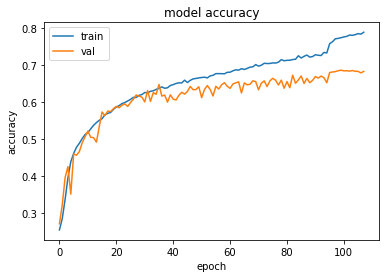

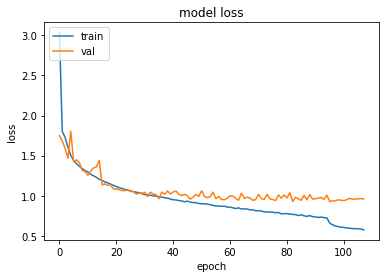

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
# Train Loss
trainloss = model.evaluate(X_train, y_train) 
print("Train Loss " + str(trainloss[0]))
print("Train Acc: " + str(trainloss[1]))

# Test Loss
testloss = model.evaluate(X_test, y_test) 
print("Test Loss " + str(testloss[0]))
print("Test Acc: " + str(testloss[1]))

898/898 [==============================] - 15s 17ms/step - loss: 0.5499 - accuracy: 0.7962
Train Loss 0.5499334931373596
Train Acc: 0.7962311506271362
225/225 [==============================] - 4s 17ms/step - loss: 0.9596 - accuracy: 0.6835
Test Loss 0.9596276879310608
Test Acc: 0.6834772825241089


### ResNet50 (Without Data Augmentation)

In [ ]:
history = model.fit(X_train, y_train,
                    steps_per_epoch=len(X_train) / batch_size,
                    epochs=num_epochs, verbose=verbose, callbacks=callbacks,
                    validation_data=(X_test,y_test),
                    class_weight=class_weights)

2021-11-17 03:05:18.798802: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/150


2021-11-17 03:05:24.057281: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


897/897 [==============================] - 69s 64ms/step - loss: 3.1679 - accuracy: 0.2749 - val_loss: 1.7466 - val_accuracy: 0.2870

Epoch 00001: val_loss improved from inf to 1.74660, saving model to ./Res_net_model/_mini_XCEPTION.01-0.29.hdf5


/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 2/150
897/897 [==============================] - 55s 62ms/step - loss: 1.7045 - accuracy: 0.3462 - val_loss: 1.5229 - val_accuracy: 0.4068

Epoch 00002: val_loss improved from 1.74660 to 1.52295, saving model to ./Res_net_model/_mini_XCEPTION.02-0.41.hdf5
Epoch 3/150
897/897 [==============================] - 56s 62ms/step - loss: 1.5782 - accuracy: 0.4053 - val_loss: 1.4412 - val_accuracy: 0.4404

Epoch 00003: val_loss improved from 1.52295 to 1.44122, saving model to ./Res_net_model/_mini_XCEPTION.03-0.44.hdf5
Epoch 4/150
897/897 [==============================] - 55s 61ms/step - loss: 1.4677 - accuracy: 0.4516 - val_loss: 1.4734 - val_accuracy: 0.4074

Epoch 00004: val_loss did not improve from 1.44122
Epoch 5/150
897/897 [==============================] - 55s 62ms/step - loss: 1.6049 - accuracy: 0.3943 - val_loss: 1.7563 - val_accuracy: 0.2828

Epoch 00005: val_loss did not improve from 1.44122
Epoch 6/150
897/897 [==============================] - 55s 62ms/step - loss: 1.450

#### Model Evaluation

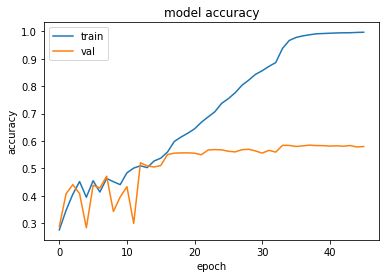

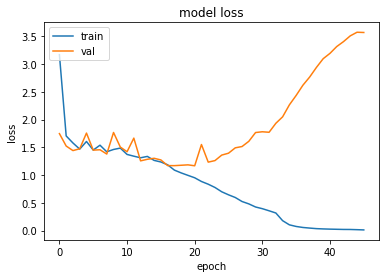

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
# Train Loss
trainloss = model.evaluate(X_train, y_train) 
print("Train Loss " + str(trainloss[0]))
print("Train Acc: " + str(trainloss[1]))

# Test Loss
testloss = model.evaluate(X_test, y_test) 
print("Test Loss " + str(testloss[0]))
print("Test Acc: " + str(testloss[1]))

898/898 [==============================] - 16s 18ms/step - loss: 0.0091 - accuracy: 0.9976
Train Loss 0.009136812761425972
Train Acc: 0.9975965619087219
225/225 [==============================] - 4s 17ms/step - loss: 3.5671 - accuracy: 0.5795
Test Loss 3.5670878887176514
Test Acc: 0.5795485973358154


### ResNet18 (With Data Augmentation)

* Identity Block

In [ ]:
def identity_block(X, f, filters, stage, block):
    
    # defining name basis
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    
    # Retrieve Filters
    F1, F2 = filters
    
    # Save the input value. You'll need this later to add back to the main path. 
    X_shortcut = X
    
    # First component of main path
    X = Conv2D(filters = F1, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2a', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2a')(X)
    X = Activation('relu')(X)
    
   
    # Second component of main path
    X = Conv2D(filters = F2, kernel_size = (f, f), strides = (1,1), padding = 'same', name = conv_name_base + '2b', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    # Final step: Add shortcut value to main path, and pass it through a RELU activation 
    X = Add()([X_shortcut,X])
    X = Activation("relu")(X)
        
    return X

* Convolutional Block

In [ ]:
def convolutional_block(X, f, filters, stage, block, s = 2):
    
    # defining name basis
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    
    # Retrieve Filters
    F1, F2 = filters
    
    # Save the input value
    X_shortcut = X


    # First component of main path 
    X = Conv2D(F1, (1, 1), strides = (s,s), name = conv_name_base + '2a',padding = 'valid', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2a')(X)
    X = Activation('relu')(X)
    
    # Second component of main path 
    X = Conv2D(F2, (f, f), strides = (1,1), name = conv_name_base + '2b',padding = 'same', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    # Shortcut path 
    X_shortcut = Conv2D(F2, (1, 1), strides = (s,s), name = conv_name_base + '1',padding = 'valid', kernel_initializer = glorot_uniform(seed=0))(X_shortcut)
    X_shortcut = BatchNormalization(axis = 3, name = bn_name_base + '1')(X_shortcut)

    # Add shortcut value to main path
    X = Add()([X_shortcut,X])
    X = Activation("relu")(X)
        
    return X

In [ ]:
def ResNet18(input_shape = (48,48,1), classes = 7):
    
    X_input = Input(input_shape)
    X = X_input
    
    # Stage 1
    X = Conv2D(8, (3, 3), strides = (1, 1), name = 'conv1', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = 'bn_conv1')(X)
    X = Activation('relu')(X)


    # Stage 2
    X = convolutional_block(X, f = 3, filters = [64, 64], stage = 2, block='a', s = 1)
    X = identity_block(X, 3, [64, 64], stage=2, block='b')

    # Stage 3 
    X = convolutional_block(X, f = 3, filters = [128, 128], stage = 3, block='a', s = 2)
    X = identity_block(X, 3, [128, 128], stage=3, block='b')
    

    # Stage 4 
    X = convolutional_block(X, f = 3, filters = [256, 256], stage = 4, block='a', s = 2)
    X = identity_block(X, 3, [256, 256], stage=4, block='b')

    # Stage 5 
    X = convolutional_block(X, f = 3, filters = [512, 512], stage = 5, block='a', s = 2)
    X = identity_block(X, 3, [512, 512], stage=5, block='b')

    # AVGPOOL . 
    X = AveragePooling2D((2,2), name='avg_pool')(X)
    
    # output layer
    X = Flatten()(X)
    X = Dense(512, activation = 'relu', name='fc1024' , kernel_initializer = glorot_uniform(seed=0))(X)
    X = Dense(classes, activation='softmax', name='fc' + str(classes), kernel_initializer = glorot_uniform(seed=0))(X)
    
    
    # Create model
    model = Model(inputs = X_input, outputs = X, name='Net18')
    

    return model

In [ ]:
model = ResNet18(input_shape = (48, 48, 1), classes = 7)

In [ ]:
model.summary()

Model: "Net18"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 48, 48, 1)]  0                                            
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 46, 46, 8)    80          input_1[0][0]                    
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 46, 46, 8)    32          conv1[0][0]                      
__________________________________________________________________________________________________
activation (Activation)         (None, 46, 46, 8)    0           bn_conv1[0][0]                   
______________________________________________________________________________________________

#### Model Training

In [ ]:
os.mkdir("./Res_net_18")

In [ ]:
base_path = './Res_net_18/'
log_file_path = base_path + '_emotion_training.log'
csv_logger = CSVLogger(log_file_path, append=False)
early_stop = EarlyStopping('val_loss', patience=patience)
reduce_lr = ReduceLROnPlateau('val_loss', factor=0.1, patience=int(patience/2), verbose=1)
trained_models_path = base_path + '_mini_XCEPTION'
model_names = trained_models_path + '.{epoch:02d}-{val_accuracy:.2f}.hdf5'
model_checkpoint = ModelCheckpoint(model_names, 'val_loss', verbose=1,save_best_only=True)
callbacks = [model_checkpoint, csv_logger, early_stop, reduce_lr]

#### Model Compilation

In [ ]:
optimizer = Adam(lr=0.005, beta_1=0.9, beta_2=0.999, epsilon=1e-7)
model.compile(optimizer= optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

#### Training

In [ ]:
history = model.fit(data_generator.flow(X_train, y_train,),
                        steps_per_epoch=len(X_train) / batch_size,
                        epochs=num_epochs, verbose=verbose, callbacks=callbacks,
                        validation_data=(X_test,y_test),
                        class_weight=class_weights)

Epoch 1/150
897/897 [============================>.] - ETA: 0s - loss: 2.5234 - accuracy: 0.2592
Epoch 00001: val_loss improved from inf to 1.71697, saving model to ./Res_net_18/_mini_XCEPTION.01-0.31.hdf5
898/897 [==============================] - 33s 37ms/step - loss: 2.5226 - accuracy: 0.2593 - val_loss: 1.7170 - val_accuracy: 0.3076
Epoch 2/150
898/897 [==============================] - ETA: 0s - loss: 1.7536 - accuracy: 0.3238
Epoch 00002: val_loss improved from 1.71697 to 1.64850, saving model to ./Res_net_18/_mini_XCEPTION.02-0.34.hdf5
898/897 [==============================] - 33s 36ms/step - loss: 1.7536 - accuracy: 0.3238 - val_loss: 1.6485 - val_accuracy: 0.3423
Epoch 3/150
898/897 [==============================] - ETA: 0s - loss: 1.6272 - accuracy: 0.3845
Epoch 00003: val_loss improved from 1.64850 to 1.63307, saving model to ./Res_net_18/_mini_XCEPTION.03-0.36.hdf5
898/897 [==============================] - 32s 36ms/step - loss: 1.6272 - accuracy: 0.3845 - val_loss: 1.633

#### Model Evaluation

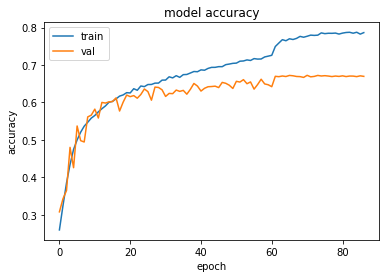

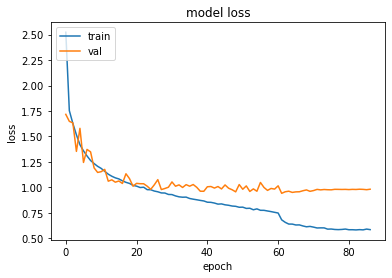

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
# Train Loss
trainloss = model.evaluate(X_train, y_train) 
print("Train Loss " + str(trainloss[0]))
print("Train Acc: " + str(trainloss[1]))

# Test Loss
testloss = model.evaluate(X_test, y_test) 
print("Test Loss " + str(testloss[0]))
print("Test Acc: " + str(testloss[1]))

898/898 [==============================] - 9s 10ms/step - loss: 0.5596 - accuracy: 0.7985
Train Loss 0.5596066117286682
Train Acc: 0.798530101776123
225/225 [==============================] - 2s 10ms/step - loss: 0.9825 - accuracy: 0.6697
Test Loss 0.982541024684906
Test Acc: 0.6696851253509521


### ResNet18 (Without Data Augmentation)

In [ ]:
history = model.fit(X_train, y_train,
                    steps_per_epoch=len(X_train) / batch_size,
                    epochs=num_epochs, verbose=verbose, callbacks=callbacks,
                    validation_data=(X_test,y_test),
                    class_weight=class_weights)

2021-11-17 07:44:52.721178: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/150


2021-11-17 07:44:55.562912: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


897/897 [==============================] - 40s 35ms/step - loss: 2.7141 - accuracy: 0.2571 - val_loss: 1.6987 - val_accuracy: 0.3115

Epoch 00001: val_loss improved from inf to 1.69869, saving model to ./Res_net_18/_mini_XCEPTION.01-0.31.hdf5


/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 2/150
897/897 [==============================] - 30s 34ms/step - loss: 1.6525 - accuracy: 0.3798 - val_loss: 1.6280 - val_accuracy: 0.3661

Epoch 00002: val_loss improved from 1.69869 to 1.62803, saving model to ./Res_net_18/_mini_XCEPTION.02-0.37.hdf5
Epoch 3/150
897/897 [==============================] - 30s 34ms/step - loss: 1.4654 - accuracy: 0.4538 - val_loss: 1.3707 - val_accuracy: 0.4670

Epoch 00003: val_loss improved from 1.62803 to 1.37071, saving model to ./Res_net_18/_mini_XCEPTION.03-0.47.hdf5
Epoch 4/150
897/897 [==============================] - 30s 33ms/step - loss: 1.3430 - accuracy: 0.4991 - val_loss: 1.2809 - val_accuracy: 0.4974

Epoch 00004: val_loss improved from 1.37071 to 1.28086, saving model to ./Res_net_18/_mini_XCEPTION.04-0.50.hdf5
Epoch 5/150
897/897 [==============================] - 30s 34ms/step - loss: 1.2575 - accuracy: 0.5309 - val_loss: 1.3548 - val_accuracy: 0.4824

Epoch 00005: val_loss did not improve from 1.28086
Epoch 6/150
897/897 [=====

#### Model Evaluation

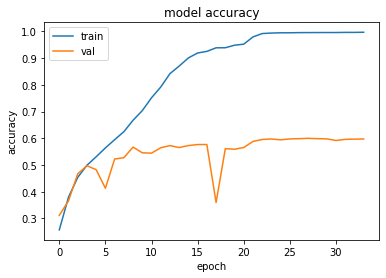

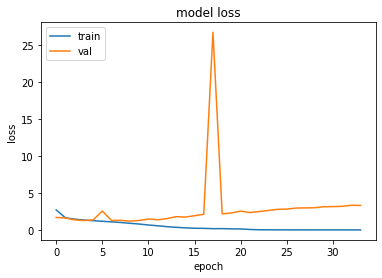

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
# Train Loss
trainloss = model.evaluate(X_train, y_train) 
print("Train Loss " + str(trainloss[0]))
print("Train Acc: " + str(trainloss[1]))

# Test Loss
testloss = model.evaluate(X_test, y_test) 
print("Test Loss " + str(testloss[0]))
print("Test Acc: " + str(testloss[1]))

898/898 [==============================] - 9s 10ms/step - loss: 0.0094 - accuracy: 0.9969
Train Loss 0.00937111210078001
Train Acc: 0.9969347715377808
225/225 [==============================] - 2s 10ms/step - loss: 3.3257 - accuracy: 0.5974
Test Loss 3.3256754875183105
Test Acc: 0.5973808765411377


### ResNet152 (Without Data Augmentation)

* Identity Block

In [ ]:
def identity_block(X, f, filters, stage, block):
    
    # defining name basis
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    
    # Retrieve Filters
    F1, F2, F3 = filters
    
    # Save the input value. You'll need this later to add back to the main path. 
    X_shortcut = X
    
    # First component of main path
    X = Conv2D(filters = F1, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2a', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2a')(X)
    X = Activation('relu')(X)
    
   
    # Second component of main path
    X = Conv2D(filters = F2, kernel_size = (f, f), strides = (1,1), padding = 'same', name = conv_name_base + '2b', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    # Third component of main path 
    X = Conv2D(filters = F3, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2c', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2c')(X)

    # Final step: Add shortcut value to main path, and pass it through a RELU activation 
    X = Add()([X_shortcut,X])
    X = Activation("relu")(X)
        
    return X

* Convolutional Block

In [ ]:
def convolutional_block(X, f, filters, stage, block, s = 2):
    
    # defining name basis
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    
    # Retrieve Filters
    F1, F2, F3 = filters
    
    # Save the input value
    X_shortcut = X


    # First component of main path 
    X = Conv2D(F1, (1, 1), strides = (s,s), name = conv_name_base + '2a',padding = 'valid', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2a')(X)
    X = Activation('relu')(X)
    
    # Second component of main path 
    X = Conv2D(F2, (f, f), strides = (1,1), name = conv_name_base + '2b',padding = 'same', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    # Third component of main path 
    X = Conv2D(F3, (1, 1), strides = (1,1), name = conv_name_base + '2c',padding = 'valid', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2c')(X)

    # Shortcut path 
    X_shortcut = Conv2D(F3, (1, 1), strides = (s,s), name = conv_name_base + '1',padding = 'valid', kernel_initializer = glorot_uniform(seed=0))(X_shortcut)
    X_shortcut = BatchNormalization(axis = 3, name = bn_name_base + '1')(X_shortcut)

    # Add shortcut value to main path
    X = Add()([X_shortcut,X])
    X = Activation("relu")(X)
        
    return X

In [ ]:
def ResNet152(input_shape = (48,48,1), classes = 7):
    
    X_input = Input(input_shape)
    X = X_input
    
    # Stage 1
    X = Conv2D(8, (3, 3), strides = (1, 1), name = 'conv1', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = 'bn_conv1')(X)
    X = Activation('relu')(X)

    # Stage 2
    X = convolutional_block(X, f = 3, filters = [64,64,256], stage = 2, block='a', s = 2)
    X = identity_block(X, 3, [64,64,256], stage=2, block='b')
    X = identity_block(X, 3, [64,64,256], stage=2, block='c')
    X = identity_block(X, 3, [64,64,256], stage=2, block='d')

    # Stage 3 
    X = convolutional_block(X, f = 3, filters = [128, 128, 512], stage = 3, block='a', s = 2)
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='b')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='c')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='d')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='e')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='f')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='g')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='h')

    # Stage 4 
    X = convolutional_block(X, 3, filters = [256, 256, 1024], stage = 4, block='a', s = 2)
    for i in range(1, 36):
      X = identity_block(X, 3, filters = [256, 256, 1024], stage = 4, block='b'+str(i))
    
    # Stage 5
    X = convolutional_block(X, 3, [512, 512, 2048], stage=5, block='a')
    X = identity_block(X,3, [512, 512, 2048], stage=5, block='b')
    X = identity_block(X,3, [512, 512, 2048], stage=5, block='c')

    # AVGPOOL . 
    X = AveragePooling2D((2,2), name='avg_pool')(X)
    
    # output layer
    X = Flatten()(X)
    X = Dense(512, activation = 'relu', name='fc512' , kernel_initializer = glorot_uniform(seed=0))(X)
    X = Dense(classes, activation='softmax', name='fc' + str(classes), kernel_initializer = glorot_uniform(seed=0))(X)
    
    
    # Create model
    model = Model(inputs = X_input, outputs = X, name='Net152')
    

    return model

In [ ]:
model = ResNet152(input_shape = (48, 48, 1), classes = 7)

2021-11-18 01:02:13.506397: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-11-18 01:02:13.612145: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-11-18 01:02:13.613238: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-11-18 01:02:13.615050: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

In [ ]:
model.summary()

Model: "Net152"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 48, 48, 1)]  0                                            
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 46, 46, 8)    80          input_1[0][0]                    
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 46, 46, 8)    32          conv1[0][0]                      
__________________________________________________________________________________________________
activation (Activation)         (None, 46, 46, 8)    0           bn_conv1[0][0]                   
_____________________________________________________________________________________________

In [ ]:
os.mkdir("./Res_net152_model")

In [ ]:
base_path = './Res_net152_model/'
log_file_path = base_path + '_emotion_training.log'
csv_logger = CSVLogger(log_file_path, append=False)
early_stop = EarlyStopping('val_loss', patience=patience)
reduce_lr = ReduceLROnPlateau('val_loss', factor=0.1, patience=int(patience/2), verbose=1)
trained_models_path = base_path + '_mini_XCEPTION'
model_names = trained_models_path + '.{epoch:02d}-{val_accuracy:.2f}.hdf5'
model_checkpoint = ModelCheckpoint(model_names, 'val_loss', verbose=1,save_best_only=True)
callbacks = [model_checkpoint, csv_logger, early_stop, reduce_lr]

In [ ]:
optimizer = Adam(lr=0.005, beta_1=0.9, beta_2=0.999, epsilon=1e-7)
model.compile(optimizer= optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

/opt/conda/lib/python3.7/site-packages/keras/optimizer_v2/optimizer_v2.py:356: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [ ]:
history = model.fit(X_train, y_train,
                    steps_per_epoch=len(X_train) / batch_size,
                    epochs=num_epochs, verbose=verbose, callbacks=callbacks,
                    validation_data=(X_test,y_test),
                    class_weight=class_weights)

2021-11-18 01:04:08.560066: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/150


2021-11-18 01:04:23.801042: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


897/897 [==============================] - 159s 155ms/step - loss: 1.9554 - accuracy: 0.2499 - val_loss: 1.8182 - val_accuracy: 0.2537

Epoch 00001: val_loss improved from inf to 1.81817, saving model to ./Res_net152_model/_mini_XCEPTION.01-0.25.hdf5


/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 2/150
897/897 [==============================] - 135s 151ms/step - loss: 1.8828 - accuracy: 0.2523 - val_loss: 1.8292 - val_accuracy: 0.2484

Epoch 00002: val_loss did not improve from 1.81817
Epoch 3/150
897/897 [==============================] - 135s 151ms/step - loss: 1.8670 - accuracy: 0.2500 - val_loss: 1.8154 - val_accuracy: 0.2506

Epoch 00003: val_loss improved from 1.81817 to 1.81541, saving model to ./Res_net152_model/_mini_XCEPTION.03-0.25.hdf5
Epoch 4/150
897/897 [==============================] - 135s 150ms/step - loss: 1.8244 - accuracy: 0.2820 - val_loss: 1.8830 - val_accuracy: 0.2636

Epoch 00004: val_loss did not improve from 1.81541
Epoch 5/150
897/897 [==============================] - 135s 151ms/step - loss: 1.6888 - accuracy: 0.3537 - val_loss: 9.8955 - val_accuracy: 0.2396

Epoch 00005: val_loss did not improve from 1.81541
Epoch 6/150
897/897 [==============================] - 136s 152ms/step - loss: 1.5849 - accuracy: 0.3992 - val_loss: 2.4457 - val_accura

#### Model Evaluation

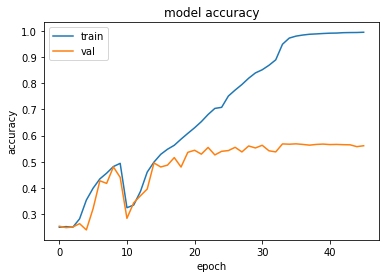

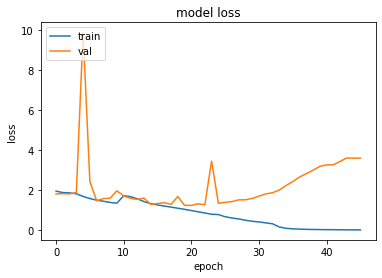

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
# Train Loss
trainloss = model.evaluate(X_train, y_train) 
print("Train Loss " + str(trainloss[0]))
print("Train Acc: " + str(trainloss[1]))

# Test Loss
testloss = model.evaluate(X_test, y_test) 
print("Test Loss " + str(testloss[0]))
print("Test Acc: " + str(testloss[1]))

898/898 [==============================] - 42s 46ms/step - loss: 0.1129 - accuracy: 0.9951
Train Loss 0.11293165385723114
Train Acc: 0.9951235055923462
225/225 [==============================] - 11s 47ms/step - loss: 3.6050 - accuracy: 0.5614
Test Loss 3.604973077774048
Test Acc: 0.561437726020813


### Inception (With Data Augmentation)

## Application: Caption generation
Input: Features of Image with additional Facial Expression
Output: Caption

#### Detect Faces

In [ ]:
face_cascade = cv2.CascadeClassifier(start_path+'face_detector.xml')

def detect_face(image):
    faces = face_cascade.detectMultiScale(image, 1.02, 4)
    if len(faces) >=1:
      return True
    else:
      return False

In [ ]:
def detect_emotion(photo, model, emotion_map):
  tags = []
  im = cv2.imread(photo)
  gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
  # if fer_data:
  if detect_face(im):
    resized = cv2.resize(gray, (48, 48), interpolation = cv2.INTER_AREA)
    resized = resized.reshape(-1,48, 48,1)/255.0
    predicted_emotion = emotion_map.get(np.argmax(model_fer.predict(resized)))
    tags.append(predicted_emotion)
    if predicted_emotion in ['Angry', 'Disgust', 'Sad', 'Fear']:
      tags.append('Negative')
    if predicted_emotion in ['Happy', 'Surprise']:
      tags.append('Positive')
    if len(tags)== 0:
      tags.append('Neutral')
    return tags

  else:
    tags.append('Neutral')
    return tags



In [ ]:
model_fer = load_model(start_path+'model_fer.h5')

In [ ]:
detect_emotion(start_path + '12-14-2020-tout.jpg', model_fer, emotion_map)

['Fear', 'Negative']

In [ ]:
detect_emotion(images_path+pic, model_fer, emotion_map)

['Neutral']

#### Caption Generation Model Training

 **Displaying image - caption** 

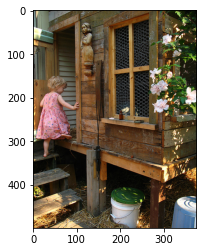

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

In [ ]:
pic = '1000268201_693b08cb0e.jpg'
x=plt.imread(images_path+pic)
plt.imshow(x)
plt.show()
descriptions['1000268201_693b08cb0e']

`to_vocabulary()` in Caption Generator.ipynb

In [ ]:
vocabulary = set()
for key in descriptions.keys():
        [vocabulary.update(d.split()) for d in descriptions[key]]
print('Original Vocabulary Size: %d' % len(vocabulary))

Original Vocabulary Size: 9630


`save_descriptions()` 

In [ ]:
lines = list()
for key, desc_list in descriptions.items():
    for desc in desc_list:
        lines.append(key + ' ' + desc)
new_descriptions = '\n'.join(lines)

`load_set()` 

In [ ]:
doc = open(train_images_path,'r').read()
dataset = list()
for line in doc.split('\n'):
    if len(line) > 1:
      identifier = line.split('.')[0]
      dataset.append(identifier)

train = set(dataset)

In [ ]:
img = glob.glob(images_path + '*.jpg')
train_images = set(open(train_images_path, 'r').read().strip().split('\n'))
train_img = []
for i in img: 
    if i[len(images_path):] in train_images:
        train_img.append(i)

test_images = set(open(test_images_path, 'r').read().strip().split('\n'))
test_img = []
for i in img: 
    if i[len(images_path):] in test_images: 
        test_img.append(i)

`load_descriptions` but with `startseq` and `endseq` being joined here

In [ ]:
train_descriptions = dict()
for line in new_descriptions.split('\n'):
    tokens = line.split()
    image_id, image_desc = tokens[0], tokens[1:]
    if image_id in train:
        if image_id not in train_descriptions:
            train_descriptions[image_id] = list()
        desc = 'startseq ' + ' '.join(image_desc) + ' endseq'
        train_descriptions[image_id].append(desc)

`save_descriptions()` takes in a dict containing mapping of identifiers to desc and ids, saves the mapping

In [ ]:
all_train_captions = []
for key, val in train_descriptions.items():
    for cap in val:
        all_train_captions.append(cap)

In [ ]:
word_count_threshold = 5
word_counts = {}
nsents = 0
for sent in all_train_captions:
    nsents += 1
    for w in sent.split(' '):
        word_counts[w] = word_counts.get(w, 0) + 1
vocab = [w for w in word_counts if word_counts[w] >= word_count_threshold]

print('Vocabulary = %d' % (len(vocab)))

Vocabulary = 2618


In [ ]:
ixtoword = {}
wordtoix = {}
ix = 1
for w in vocab:
    wordtoix[w] = ix
    ixtoword[ix] = w
    ix += 1

vocab_size = len(ixtoword) + 1


In [ ]:
all_desc = list()
for key in train_descriptions.keys():
    [all_desc.append(d) for d in train_descriptions[key]]
lines = all_desc
max_length = max(len(d.split()) for d in lines)

print('Description Length: %d' % max_length)

Description Length: 40


 **Glove Embedding** 

In [ ]:
embeddings_index = {} 
f = open(os.path.join(glove_path, 'glove.6B.200d.txt'), encoding="utf-8")
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs

In [ ]:
embedding_dim = 200
embedding_matrix = np.zeros((vocab_size, embedding_dim))
for word, i in wordtoix.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

 **Build the Model** 

In [ ]:
model = InceptionV3(weights='imagenet')

96124928/96112376 [==============================] - 1s 0us/step


In [ ]:
model_new = Model(model.input, model.layers[-2].output)

In [ ]:
def preprocess(image_path):
    img = image.load_img(image_path, target_size=(299, 299))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    return x

In [ ]:
# def encode(image):
#     image = preprocess(image) 
#     fea_vec = model_new.predict(image) 
#     fea_vec = np.reshape(fea_vec, fea_vec.shape[1])
#     return fea_vec

# encoding_train = {}
# for img in train_img:
#     encoding_train[img[len(images_path):]] = encode(img)
# train_features = encoding_train

# encoding_test = {}
# for img in test_img:
#     encoding_test[img[len(images_path):]] = encode(img)



In [ ]:
# a_file = open(start_path+"encoding_train.pkl", "wb")
# pickle.dump(train_features, a_file)
# a_file.close()

# b_file = open(start_path+"encoding_test.pkl", "wb")
# pickle.dump(encoding_test, b_file)
# b_file.close()

a_file = open(start_path+"encoding_train.pkl", "rb")
train_features = pickle.load(a_file)

b_file = open(start_path+"encoding_test.pkl", "rb")
encoding_test = pickle.load(b_file)


In [ ]:
inputs1 = Input(shape=(2048,))
fe1 = Dropout(0.5)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)

inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, embedding_dim, mask_zero=True)(inputs2)
se2 = Dropout(0.5)(se1)
se3 = LSTM(256)(se2)

decoder1 = add([fe2, se3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)

model = Model(inputs=[inputs1, inputs2], outputs=outputs)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 40)]         0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 2048)]       0           []                               
                                                                                                  
 embedding (Embedding)          (None, 40, 200)      523800      ['input_3[0][0]']                
                                                                                                  
 dropout (Dropout)              (None, 2048)         0           ['input_2[0][0]']                
                                                                                            

 **Train the Model** 

In [ ]:
model.layers[2].set_weights([embedding_matrix])
model.layers[2].trainable = False

# model.layers[3].set_weights([embedding_matrix_emotion])
# model.layers[3].trainable = False

In [ ]:
model.compile(loss='categorical_crossentropy', optimizer='adam')

In [ ]:
def data_generator(descriptions, photos, wordtoix, max_length, num_photos_per_batch, descriptions_df_emotions):
    X1, X2, y = list(), list(), list()
    n=0
  
    # loop for ever over images
    while 1:
        for key, desc_list in descriptions.items():
            n+=1
            # retrieve the photo feature
            photo = photos[key+'.jpg']
            emotions_list = descriptions_df_emotions[descriptions_df_emotions['index']==key]["nrc_Dominant Emotion"].values[0].split()
            emotions = [wordtoix[word.replace(",", "") ] for word in emotions_list if word.replace(",", "")  in wordtoix]
      
            # print(emotions)
            for desc in desc_list:
                # encode the sequence
                seq = [wordtoix[word] for word in desc.split(' ') if word in wordtoix]
                # seq.extend(emotions)
                for elem in emotions:
                  seq.insert(1, elem)
                
                # split one sequence into multiple X, y pairs
                for i in range(1, len(seq)):
                    # split into input and output pair
                    in_seq, out_seq = seq[:i], seq[i]
                    # pad input sequence
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    # encode output sequence
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
                    # store
                    X1.append(photo)
                    X2.append(in_seq)
                    y.append(out_seq)

            if n==num_photos_per_batch:
                yield ([array(X1), array(X2)], array(y))
                X1, X2, y = list(), list(), list()
                n=0
                

In [ ]:
# epochs = 30
# batch_size = 3
# steps = len(train_descriptions)//batch_size

# generator = data_generator(train_descriptions, train_features, wordtoix, max_length, batch_size, descriptions_df_emotions)
# model.fit(generator, epochs=epochs, steps_per_epoch=steps, verbose=1)
# model.save(start_path+'model_captions_emotions.h5')


Epoch 1/30
2000/2000 [==============================] - 365s 182ms/step - loss: 3.2556
Epoch 2/30
2000/2000 [==============================] - 362s 181ms/step - loss: 3.0927
Epoch 3/30
2000/2000 [==============================] - 363s 182ms/step - loss: 2.9898
Epoch 4/30
2000/2000 [==============================] - 365s 182ms/step - loss: 2.9173
Epoch 5/30
2000/2000 [==============================] - 365s 182ms/step - loss: 2.8591
Epoch 6/30
2000/2000 [==============================] - 363s 182ms/step - loss: 2.8133
Epoch 7/30
2000/2000 [==============================] - 366s 183ms/step - loss: 2.7745
Epoch 8/30
2000/2000 [==============================] - 362s 181ms/step - loss: 2.7449
Epoch 9/30
2000/2000 [==============================] - 360s 180ms/step - loss: 2.7154
Epoch 10/30
2000/2000 [==============================] - 361s 181ms/step - loss: 2.6934
Epoch 11/30
2000/2000 [==============================] - 358s 179ms/step - loss: 2.6698
Epoch 12/30
2000/2000 [==================

In [ ]:
model = load_model(start_path+'model_captions_emotions.h5')

 **Searching** 

In [ ]:
def greedySearch(photo, images_path, pic, model_fer, emotion_map):
    in_text = ['startseq']
    emotions = detect_emotion(images_path+pic, model_fer, emotion_map)
    length = len(emotions)
    in_text.extend(emotions)
    for i in range(max_length):
        sequence = [wordtoix[w] for w in in_text if w in wordtoix]
        sequence = pad_sequences([sequence], maxlen=max_length)
        yhat = model.predict([photo,sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = ixtoword[yhat]
        in_text.append(word)
        if word == 'endseq':
            break

    final = in_text
    final = final[1+length:-1]
    final = ' '.join(final)
    return final

In [ ]:
def beam_search_predictions(image, images_path, pic, model_fer, emotion_map, beam_index = 3):
    start = [wordtoix["startseq"]]

    emotions = detect_emotion(images_path+pic, model_fer, emotion_map)
    len_emotions = len(emotions)
    emotes = [wordtoix[w] for w in emotions if w in wordtoix]
    start.extend(emotes)

    start_word = [[start, 0.0]]  
    
    while len(start_word[0][0]) < max_length-len_emotions:
        temp = []
        s_emotions = []
        for s in start_word:
            par_caps = sequence.pad_sequences([s[0]], maxlen=max_length, padding='post')
            preds = model.predict([image,par_caps], verbose=0)
            word_preds = np.argsort(preds[0])[-beam_index:]
            # Getting the top <beam_index>(n) predictions and creating a 
            # new list so as to put them via the model again
            for w in word_preds:
                next_cap, prob = s[0][:], s[1]
                next_cap.append(w)
                prob += preds[0][w]
                temp.append([next_cap, prob])
                    
        start_word = temp
        # Sorting according to the probabilities
        start_word = sorted(start_word, reverse=False, key=lambda l: l[1])
        # Getting the top words
        start_word = start_word[-beam_index:]
    
    start_word = start_word[-1][0]
    intermediate_caption = [ixtoword[i] for i in start_word]
    final_caption = []
    
    for i in intermediate_caption:
        if i != 'endseq':
            final_caption.append(i)
        else:
            break

    final_caption = ' '.join(final_caption[1+len_emotions:])
    return final_caption

 **Evaluation** 

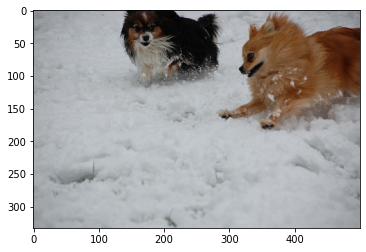

Greedy Search: A man is standing on a rock .
Beam Search, K = 3: young boy in a red shirt is sitting on a rock .
Beam Search, K = 5: little boy in a red shirt is sitting on a mountain .
Beam Search, K = 7: little boy in a red shirt is sitting on a mountain .
Beam Search, K = 10: black and white dog runs through the water .


In [ ]:
pic = '2398605966_1d0c9e6a20.jpg'
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images_path+pic)
plt.imshow(x)
plt.show()

print("Greedy Search:",greedySearch(image, images_path, pic,  model_fer, emotion_map))
print("Beam Search, K = 3:",beam_search_predictions(image, images_path, pic,  model_fer, emotion_map, beam_index = 3))
print("Beam Search, K = 5:",beam_search_predictions(image, images_path, pic,  model_fer, emotion_map, beam_index = 5))
print("Beam Search, K = 7:",beam_search_predictions(image, images_path, pic,  model_fer, emotion_map, beam_index = 7))
print("Beam Search, K = 10:",beam_search_predictions(image, images_path, pic,  model_fer, emotion_map, beam_index = 10))

## Inception Model (Extra, attempted but could not run with limited RAM)

#### **References**
Dataset taken from here https://www.kaggle.com/c/challenges-in-representation-learning-facial-expression-recognition-challenge/data?select=fer2013.tar.gz


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


for some reason the following doesnt work so i had to go the long way.

In [ ]:
# %cd /drive/My\ Drive/BT4221/Inception # navigate to the shared folder 
# !ls

but essentially to navigate to our shared BT4221 folder > Inception 

In [ ]:
%cd drive
!ls

/content/drive
MyDrive


In [ ]:
%cd MyDrive/BT4221/Inception
!ls

/content/drive/.shortcut-targets-by-id/1Uy88tsAYnhTsofNWJZzdsSMxhZTIJRKD/BT4221/Inception
fer2013.csv	 Inception_model	 Inception-v3.h5  test.csv
Inception.ipynb  Inception-ResNet-v2.h5  ResNet-50.h5	  train.csv


In [ ]:
# DEPENDENCIES ########################################################################################################################################

# !pip install keras
# !pip install pandas
# !pip install scikit_image
# !pip install h5py

In [ ]:
# Hack to increase colab ram but doesnt work
# a = []
# while 1:
#     a.append("1")

In [ ]:
# IMPORTS #############################################################################################################################################

import numpy as np
import pandas as pd
from tensorflow.python.lib.io import file_io
from skimage.transform import resize
from tensorflow.keras.utils import to_categorical
from keras.applications.inception_v3 import InceptionV3
from keras.models import Model
from keras.layers import GlobalAveragePooling2D, Dense 
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam, SGD
from keras.callbacks import TensorBoard, ReduceLROnPlateau, EarlyStopping, Callback, CSVLogger, ModelCheckpoint
import h5py # For saving the model

In [ ]:
# IMPORTS FOR MODEL EVALUATION 
from keras.models import load_model
import itertools
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

In [ ]:
# PARAMETERS ##########################################################################################################################################

# Size of the images
img_height, img_width = 139, 139
# img_height, img_width = 48, 48

# Parameters
num_classes         = 7     # ['Anger', 'Disgust', 'Fear', 'Happiness', 'Sadness', 'Surprise', 'Neutral']
epochs_top_layers   = 5
epochs_all_layers   = 50    # reduced epochs
batch_size          = 128

Using train.csv and test.csv (Defunct)

In [ ]:
# DATASETS ############################################################################################################################################

# Folder where logs and models are stored
#folder = 'gs://emotion_recognition/logs/Inception-v3'

# Data paths
# train_dataset	= './train.csv'
# eval_dataset 	= './test.csv'

Retrieve full fer dataset instead with Training, PrivateTest and PublicTest

In [ ]:
# fer data
fer_data = pd.read_csv('fer2013.csv', names=['emotion','pixels','usage'], na_filter=False)
im=fer_data['pixels']

fer_data = fer_data.iloc[1:]
fer_data['emotion'] = fer_data['emotion'].astype(str).astype(int)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
fer_data.head()

,emotion,pixels,usage
1,0,70 80 82 72 58 58 60 63 54 58 60 48 89 115 121...,Training
2,0,151 150 147 155 148 133 111 140 170 174 182 15...,Training
3,2,231 212 156 164 174 138 161 173 182 200 106 38...,Training
4,4,24 32 36 30 32 23 19 20 30 41 21 22 32 34 21 1...,Training
5,6,4 0 0 0 0 0 0 0 0 0 0 0 3 15 23 28 48 50 58 84...,Training


#### **Data preparation**
Ram will **collapse** and reset everything saved (can skip)
- With data augmentation


i. Data Preprocessing

In [ ]:
# Split data into training, validation and test set
data_train = fer_data[fer_data['usage']=='Training'].copy()
data_val   = fer_data[fer_data['usage']=='PublicTest'].copy()
data_test  = fer_data[fer_data['usage']=='PrivateTest'].copy()
print("train shape: {}, \nvalidation shape: {}, \ntest shape: {}".format(data_train.shape, data_val.shape, data_test.shape))

train shape: (28709, 3), 
validation shape: (3589, 3), 
test shape: (3589, 3)


In [ ]:
def load_faces_emotions(data): 
    
    image_size=(48,48)
    data = (data[data['pixels'].notnull()])
    pixels = data['pixels'].tolist()
    width, height = 48, 48
    faces = [] 
    
    for pixel_sequence in pixels:
        face = [int(pixel) for pixel in pixel_sequence.split(' ')]
        # face = np.asarray(face).reshape(48, 48) # Dimension: 48x48
        # face = resize(face, (139, 139), order = 3, mode = 'constant') # Dimension: 139x139x3 (Bicubic) 

        face = np.asarray(face).reshape(width, height)
        face = resize(face, (height, width), order = 3, mode = 'constant')  # Dimension: 139x139x3 (Bicubic) 
        #face = cv2.resize(face.astype('uint8'),image_size)

        faces.append(face.astype('float32'))
        
    faces = np.asarray(faces)
    faces = normalize_images(faces)
    faces = np.expand_dims(faces, -1)
    emotions = to_categorical(data['emotion'])
    
    return faces, emotions 

In [ ]:
def normalize_images(x):
    
    x = x.astype('float32')
    x = x / 255.0
        
    return x

In [ ]:
X_train, y_train = load_faces_emotions(data_train)
X_train = normalize_images(X_train)

X_val, y_val = load_faces_emotions(data_val)
X_val = normalize_images(X_val)

X_test, y_test = load_faces_emotions(data_test)
X_test = normalize_images(X_test)

# faces, emotions = load_faces_emotions(fer_data) -resnet method (combined the two so it fits into this model)
# faces = normalize_images(faces) -resnet
# X_train, X_test, y_train, y_test = train_test_split(faces, emotions, test_size=0.2,shuffle=True) -original method

**Original ver**

In [ ]:
# DATA PREPARATION ####################################################################################################################################

# Preprocesses a numpy array encoding a batch of images
    # x: Input array to preprocess
# def preprocess_input(x):
#     x /= 127.5
#     x -= 1.
#     return x

# # Function that reads the data from the csv file, increases the size of the images and returns the images and their labels
#     # dataset: Data path
# def get_data(dataset):
#     file_stream = file_io.FileIO(dataset, mode='r')
#     data = pd.read_csv(file_stream)
#     pixels = data['pixels'].tolist()
#     images = np.empty((len(data), img_height, img_width, 3))
#     i = 0

#     for pixel_sequence in pixels:
#         single_image = [float(pixel) for pixel in pixel_sequence.split(' ')]  # Extraction of each single
#         single_image = np.asarray(single_image).reshape(48, 48) # Dimension: 48x48
#         single_image = resize(single_image, (img_height, img_width), order = 3, mode = 'constant') # Dimension: 139x139x3 (Bicubic)
#         ret = np.empty((img_height, img_width, 3))  
#         ret[:, :, 0] = single_image
#         ret[:, :, 1] = single_image
#         ret[:, :, 2] = single_image
#         images[i, :, :, :] = ret
#         i += 1
    
#     images = preprocess_input(images)
#     labels = to_categorical(data['emotion'])

#     return images, labels    

# # Data preparation
# train_data_x, train_data_y  = get_data(train_dataset)
# val_data  = get_data(eval_dataset)

ii. Data Augmentation

In [ ]:
# Generate batches of tensor image data with real-time data augmentation. The data will be looped over (in batches) indefinitely
# rescale:          Rescaling factor (defaults to None). Multiply the data by the value provided (before applying any other transformation)
# rotation_range:   Int. Degree range for random rotations
# shear_range:      Float. Shear Intensity (Shear angle in counter-clockwise direction as radians)
# zoom_range:       Float or [lower, upper]. Range for random zoom. If a float, [lower, upper] = [1-zoom_range, 1+zoom_range]
# fill_mode :       Points outside the boundaries of the input are filled according to the given mode: {"constant", "nearest", "reflect" or "wrap"}
# horizontal_flip:  Boolean. Randomly flip inputs horizontally
train_datagen = ImageDataGenerator(
    rotation_range  = 10,
    shear_range     = 10, # 10 degrees
    zoom_range      = 0.1,
    fill_mode       = 'reflect',
    horizontal_flip = True)

# Takes numpy data & label arrays, and generates batches of augmented/normalized data. Yields batcfillhes indefinitely, in an infinite loop
    # x:            Data. Should have rank 4. In case of grayscale data, the channels axis should have value 1, and in case of RGB data, 
    #               it should have value 3
    # y:            Labels
    # batch_size:   Int (default: 32)
train_generator = train_datagen.flow(
    X_train,
    y_train,
    batch_size  = batch_size)

#### **Model training**
technically can skip bc **i have the trained models** in the same directory
- Inception-v3.h5
- Inception-ResNet-v2.h5	
- ResNet-50.h5	 

iii. Model Building

In [ ]:
# MODEL ###############################################################################################################################################

# Create the base pre-trained model
    # include_top:  Whether to include the fully-connected layer at the top of the network
    # weights:      Pre-training on ImageNet
    # input_shape:  Optional shape tuple, only to be specified if include_top is False (otherwise the input shape has to be (299, 299, 3) 
    #               (with 'channels_last' data format) or (3, 299, 299) (with 'channels_first' data format). It should have exactly 3 inputs channels, 
    #               and width and height should be no smaller than 139. E.g. (150, 150, 3) would be one valid value
# Returns a keras Model instance
base_model = InceptionV3(
    include_top = False,
    weights     = 'imagenet',
    input_shape = (img_height, img_width, 3))

# Places x as the output of the pre-trained model
x = base_model.output

# Add a global spatial average pooling layer
    # data_format:  The ordering of the dimensions in the inputs. Default: channels_last (batch, height, width, channels)
    # input shape:  4D tensor with shape: (batch_size, rows, cols, channels)
    # output shape: 2D tensor with shape: (batch_size, channels) => (None, 2048)
x = GlobalAveragePooling2D()(x)

# Add a fully-connected layer and a logistic layer
# Dense implements the operation: output = activation(dot(input, kernel) + bias(only applicable if use_bias is True))
    # units:        Positive integer, dimensionality of the output space
    # activation:   Activation function to use
    # input shape:  nD tensor with shape: (batch_size, ..., input_dim)
    # output shape: nD tensor with shape: (batch_size, ..., units)
x = Dense(1024, activation = 'relu')(x)
predictions = Dense(num_classes, activation = 'softmax')(x)

# The model we will train
model = Model(inputs = base_model.input, outputs = predictions)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 139, 139, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_94 (Conv2D)             (None, 69, 69, 32)   864         ['input_2[0][0]']                
                                                                                                  
 batch_normalization_94 (BatchN  (None, 69, 69, 32)  96          ['conv2d_94[0][0]']              
 ormalization)                                                                                    
                                                                                            

In [ ]:
# import os
# os.mkdir("./Inception_model")

In [ ]:
# Folder where logs and models are stored
folder = './Inception_model'

In [ ]:
print(X_train.shape, y_train.shape, X_val.shape, y_val.shape)

(28709, 48, 48, 1) (28709, 7) (3589, 48, 48, 1) (3589, 7)


**Upper Layers Training**

In [ ]:
# UPPER LAYERS TRAINING ###############################################################################################################################

# First: train only the top layers (which were randomly initialized) freezing all convolutional ResNet50 layers
for layer in base_model.layers:
    layer.trainable = False

In [ ]:
# Compile (configures the model for training) the model (should be done *AFTER* setting layers to non-trainable)
    # optimizer:    String (name of optimizer) or optimizer object
        # lr:       Float >= 0. Learning rate
        # beta_1:   Float, 0 < beta < 1. Generally close to 1
        # beta_2:   Float, 0 < beta < 1. Generally close to 1
        # epsilon:  Float >= 0. Fuzz factor
        # decay:    Float >= 0. Learning rate decay over each update
    # loss:     String (name of objective function) or objective function
    # metrics:  List of metrics to be evaluated by the model during training and testing
model.compile(
    optimizer   = Adam(lr = 1e-3, beta_1 = 0.9, beta_2 = 0.999, epsilon = 1e-08, decay = 0.0), 
    loss        = 'sparse_categorical_crossentropy', # sparse_categorical_crossentropy vs categorical_crossentropy
    metrics     = ['accuracy'])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


**Callbacks definition**



This callback writes a log for TensorBoard, which allows you to visualize dynamic graphs of your training and test metrics, as well as activation histograms for the different layers in your model <br>


*   log_dir:          The path of the directory where to save the log files to be parsed by TensorBoard
*   histogram_freq:   Frequency (in epochs) at which to compute activation and weight histograms for the layers of the model

If set to 0, histograms won't be computed. Validation data (or split) must be specified for histogram visualizations <br>


*   write_graph:      Whether to visualize the graph in TensorBoard. The log file can become quite large when write_graph is set to True
*   write_grads:      Whether to visualize gradient histograms in TensorBoard. histogram_freq must be greater than 0
*   write_images:     Whether to write model weights to visualize as image in TensorBoard


To visualize the files created during training, run in your terminal: tensorboard --logdir path_to_current_dir/Graph


> **Troubleshooting I tried**
> 1. Both resnets and inception original callbacks definitions throw the following error ```ValueError: Shapes (None, 1) and (None, 7) are incompatible``` but where is ```(None,1)``` from TT <br>
> 2. Changing `categorical_classification` to `sparse_categorical_classification` as recommended on SO gave another error ```InvalidArgumentError:  input depth must be evenly divisible by filter depth: 1 vs 3```
> 3. Added one hot encoding under load_face_emotions where it returns one hot encoded emotion/label `to_categorical(data[emotions])` instead of just `data[emotions]` and now no matter if its sparse or just categorical classification the same error of input depth must be evenly divisible by filter depth.


In [ ]:
# tensorboard_top_layers = TensorBoard(
# 	log_dir         = folder + '/logs_top_layers',
# 	histogram_freq  = 0,
# 	write_graph     = True,
# 	write_grads     = False,
# 	write_images    = True)

In [ ]:
# Parameters ##############################################

# batch_size = 32
# num_epochs = 50
# input_shape = (48, 48, 3)
# verbose = 1
# num_classes = 7
patience = 25
# l2_regularization=0.01

Resnets Callback definition

In [ ]:
base_path = folder
log_file_path = base_path + '_emotion_training.log'
csv_logger = CSVLogger(log_file_path, append=False)
early_stop = EarlyStopping('val_loss', patience=patience)
reduce_lr = ReduceLROnPlateau('val_loss', factor=0.1, patience=int(patience/2), verbose=1)
trained_models_path = base_path + '_mini_XCEPTION'
model_names = trained_models_path + '.{epoch:02d}-{val_accuracy:.2f}.hdf5'
model_checkpoint = ModelCheckpoint(model_names, 'val_loss', verbose=1,save_best_only=True)
callbacks = [model_checkpoint, csv_logger, early_stop, reduce_lr]

In [ ]:
print(model.input.shape)
print(model.output.shape)

(None, 139, 139, 3)
(None, 7)


In [ ]:
# Train the model on the new data for a few epochs (Fits the model on data yielded batch-by-batch by a Python generator)
    # generator:        A generator or an instance of Sequence (keras.utils.Sequence) object in order to avoid duplicate data when using multiprocessing
    #                   The output of the generator must be either {a tuple (inputs, targets)} {a tuple (inputs, targets, sample_weights)}
    # steps_per_epoch:  Total number of steps (batches of samples) to yield from generator before declaring one epoch finished and starting the next epoch
    #                   It should typically be equal to the number of unique samples of your dataset divided by the batch size 
    # epochs:           Integer, total number of iterations on the data
    # validation_data:  This can be either {a generator for the validation data } {a tuple (inputs, targets)} {a tuple (inputs, targets, sample_weights)}
    # callbacks:        List of callbacks to be called during training (to visualize the files created during training, run in your terminal:
    #                   tensorboard --logdir path_to_current_dir/Graph)
model.fit_generator(
    generator           = train_generator,
    steps_per_epoch     = len(X_train) // batch_size,  # samples_per_epoch / batch_size
    epochs              = epochs_top_layers,                            
    validation_data     = (X_val, y_val), 
    callbacks           = callbacks)     #callbacks           = [tensorboard_top_layers]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  from ipykernel import kernelapp as app


Epoch 1/5


InvalidArgumentError: ignored

In [ ]:
# FULL NETWORK TRAINING ###############################################################################################################################

# At this point, the top layers are well trained and we can start fine-tuning convolutional layers from Inception-v3

# Fine-tuning of all the layers
for layer in model.layers:
    layer.trainable = True

# We need to recompile the model for these modifications to take effect (we use SGD with nesterov momentum and a low learning rate)
    # optimizer:    String (name of optimizer) or optimizer object
        # lr:       float >= 0. Learning rate
        # momentum: float >= 0. Parameter updates momentum
        # decay:    float >= 0. Learning rate decay over each update
        # nesterov: boolean. Whether to apply Nesterov momentum
    # loss:     String (name of objective function) or objective function
    # metrics:  List of metrics to be evaluated by the model during training and testing
model.compile(
    optimizer   = SGD(lr = 1e-4, momentum = 0.9, decay = 0.0, nesterov = True),
    loss        = 'categorical_crossentropy', 
    metrics     = ['accuracy'])

# This callback writes a log for TensorBoard, which allows you to visualize dynamic graphs of your training and test metrics, 
tensorboard_all_layers = TensorBoard(
    log_dir         = folder + '/logs_all_layers',
    histogram_freq  = 0,
    write_graph     = True,
    write_grads     = False,
    write_images    = True)

# Reduce learning rate when a metric has stopped improving
	# monitor: 	Quantity to be monitored
	# factor: 	Factor by which the learning rate will be reduced. new_lr = lr * factor
	# patience:	Number of epochs with no improvement after which learning rate will be reduced
	# mode: 	One of {auto, min, max}
	# min_lr:	Lower bound on the learning rate
reduce_lr = ReduceLROnPlateau(
	monitor 	= 'val_loss',
	factor		= 0.4,
	patience	= 5,
	mode 		= 'auto',
	min_lr		= 1e-6)

# Stop training when a monitored quantity has stopped improving
	# monitor:		Quantity to be monitored
	# patience:		Number of epochs with no improvement after which training will be stopped
	# mode: 		One of {auto, min, max}
early_stop = EarlyStopping(
	monitor 	= 'val_loss',
	patience 	= 20,
	mode 		= 'auto')

class ModelCheckpoint(Callback):

	def __init__(self, filepath, folder, monitor = 'val_loss', verbose = 0, save_best_only = False, save_weights_only = False, mode = 'auto', period = 1):
		super(ModelCheckpoint, self).__init__()
		self.monitor 				= monitor
		self.verbose		 		= verbose
		self.filepath 				= filepath
		self.folder 				= folder
		self.save_best_only 		= save_best_only
		self.save_weights_only		= save_weights_only
		self.period 				= period
		self.epochs_since_last_save	= 0
		
		if mode not in ['auto', 'min', 'max']:
			warnings.warn('ModelCheckpoint mode %s is unknown, ' 'fallback to auto mode.' % (mode), RuntimeWarning)
			mode = 'auto'

		if mode == 'min':
			self.monitor_op = np.less
			self.best = np.Inf
		elif mode == 'max':
			self.monitor_op = np.greater
			self.best = -np.Inf
		else:
			if 'acc' in self.monitor or self.monitor.startswith('fmeasure'):
			    self.monitor_op = np.greater
			    self.best = -np.Inf
			else:
			    self.monitor_op = np.less
			    self.best = np.Inf
	
	def on_epoch_end(self, epoch, logs=None):
		logs = logs or {}
		self.epochs_since_last_save += 1
		if self.epochs_since_last_save >= self.period:
			self.epochs_since_last_save = 0
			filepath = self.filepath.format(epoch = epoch + 1, **logs)
			if self.save_best_only:
				current = logs.get(self.monitor)
				if current is None:
				    warnings.warn('Can save best model only with %s available, ' 'skipping.' % (self.monitor), RuntimeWarning)
				else:
					if self.monitor_op(current, self.best):
					    if self.verbose > 0:
					        print('\nEpoch %05d: %s improved from %0.5f to %0.5f,' ' saving model to %s' % (epoch + 1, self.monitor, self.best, current, filepath))
					    self.best = current
					    if self.save_weights_only:
					        self.model.save_weights(filepath, overwrite=True)
					    else:
							self.model.save(filepath, overwrite=True)
							# Save model.h5 on to google storage
							with file_io.FileIO(filepath, mode='r') as input_f:
								with file_io.FileIO(self.folder + '/checkpoints/' + filepath, mode='w+') as output_f:	# w+ : writing and reading
									output_f.write(input_f.read())
					else:
						if self.verbose > 0:
						    print('\nEpoch %05d: %s did not improve' %
						          (epoch + 1, self.monitor))
			else:
				if self.verbose > 0:
				    print('\nEpoch %05d: saving model to %s' % (epoch + 1, filepath))
				if self.save_weights_only:
				    self.model.save_weights(filepath, overwrite=True)
				else:
					self.model.save(filepath, overwrite=True)
					# Save model.h5 on to google storage
					with file_io.FileIO(filepath, mode='r') as input_f:
						with file_io.FileIO(self.folder + '/checkpoints/' + filepath, mode='w+') as output_f:	# w+ : writing and reading
							output_f.write(input_f.read())

# Save the model after every epoch
	# filepath:       String, path to save the model file
	# monitor:        Quantity to monitor {val_loss, val_acc}
	# save_best_only: If save_best_only=True, the latest best model according to the quantity monitored will not be overwritten
	# mode:           One of {auto, min, max}. If save_best_only = True, the decision to overwrite the current save file is made based on either
	#			      the maximization or the minimization of the monitored quantity. For val_acc, this should be max, for val_loss this should
	#			      be min, etc. In auto mode, the direction is automatically inferred from the name of the monitored quantity
	# period:         Interval (number of epochs) between checkpoints
check_point = ModelCheckpoint(
	filepath		= 'Inception-v3_{epoch:02d}_{val_loss:.2f}.h5',
	folder 			= folder,
	monitor 		= 'val_loss', # Accuracy is not always a good indicator because of its yes or no nature
	save_best_only	= True,
	mode 			= 'auto',
	period			= 1)

# We train our model again (this time fine-tuning all the inception blocks)
model.fit_generator(
    generator           = train_generator,
    steps_per_epoch     = len(X_train) // batch_size,  # samples_per_epoch / batch_size 
    epochs              = epochs_all_layers,                        
    validation_data     = (X_val, y_val),
    callbacks           = [tensorboard_all_layers, reduce_lr, early_stop, check_point])

# SAVING ##############################################################################################################################################

# Saving the model in the workspace
model.save('Inception-v3.h5')
# Save model.h5 on to google storage
with file_io.FileIO('Inception-v3.h5', mode='r') as input_f:
    with file_io.FileIO(folder + '/Inception-v3.h5', mode='w+') as output_f:  # w+ : writing and reading
        output_f.write(input_f.read())

#### **Model evaluation**


Visualise training performance

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

Predicting against withheld test dataset

In [ ]:
# Reinstantiate the fine-tuned model (Also compiling the model using the saved training configuration (unless the model was never compiled))
#model = load_model("./Inception-v3.h5")
#model = load_model("drive/My Drive/Colab Notebooks/Inception-v3.h5")
model = load_model("/content/drive/My Drive/colab/bt4221/FER-2013/Inception-v3.h5")

batch_size = 1

In [ ]:
images, labels = X_test, y_test

In [ ]:
# Generates output predictions for the input samples
	# x: 			The input data, as a Numpy array
	# batch_size: 	Integer. If unspecified, it will default to 32
# Returns a numpy array of predictions
predictions = model.predict(
	images,
	batch_size	= batch_size)

predicted_classes	= np.argmax(predictions, axis = 1)		# Returns the class (position of the row) of maximum prediction
true_classes 		=  labels 								# Returns the correct classes associated with the predictions
class_names 		= list(["Anger", "Disgust", "Fear", "Happinness", "Sadness", "Surprise", "Neutral"])	# Returns the names of the classes

# Accuracy classification score. In multilabel classification, this function computes subset accuracy: 
# the set of labels predicted for a sample must exactly match the corresponding set of labels in y_true
	# true_classes:			Ground truth (correct) labels
	# predicted_classes:	Predicted labels, as returned by a classifier
	# normalize:			If False, return the number of correctly classified samples. Otherwise, return the fraction of correctly
	#		 				classified samples (default = True)
# If normalize == True, returns the correctly classified samples (float), else it returns the number of correctly classified samples (int).
accuracy = accuracy_score(
	true_classes, 
	predicted_classes, 
	normalize = True)

In [ ]:
# Build a text report showing the main classification metrics
	# true_classes:			Ground truth (correct) target values
	# predicted_classes:	Estimated targets as returned by a classifier
	# target_names:			Optional display names matching the labels (same order)
# Returns text summary of the precision, recall and F1 score for each class
report = classification_report(
	true_classes, 
	predicted_classes,
	target_names = class_names)

# Print the result of the evaluation
print("Accuracy:")
print(accuracy)
print("\n")
print("Report:")
print(report)
print("\n")

In [ ]:
print("Confusion Matrix")
cm = confusion_matrix(true_classes, predicted_classes)
cm

In [ ]:
import seaborn as sn
cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
df_cm = pd.DataFrame(cm, class_names,class_names)
#plt.figure(figsize = (10,7))
sn.set(font_scale=1)#for label size
sn.heatmap(df_cm, annot=True,annot_kws={"size": 8})# font size

plt.show()

In [ ]:
def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
  lb = LabelBinarizer()
  lb.fit(y_test)
  y_test = lb.transform(y_test)
  y_pred = lb.transform(y_pred)
  return roc_auc_score(y_test, y_pred, average=average)

In [ ]:
from sklearn.preprocessing import LabelBinarizer
auc_sc=multiclass_roc_auc_score(true_classes, predicted_classes, average="macro")
auc_sc